# Pipeline XAI

The pipeline, figure 1, presents the steps: Selection of 41 datasets referring to binary classification problems present in the OpenML platform, figure 1 (A); Utilization of 15 property parameters from all 41 analyzed datasets (provided by OpenML OpenML platform), figure 1 (B); Application of the Kmeans clustering algorithm in the dataset properties table, followed by a Multiple Correspondence Analysis, figure 1 (C); Pre-processing of the 41 datasets selected in the initial step, figure 1 (D); Use of 4 tree-ensemble algorithms in each of the 41 datasets to create black-box models, figure 1 (E); Use 6 XAI methods present in the literature and eXirt (method proposed in this article) to create global explanations based on feature relevance ranks, figure 1 (F) and (G); Comparison of the feature relevance ranks found by eXirt with the ranks of the other XAI methods (considering the existing dataset clusters), figure 1 (H); Use the item parameter estimates created by eXirt in step (F) and create local explanations of the analyzed models, figure 1 (I).

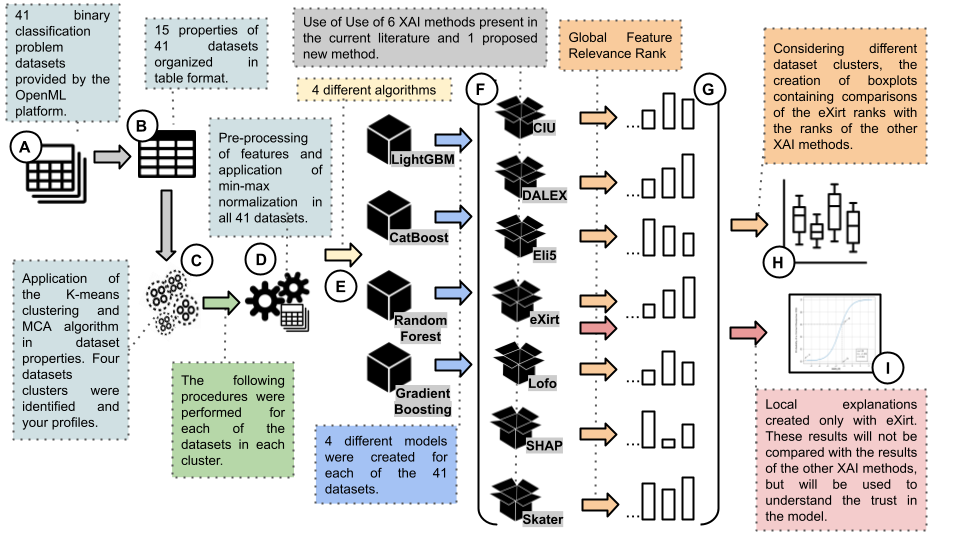

Note:. To run the code below correctly, you must run each cell (1 single time) in the same sequence as shown below:

In [4]:
do_download_workspace = True
do_download = False

path_content = '/content'
path_fig = '/out_fig'
path_csv = '/out_csv'
path_model = '/out_model'
path_irt = '/out_irt'
path_dataset = '/*'

!rm -r $path_content$path_fig
!rm -r $path_content$path_csv
!rm -r $path_content$path_model
!rm -r $path_content$path_irt


!mkdir $path_content$path_fig
!mkdir $path_content$path_csv
!mkdir $path_content$path_model
!mkdir $path_content$path_irt

def dirByDataset(datasetName):
  !mkdir $path_content$path_fig$datasetName
  !mkdir $path_content$path_csv$datasetName
  !mkdir $path_content$path_model$datasetName
  !mkdir $path_content$path_irt$datasetName

## Install dependences

Set of libraries and software packages needed to run all program steps.

Note, specific versions are required in some cases!

In [2]:
import warnings
warnings.filterwarnings('ignore')

Due to the instability of google colab, this cell below may show package dependency errors a few times it is executed.

If this happens, go to "Runtime > Disconnect and Delete Runtime" and run the notebook again.

In [3]:
# XAI Tools
#!pip install --upgrade scikit-learn==0.20.3
!pip install --upgrade scikit-learn==0.22
!pip install lofo-importance
!pip install git+https://github.com/oracle/Skater.git #online usa-se este
#!pip install -U --no-deps --force-reinstall --install-option="--rl=True" skater==1.1.2
#!pip install -U skater==1.1.2 -q #local usa-se este

!pip install info_gain
!pip install shap
!pip install eli5
!pip install dalex
!pip install py-ciu
!pip install plotly
!pip install adjustText
!pip install scikit_posthocs

!pip install lightgbm
!pip install catboost

!pip install openml
!pip install rpy2
!pip install catsim

import eli5
import shap
import dalex as dx
import numpy as np
import pandas as pd
import openml
import pickle
import matplotlib.pyplot as plt
import statistics
import os
import gc
import math
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import seaborn as sns
import scikit_posthocs as sp
import copy
import lightgbm as lgb
import random


from sklearn.ensemble import AdaBoostClassifier
from ciu import determine_ciu
from lofo import LOFOImportance, FLOFOImportance, Dataset
from info_gain import info_gain
from skater.core.explanations import Interpretation
from skater.model import InMemoryModel
from sklearn.base import clone
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.metrics import auc
from sklearn.metrics import accuracy_score
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from scipy.stats import friedmanchisquare
from scipy.stats import spearmanr
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import silhouette_samples, silhouette_score
from google.colab import files
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from matplotlib import cm
from matplotlib.colors import ListedColormap
from tqdm import tqdm
from sklearn.cluster import KMeans
from sklearn.cluster import AffinityPropagation
from sklearn import preprocessing
from matplotlib.pyplot import figure
from catboost import CatBoostClassifier
from eli5.sklearn import PermutationImportance



from sklearn.datasets import load_wine
from sklearn.datasets import load_iris


from re import A
from scipy.special import expit
from numpy import percentile, concatenate, array, linspace, append

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 55.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for scikit-learn: filename=scikit_learn-0.22-cp310-cp310-linux_x86_64.whl size=23186822 sha256=52d29edfd39f74475a4a199869f26c1b2d78403798dd0d86010d4d37fef68edd
  Stored in directory: /root/.cache/pip/wheels/a8/a8/42/cf60e8eea7068ab704ddfbca37e6b1e1d15c436616ca61a530
Successfully built scikit-learn
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imbalanced-learn 0.10.1 requires scikit-learn>=1.0.2, but you have scikit-learn 0.22 which is incompatible.
lightgb

## Util

In [5]:
class Util():
  def is_int(n):
    isInteger = False
    for i in range(len(n)):
      if isinstance(n[i],float):
        return False
    return True

  def identifyCatFeatures(X):
    categorical_features = []
    for i, c in enumerate(X.columns.to_list()):
      if X[c].dtype == "category":
        categorical_features.append(c)
    return categorical_features

  def powerSetLimited(s,l):

    def powerset(s):
      x = len(s)
      masks = [1 << i for i in range(x)]
      for i in range(1 << x):
          yield [ss for mask, ss in zip(masks, s) if i & mask]

    psl = []
    ps = list(powerset(s))
    for _,i in enumerate(ps):
      if len(i) <= l and len(i)>0:
        psl.append(i)
    return psl

  def auc_score(y, y_pred):

    fpr, tpr, thresholds = metrics.roc_curve(y, y_pred, pos_label=2)

    return metrics.auc(fpr, tpr)


## XAI tools (Ciu,Dalex, Eli5, Lofo, Shap, Skater and eXirt)

In [6]:
!pip install eXirt
!wget https://raw.githubusercontent.com/josesousaribeiro/eXirt-XAI-Benchmark/main/decodIRT/decodIRT_MLtIRT.py
!wget https://raw.githubusercontent.com/josesousaribeiro/eXirt-XAI-Benchmark/main/decodIRT/decodIRT_analysis.py

from pyexirt import eXirt as explainer

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for eXirt: filename=eXirt-1.0.2-py3-none-any.whl size=19180 sha256=9adf86acefcaf8e9d937896d42636a5208a15f0c83096c2527d09d48f2b87056
  Stored in directory: /root/.cache/pip/wheels/52/b7/fa/c073883bb93d5b70c83be520fd8b5f8c0a039dc66ff49cb04a
Successfully built eXirt
--2023-06-14 16:57:53--  https://raw.githubusercontent.com/josesousaribeiro/eXirt-XAI-Benchmark/main/decodIRT/decodIRT_MLtIRT.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7453 (7.3K) [text/plain]
Saving to: ‘decodIRT_MLtIRT.py’

decodIRT_MLtIRT.py  100%[===================>]   7.28K  --.-KB/s    in 0s      

2023-06-14 16:57:53 (53.0 MB/s) 

In [7]:
#EXirt
explainer = explainer.eXirt()

In [8]:
"""
Created on Thu Feb  4 14:32:39 2021

@author: Jose Ribeiro
"""
class ExplainableTools():
  def explainRankByLofo(model,X,Y,names_x_attributes):
    df = X.copy()
    df['class'] = Y.to_list()
    dataset = Dataset(df=df, target="class", features=names_x_attributes)
    fi = LOFOImportance(dataset, scoring='accuracy', model=model)
    importances = fi.get_importance()
    importances = importances.sort_values(by=['importance_mean','feature'],ascending=False) #fix problem of equals values of explaination
    return importances['feature'].to_list()

  def explainRankByEli5(model, X, Y):
      perm = PermutationImportance(model, random_state=42).fit(X, Y)
      rank = eli5.show_weights(perm, feature_names = X.columns.tolist(),top=-1)
      rank = pd.read_html(rank.data)[0]
      rank = rank.sort_values(by=['Weight','Feature'], ascending=False) #fix problem of equals values of explaination
      return rank['Feature'].to_list()


  def explainRankByKernelShap(model,x_features_names, X,is_gradient=False): # shap.sample(data, K) or shap.kmeans(data, K)
    np.random.seed(0)
    explainer = shap.KernelExplainer(model.predict_proba, X[:],nsamples=len(x_features_names))
    shap_values = explainer.shap_values(X[:])
    if is_gradient == False:
        vals= np.abs(shap_values).sum(1)
    else:
        vals= np.abs([shap_values]).sum(1) #correction []
    temp_df = pd.DataFrame(list(zip(x_features_names, sum(vals))), columns=['feat_name','shap_value'])
    temp_df = temp_df.sort_values(by=['shap_value','feat_name'], ascending=False) #fix problem of equals values of explaination
    return list(temp_df['feat_name'])


  def explainRankByTreeShap(model, x_features_names, X, is_gradient=False):
      np.random.seed(0)
      shap_values = shap.TreeExplainer(model, feature_perturbation='interventional').shap_values(X)
      if is_gradient == False:
        vals= np.abs(shap_values).mean(0)
      else:
        vals= np.abs([shap_values]).mean(0) #correction []
      temp_df = pd.DataFrame(list(zip(x_features_names, sum(vals))), columns=['feat_name','shap_value'])
      temp_df = temp_df.sort_values(by=['shap_value','feat_name'], ascending=False) #fix problem of equals values of explaination

      return temp_df['feat_name'].to_list()

  def explainRankByCiu(model, x_test, X, feature_names,context_dic,rank):

    def _makeRankByCu(ciu):
      df_cu = pd.DataFrame(list(ciu.cu.items()), columns=['attribute', 'cu'])
      df_cu = df_cu.sort_values(by='cu', ascending=False)
      #ciu.plot_cu()
      return df_cu['attribute'].to_list()

    def _makeRankByCi(ciu):
      df_ci = pd.DataFrame(list(ciu.ci.items()), columns=['attribute', 'ci'])
      df_ci = df_ci.sort_values(by=['ci','attribute'], ascending=False) #fix problem of equals values of explaination
      return df_ci['attribute'].to_list()

    case = x_test.values[0]
    example_prediction = model.predict([x_test.values[0]])
    example_prediction_probs = model.predict_proba([x_test.values[0]])
    prediction_index = list(example_prediction_probs[0]).index(max(example_prediction_probs[0]))




    ciu = determine_ciu(
        x_test.iloc[[1]],
        model.predict_proba,
        X.to_dict('list'),
        samples = 1000,
        prediction_index = 1)

    if rank == 'ci':
      result = _makeRankByCi(ciu)
    else:
      if rank == 'cu':
        result = _makeRankByCu(ciu)
      else:
        result = {}

    #ciu
    return result

  def explainRankByAlibi(model_path,X_train): # -- deprecated
    model = tf.keras.models.load_model(model_path)
    ig  = IntegratedGradients(model, layer=None, method="gausslegendre",
                          n_steps=50, internal_batch_size=100)
    explanation = ig.explain(X_train, baselines=None, target=None)
    attributions = explanation.attributions
    return attributions

  def explainRankSkater(model, X):
    interpreter = Interpretation(X.to_numpy(), feature_names=X.columns.to_list())

    model_new = InMemoryModel(model.predict_proba,
                              examples=X.to_numpy(),
                              unique_values=model.classes_)

    rank = interpreter.feature_importance.feature_importance(model_new,
                                                             ascending=False,
                                                             progressbar=False,
                                                             n_jobs=1)
    rank = rank.to_frame(name='values')
    rank = rank.reset_index()
    rank = rank.rename(columns={'index':'variable','values':'values'})
    rank = rank.sort_values(by=['values','variable'], ascending=False) #fix problem of equals values of explaination
    return rank['variable'].to_list()

  def explainRankDalex(model, X_train, y_train):
    explainer = dx.Explainer(model, X_train, y_train,verbose=False)
    explanation = explainer.model_parts()
    rank = explanation.result
    rank = rank[rank.variable != '_baseline_']
    rank = rank[rank.variable != '_full_model_']
    rank = rank.sort_values(by=['dropout_loss','variable'], ascending=False) #fix problem of equals values of explaination
    return rank['variable'].tolist()

  #Calculando ganho de informacao
  def explainRankByInfoGain(X,Y, attribute_X_names):
    def InfoGain(data,attribute_X_name,target_name):
      """
      Calculate the information gain of a dataset. This function takes three parameters:
      1. data = The dataset for whose feature the IG should be calculated
      2. attribute_X_name = the name of the feature for which the information gain should be calculated
      3. target_name = the name of the target feature. The default for this example is "class"
      """

      def entropy(target_col):
        """
        Calculate the entropy of a dataset.
        The only parameter of this function is the target_col parameter which specifies the target column
        """
        elements,counts = np.unique(target_col,return_counts = True)
        entropy = np.sum([(-counts[i]/np.sum(counts))*np.log2(counts[i]/np.sum(counts)) for i in range(len(elements))])
        return entropy



      #Calculate the entropy of the total dataset
      total_entropy = entropy(data[target_name])

      ##Calculate the entropy of the dataset

      #Calculate the values and the corresponding counts for the split attribute
      vals,counts= np.unique(data[attribute_X_name],return_counts=True)

      #Calculate the weighted entropy
      Weighted_Entropy = np.sum([(counts[i]/np.sum(counts))*entropy(data.where(data[attribute_X_name]==vals[i]).dropna()[target_name]) for i in range(len(vals))])

      #Calculate the information gain
      result = total_entropy - Weighted_Entropy

      return result

    data = X.copy()
    target_name = 'class'
    data[target_name] = Y.to_list()

    rank = pd.Series([InfoGain(data,feature,target_name) for feature in attribute_X_names], index=attribute_X_names).sort_values(ascending=False)
    rank = rank.to_frame(name='values')
    rank = rank.reset_index()
    rank = rank.rename(columns={'index':'variable','values':'values'})
    rank = rank.sort_values(by=['values','variable'],ascending=False) #fix problem of equals values of explaination
    return rank['variable'].to_list()



## Preprocess

Class that performs all the pre-processing of the datasets used in the study. It was decided to implement a method for each dataset used, in order to allow greater control over data transformations - --

*   Min-max normalization;
*   Conversion from categorical to numeric attribute based on frequency;
*   Conversion of boolean attributes to integers.

In [9]:
# -*- coding: utf-8 -*-
"""
Created on Wed Feb  3 14:55:08 2021

@author: Jose Ribeiro
"""
class PreprocessDefault():

  def z_score_serie(s):
    # copy the dataframe
    s_std = s.copy()
    s_std = (s_std - s_std.mean()) / s_std.std()
    return s_std

  def z_score(df):
    # copy the dataframe
    df_std = df.copy()
    # apply the z-score method
    for column in df_std.columns:
        df_std[column] = (df_std[column] - df_std[column].mean()) / df_std[column].std()

    return df_std

  def normalize(df):
    # copy the dataframe
    df_norm = df.copy()
    # apply min-max scaling
    for column in df_norm.columns:
      if df[column].dtype != 'category':
        if(len(df_norm[column].unique()) > 1): #fix NaN generation
          df_norm[column] = (df_norm[column] - df_norm[column].min()) / (df_norm[column].max() - df_norm[column].min())
        else:
          df_norm[column] = 0
    return df_norm


  def PreprocessXY(X, Y):
    X = X.astype(float)
    Y = Y.astype(float)

    return X, Y

  def PreprocessXByDataset(X,datasetName):
          flagThereArePreprocess = False

          if datasetName == "credit-g":
              flagThereArePreprocess = True

              cleanup_nums = {
                      "checking_status": {"no checking":394, "<0": 274, "0<=X<200":269, ">=200":63},
                      "credit_history": {"existing paid":530, "critical/other existing credit": 293, "delayed previously":88, "all paid":49, "no credits/all paid":40},
                      "purpose": {"radio/tv":280, "new car":234, "furniture/equipment":181, "used car":103, "business": 97, "education":50, "repairs":  22, "domestic appliance":12, "other":12, "retraining":9},
                      "savings_status": {"<100": 603, "no known savings":183, "100<=X<500":103, "500<=X<1000":63, ">=1000":48},
                      "employment": {"1<=X<4":339, ">=7":253, "4<=X<7":174, "<1":172, "unemployed":62},
                      "personal_status": {"male single":548, "female div/dep/mar":310, "male mar/wid":92, "male div/sep":50},
                      "other_parties": {"none":907, "guarantor":52, "co applicant":41},
                      "property_magnitude": {"car":332, "real estate":282, "life insurance":232, "no known property":154},
                      "other_payment_plans": {"none":814, "bank":139, "stores":47},
                      "housing": {"own":713, "rent":179, "for free":108},
                      "job": {"skilled":630, "unskilled resident":200, "high qualif/self emp/mgmt":148, "unemp/unskilled non res":22},
                      "own_telephone": {"none":0, "yes":1},
                      "foreign_worker": {"yes":1, "no":0}
                      }
              obj_df = X.select_dtypes(include=['object']).copy()
              obj_df[obj_df.isnull().any(axis=1)]
              obj_df.head()
              X.replace(cleanup_nums, inplace=True)
              X.head()

          if datasetName == "blood-transfusion-service-center":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "monks-problems-2":
              flagThereArePreprocess = True
              X.attr1 = X.attr1.astype(int);
              X.attr2 = X.attr2.astype(int);
              X.attr3 = X.attr3.astype(int);
              X.attr4 = X.attr4.astype(int);
              X.attr5 = X.attr5.astype(int);
              X.attr6 = X.attr6.astype(int);

          if datasetName == "tic-tac-toe":
              flagThereArePreprocess = True

              cleanup_nums = {
                      "top-left-square": {"x": 418, "o": 335, "b":205},
                      "top-middle-square": {"x": 378, "o": 330, "b": 250},
                      "top-right-square": {"x": 418, "o": 335, "b":205},
                      "middle-left-square": {"x": 378, "o": 330,"b":250},
                      "middle-middle-square": {"x": 458, "o": 340, "b":160},
                      "middle-right-square": {"x": 378, "o": 330, "b":250},
                      "bottom-left-square": {"x": 418, "o": 335, "b": 205},
                      "bottom-middle-square": {"x": 378, "o": 330,"b": 250},
                      "bottom-right-square": {"x": 418, "o": 335,"b":205}
                      }
              obj_df = X.select_dtypes(include=['object']).copy()
              obj_df[obj_df.isnull().any(axis=1)]
              obj_df.head()
              X.replace(cleanup_nums, inplace=True)
              X.head()

          if datasetName == "monks-problems-1":
              flagThereArePreprocess = True
              X.attr1 = X.attr1.astype(int);
              X.attr2 = X.attr2.astype(int);
              X.attr3 = X.attr3.astype(int);
              X.attr4 = X.attr4.astype(int);
              X.attr5 = X.attr5.astype(int);
              X.attr6 = X.attr6.astype(int);


          if datasetName == "steel-plates-fault":
              flagThereArePreprocess = True
              X.columns = [
                            "X_Minimum","X_Maximum","Y_Minimum","Y_Maximum","Pixels_Areas",
                            "X_Perimeter","Y_Perimeter","Sum_of_Luminosity","Minimum_of_Luminosity",
                            "Maximum_of_Luminosity","Length_of_Conveyer","TypeOfSteel_A300","TypeOfSteel_A400",
                            "Steel_Plate_Thickness","Edges_Index","Empty_Index","Square_Index","Outside_X_Index",
                            "Edges_X_Index","Edges_Y_Index","Outside_Global_Index","LogOfAreas",
                            "Log_X_Index","Log_Y_Index","Orientation_Index","Luminosity_Index","SigmoidOfAreas",
                            "Pastry","Z_Scratch","K_Scatch","Stains","Dirtiness","Bumps"
                            ]
              print("All numeric")
              X.head()

          if datasetName == "kr-vs-kp":
              flagThereArePreprocess = True
              cleanup_nums = {
                      "bkblk":{ "f":2839,"t":357},
                      "bknwy":{ "f":2971,"t":225},
                      "bkon8":{ "f":3076,"t":120},
                      "bkona":{ "f":2874,"t":322},
                      "bkspr":{ "f":2129,"t":1067},
                      "bkxbq":{ "f":1722,"t":1474},
                      "bkxcr":{ "f":2026,"t":1170},
                      "bkxwp":{ "f":2500,"t":696},
                      "blxwp":{ "f":1980,"t":1216},
                      "bxqsq":{ "f":2225,"t":971},
                      "cntxt":{ "f":1817,"t":1379},
                      "dsopp":{ "f":2860,"t":336},
                      "dwipd":{ "g":991,"l":2205},
                      "hdchk":{ "f":3181,"t":15},
                      "katri":{ "b":224,"n":2526,"w":446},
                      "mulch":{ "f":3040,"t":156},
                      "qxmsq":{ "f":3099,"t":97},
                      "r2ar8":{ "f":1000,"t":2196},
                      "reskd":{ "f":3170,"t":26},
                      "reskr":{ "f":2714,"t":482},
                      "rimmx":{ "f":2612,"t":584},
                      "rkxwp":{ "f":2556,"t":640},
                      "rxmsq":{ "f":3013,"t":183},
                      "simpl":{ "f":1975,"t":1221},
                      "skach":{ "f":3185,"t":11},
                      "skewr":{ "f":980,"t":2216},
                      "skrxp":{ "f":3021,"t":175},
                      "spcop":{ "f":3195,"t":1},
                      "stlmt":{ "f":3149,"t":47},
                      "thrsk":{ "f":3060,"t":136},
                      "wkcti":{ "f":2631,"t":565},
                      "wkna8":{ "f":3021,"t":175},
                      "wknck":{ "f":1984,"t":1212},
                      "wkovl":{ "f":1189,"t":2007},
                      "wkpos":{ "f":851,"t":2345},
                      "wtoeg":{ "n":2407,"t":789}
                      }
              obj_df = X.select_dtypes(include=['object']).copy()
              obj_df[obj_df.isnull().any(axis=1)]
              obj_df.head()
              X.replace(cleanup_nums, inplace=True)
              X.head()

          if datasetName == "qsar-biodeg":
              flagThereArePreprocess = True
              X = X.astype(float)
              print("All numeric")

          if datasetName == "wdbc":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "phoneme":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "diabetes":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "ozone-level-8hr":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "kc2":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "eeg-eye-state":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "climate-model-simulation-crashes":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "spambase":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "kc1":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "ilpd":
              flagThereArePreprocess = True
              X.V2 = X.V2.map({"Female":1, "Male":0})
              X.V2 = X.V2.astype(int);

          if datasetName == "pc1":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "pc3":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "banknote-authentication":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "pc4":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "mozilla4":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "monks-problems-3":
              flagThereArePreprocess = True

              cleanup_nums = {
                  "attr1":{ "1":192,"2":184,"3":178},
                  "attr2":{ "1":183,"2":186,"3":185},
                  "attr3":{ "1":281,"2":273},
                  "attr4":{ "1":184,"2":182,"3":188},
                  "attr5":{ "1":140,"2":139,"3":136,"4":139},
                  "attr6":{ "1":275,"2":279}
                      }
              obj_df = X.select_dtypes(include=['object']).copy()
              obj_df[obj_df.isnull().any(axis=1)]
              obj_df.head()
              X.replace(cleanup_nums, inplace=True)
              X.head()


          if datasetName == "PhishingWebsites":
              flagThereArePreprocess = True
              cleanup_nums = {
                            "having_IP_Address":{ "-1":3793,"1":7262},
                            "URL_Length":{ "-1":8960,"0":135,"1":1960},
                            "Shortining_Service":{ "-1":1444,"1":9611},
                            "having_At_Symbol":{ "-1":1655,"1":9400},
                            "double_slash_redirecting":{ "-1":1429,"1":9626},
                            "Prefix_Suffix":{ "-1":9590,"1":1465},
                            "having_Sub_Domain":{ "-1":3363,"0":3622,"1":4070},
                            "SSLfinal_State":{ "-1":3557,"0":1167,"1":6331},
                            "Domain_registeration_length":{ "-1":7389,"1":3666},
                            "Favicon":{ "-1":2053,"1":9002},
                            "port":{ "-1":1502,"1":9553},
                            "HTTPS_token":{ "-1":1796,"1":9259},
                            "Request_URL":{ "-1":4495,"1":6560},
                            "URL_of_Anchor":{ "-1":3282,"0":5337,"1":2436},
                            "Links_in_tags":{ "-1":3956,"0":4449,"1":2650},
                            "SFH":{ "-1":8440,"0":761,"1":1854},
                            "Submitting_to_email":{ "-1":2014,"1":9041},
                            "Abnormal_URL":{ "-1":1629,"1":9426},
                            "Redirect":{ "0":9776,"1":1279},
                            "on_mouseover":{ "-1":1315,"1":9740},
                            "RightClick":{ "-1":476,"1":10579},
                            "popUpWidnow":{ "-1":2137,"1":8918},
                            "Iframe":{ "-1":1012,"1":10043},
                            "age_of_domain":{ "-1":5189,"1":5866},
                            "DNSRecord":{ "-1":3443,"1":7612},
                            "web_traffic":{ "-1":2655,"0":2569,"1":5831},
                            "Page_Rank":{ "-1":8201,"1":2854},
                            "Google_Index":{ "-1":1539,"1":9516},
                            "Links_pointing_to_page":{ "-1":548,"0":6156,"1":4351},
                            "Statistical_report":{ "-1":1550,"1":9505}
                        }
              obj_df = X.select_dtypes(include=['object']).copy()
              obj_df[obj_df.isnull().any(axis=1)]
              obj_df.head()
              X.replace(cleanup_nums, inplace=True)
              X.head()


          if datasetName == "churn":
              flagThereArePreprocess = True
              cleanup_nums = {
                  "area_code":{ "408":1259,"415":2495,"510":1246},
                  "international_plan":{ "0":4527,"1":473},
                  "voice_mail_plan":{ "0":3677,"1":1323},
                  "number_customer_service_calls":{ "0":1023,"1":1786,"2":1127,"3":665,"4":252,"5":96,"6":34,"7":13,"8":2,"9":2}
                      }
              obj_df = X.select_dtypes(include=['object']).copy()
              obj_df[obj_df.isnull().any(axis=1)]
              obj_df.head()
              X.replace(cleanup_nums, inplace=True)
              X.head()

          if datasetName == "Australian":
              flagThereArePreprocess = True
              cleanup_nums = {
                  "A1":{ "0":222,"1":468},
                  "A4":{ "1":163,"2":525,"3":2},
                  "A5":{ "1":53,"2":30,"3":59,"4":51,"5":10,"6":54,"7":38,"8":146,"9":64,"10":25,"11":78,"12":3,"13":41,"14":38},
                  "A6":{ "1":57,"2":6,"3":8,"4":408,"5":59,"7":6,"8":138,"9":8},
                  "A8":{ "0":329,"1":361},
                  "A9":{ "0":395,"1":295},
                  "A11":{ "0":374,"1":316},
                  "A12":{ "1":57,"2":625,"3":8}
                      }
              obj_df = X.select_dtypes(include=['object']).copy()
              obj_df[obj_df.isnull().any(axis=1)]
              obj_df.head()
              X.replace(cleanup_nums, inplace=True)
              X.head()

          if datasetName == "autoUniv-au1-1000":
                flagThereArePreprocess = True
                print("All numeric")

          if datasetName == "haberman":
                flagThereArePreprocess = True
                cleanup_nums = {
                    "Patients_year_of_operation":{ "58":36,"59":27,"60":28,"61":26,"62":23,"63":30,"64":31,"65":28,"66":28,"67":25,"68":13,"69":11}
                        }
                obj_df = X.select_dtypes(include=['object']).copy()
                obj_df[obj_df.isnull().any(axis=1)]
                obj_df.head()
                X.replace(cleanup_nums, inplace=True)
                X.head()

          if datasetName == "heart-statlog":
                flagThereArePreprocess = True
                print("All numeric")

          if datasetName == "ionosphere":
                flagThereArePreprocess = True
                print("All numeric")

          if datasetName == "sonar":
                flagThereArePreprocess = True
                print("All numeric")

          if datasetName == "Satellite":
                flagThereArePreprocess = True
                print("All numeric")

          if datasetName == "SPECT":
                flagThereArePreprocess = True
                cleanup_nums = {
                    "F1":{ "0":148,"1":119},
                    "F2":{ "0":201,"1":66},
                    "F3":{ "0":162,"1":105},
                    "F4":{ "0":191,"1":76},
                    "F5":{ "0":159,"1":108},
                    "F6":{ "0":204,"1":63},
                    "F7":{ "0":191,"1":76},
                    "F8":{ "0":153,"1":114},
                    "F9":{ "0":184,"1":83},
                    "F10":{ "0":166,"1":101},
                    "F11":{ "0":202,"1":65},
                    "F12":{ "0":188,"1":79},
                    "F13":{ "0":135,"1":132},
                    "F14":{ "0":186,"1":81},
                    "F15":{ "0":220,"1":47},
                    "F16":{ "0":184,"1":83},
                    "F17":{ "0":229,"1":38},
                    "F18":{ "0":232,"1":35},
                    "F19":{ "0":201,"1":66},
                    "F20":{ "0":181,"1":86},
                    "F21":{ "0":170,"1":97},
                    "F22":{ "0":157,"1":110}
                        }
                obj_df = X.select_dtypes(include=['object']).copy()
                obj_df[obj_df.isnull().any(axis=1)]
                obj_df.head()
                X.replace(cleanup_nums, inplace=True)
                X.head()

          if datasetName == "analcatdata_boxing1":
                flagThereArePreprocess = True
                cleanup_nums = {
                      "Judge":{ "Associated_Press":12,"Boxing_Monthly-Leach":12,"Boxing_Times":12,"E._Williams":12,"ESPN":12,"HBO-Lederman":12,"L._OConnell":12,"S._Christodoulu":12,"Sportsline":12,"Sportsticker":12},
                      "Official":{ "No":84,"Yes":36},
                      "Round":{ "1":10,"2":10,"3":10,"4":10,"5":10,"6":10,"7":10,"8":10,"9":10,"10":10,"11":10,"12":10}
                        }
                obj_df = X.select_dtypes(include=['object']).copy()
                obj_df[obj_df.isnull().any(axis=1)]
                obj_df.head()
                X.replace(cleanup_nums, inplace=True)
                X.head()

          if datasetName == "aids":
                flagThereArePreprocess = True
                cleanup_nums = {
                      "Age":{ "15-24":10,"25-34":10,"35-44":10,"45-54":10,"55_&_older":10},
                      "Race":{ "American_Indian_&_Alaska_Native":10,"Asian_&_Pacific_Islander":10,"Black_not_Hispanic":10,"Hispanic":10,"White_not_Hispanic":10},
                      }
                obj_df = X.select_dtypes(include=['object']).copy()
                obj_df[obj_df.isnull().any(axis=1)]
                obj_df.head()
                X.replace(cleanup_nums, inplace=True)
                X.head()

          if datasetName == "servo":
              flagThereArePreprocess = True
              cleanup_nums = {
                    "motor":{ "A":36,"B":36,"C":40,"D":22,"E":33},
                    "screw":{ "A":42,"B":35,"C":31,"D":30,"E":29},
                    "pgain":{ "3":50,"4":66,"5":26,"6":25},
                    "vgain":{ "1":47,"2":49,"3":27,"4":22,"5":22}
                      }
              obj_df = X.select_dtypes(include=['object']).copy()
              obj_df[obj_df.isnull().any(axis=1)]
              obj_df.head()
              X.replace(cleanup_nums, inplace=True)
              X.head()

          if datasetName == "analcatdata_creditscore":
              flagThereArePreprocess = True
              cleanup_nums = {
                    "Own.home":{ "0":64,"1":36},
                    "Self.employed":{ "0":95,"1":5},
                    "Derogatory.reports":{ "0":82,"1":10,"2":3,"3":3,"4":1,"7":1}
                      }
              obj_df = X.select_dtypes(include=['object']).copy()
              obj_df[obj_df.isnull().any(axis=1)]
              obj_df.head()
              X.replace(cleanup_nums, inplace=True)
              X.head()

          if datasetName == "analcatdata_boxing2":
              flagThereArePreprocess = True
              cleanup_nums = {
                    "Judge":{ "Associated_Press":12,"B._Logist":12,"G._Hamada":12,"HBO-Lederman":12,"J._Roth":12,"Las_Vegas_Review-Journal":12,"Los_Angeles_Times-Kawakami":12,"Los_Angeles_Times-Springer":12,"Sportsticker":12,"USA_Today":12,"van_de_Wiele":12},
                    "Official":{ "No":96,"Yes":36},
                    "Round":{ "1":11,"2":11,"3":11,"4":11,"5":11,"6":11,"7":11,"8":11,"9":11,"10":11,"11":11,"12":11}
                      }
              obj_df = X.select_dtypes(include=['object']).copy()
              obj_df[obj_df.isnull().any(axis=1)]
              obj_df.head()
              X.replace(cleanup_nums, inplace=True)
              X.head()

          if datasetName == "datatrieve":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "analcatdata_lawsuit":
              flagThereArePreprocess = True
              cleanup_nums = {
                    "Minority":{ "0":167,"1":97}
                      }
              obj_df = X.select_dtypes(include=['object']).copy()
              obj_df[obj_df.isnull().any(axis=1)]
              obj_df.head()
              X.replace(cleanup_nums, inplace=True)
              X.head()

          if datasetName == "pc2":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "delta_ailerons":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "mc1":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "ar4":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "ar6":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "kc3":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "mc2":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "mw1":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "jEdit_4.0_4.2":
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == "prnn_crabs":
              flagThereArePreprocess = True
              cleanup_nums = {
                      "sex":{ "Female":1,"Male":0}
                    }
              obj_df = X.select_dtypes(include=['object']).copy()
              obj_df[obj_df.isnull().any(axis=1)]
              obj_df.head()
              X.replace(cleanup_nums, inplace=True)
              X.head()

          if datasetName == 'analcatdata_lawsuit':
              flagThereArePreprocess = True
              print("All numeric")

          if datasetName == 'hill-valley':
              flagThereArePreprocess = True
              print("All numeric")


          if flagThereArePreprocess == False:
            print("@@@@ NOTE>: There arent preprocess in X dataset ", datasetName," @@@@")


          X[X.select_dtypes(['category']).columns]= X[X.select_dtypes(['category']).columns].apply(lambda x: pd.factorize(x)[0])

          return X

  def PreprocessYByDataset(Y,datasetName):
          flagThereArePreprocess = False
          if datasetName == "hill-valley":
              flagThereArePreprocess = True
              Y = Y.astype(int)

          if datasetName == "analcatdata_lawsuit":
              flagThereArePreprocess = True
              Y = Y.astype(int)

          if datasetName == "credit-g":
              flagThereArePreprocess = True
              Y = Y.map({"good":1, "bad":0})

          if datasetName == "blood-transfusion-service-center":
              flagThereArePreprocess = True
              Y = Y.astype(int)

          if datasetName == "monks-problems-2":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "tic-tac-toe":
              flagThereArePreprocess = True
              Y = Y.map({"positive":1, "negative":0})

          if datasetName == "monks-problems-1":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "steel-plates-fault":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "kr-vs-kp":
              flagThereArePreprocess = True
              Y = Y.map({"won":1, "nowin":0})

          if datasetName == "qsar-biodeg":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "wdbc":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "phoneme":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "diabetes":
              flagThereArePreprocess = True
              Y = Y.map({"tested_positive":1, "tested_negative":0})

          if datasetName == "ozone-level-8hr":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "kc2":
              flagThereArePreprocess = True
              Y = Y.map({"yes":1, "no":0})

          if datasetName == "eeg-eye-state":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "climate-model-simulation-crashes":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "spambase":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "kc1":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "ilpd":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "pc1":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "pc3":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "banknote-authentication":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "pc4":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "mozilla4":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "monks-problems-3":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "PhishingWebsites":
              flagThereArePreprocess = True
              Y = Y.map({"1":1, "-1":0})

          if datasetName == "churn":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "Australian":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "autoUniv-au1-1000":
              flagThereArePreprocess = True
              Y = Y.map({"class1":1, "class2":0})

          if datasetName == "haberman":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "heart-statlog":
              flagThereArePreprocess = True
              Y = Y.map({"absent":1, "present":0})

          if datasetName == "ionosphere":
              flagThereArePreprocess = True
              Y = Y.map({"b":1, "g":0});

          if datasetName == "sonar":
              flagThereArePreprocess = True
              Y = Y.map({"Rock":1, "Mine":0});

          if datasetName == "Satellite":
              flagThereArePreprocess = True
              Y = Y.map({"Normal":1, "Anomaly":0});

          if datasetName == "SPECT":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "analcatdata_boxing1":
              flagThereArePreprocess = True
              Y = Y.map({"Holyfield":1, "Lewis":0});

          if datasetName == "aids":
              flagThereArePreprocess = True
              Y = Y.map({"Female":1, "Male":0});

          if datasetName == "servo":
              flagThereArePreprocess = True
              Y = Y.map({"P":1, "N":0});

          if datasetName == "analcatdata_creditscore":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "analcatdata_boxing2":
              flagThereArePreprocess = True
              Y = Y.map({"de_la_Hoya":1, "Trinidad":0});

          if datasetName == "datatrieve":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "analcatdata_lawsuit":
              flagThereArePreprocess = True
              Y = Y.astype(int);

          if datasetName == "pc2":
              flagThereArePreprocess = True
              Y = Y.map({False:1, True:0});

          if datasetName == "delta_ailerons":
              flagThereArePreprocess = True
              Y = Y.map({"P":1, "N":0});

          if datasetName == "mc1":
              flagThereArePreprocess = True
              Y = Y.map({False:1, True:0});

          if datasetName == "ar4":
              flagThereArePreprocess = True
              Y = Y.map({False:1, True:0});

          if datasetName == "ar6":
              flagThereArePreprocess = True
              Y = Y.map({False:1, True:0});

          if datasetName == "kc3":
              flagThereArePreprocess = True
              Y = Y.map({False:1, True:0});

          if datasetName == "mc2":
              flagThereArePreprocess = True
              Y = Y.map({ False: 1, True: 0});

          if datasetName == "mw1":
              flagThereArePreprocess = True
              Y = Y.map({False:1, True:0});

          if datasetName == "jEdit_4.0_4.2":
              flagThereArePreprocess = True
              Y = Y.map({True:1, False:0});

          if datasetName == "prnn_crabs":
              flagThereArePreprocess = True
              Y = Y.map({"blue_form":1, "orange_form":0});

          if flagThereArePreprocess == False:
            print("@@@@ NOTE>: There arent preprocess in Y dataset ", datasetName," @@@@")

          return Y




## Analysis

Class that has all the functions for model performance analysis and also general data analysis. That is, functions for the calculations of:



*   Accuracy;
*   Precision;
*   Confusion matrix;
*   Cross validation;
*   Friedman test;
*   Spearman's coefficient.

In [10]:
# -*- coding: utf-8 -*-
"""
Created on Wed Feb  3 16:02:02 2021

@author: Jose Ribeiro
"""

class AnalysisDefault():

  do_download_files = do_download

  def calcAccuracyPrecisionRecallByModel(y_test,y_pred):
      ac = accuracy_score(y_test, y_pred)
      pr = precision_score(y_test, y_pred)
      re = recall_score(y_test, y_pred)
      return ac, pr, re

  def plotConfusionMatrix(model,X_test,y_test,file_name):
      plot_confusion_matrix(model, X_test, y_test,normalize='true')
      plt.savefig(file_name)
      if do_download_files == True:
        files.download(file_name)

      plt.show()

  def calcConfusionMatrix(y_test, y_pred, name_model):
      m = confusion_matrix(y_test, y_pred,normalize='true')

      print("## confusion matrix ",name_model," ##")
      print("  Correct True: ",m[0][0]," Uncorrect True: ",m[0][1])
      print("Uncorrect True: ",m[1][0],"   Correct True: ",m[1][1])
      return m[0][0], m[1][1]



  def calcCrossValidation(model, X_train, y_train, cv, plotGraph):
      hit_rates = cross_val_score(model, X_train, y_train, cv=cv)
      if plotGraph == True:
          sns.kdeplot(data=hit_rates,legend=True,bw_method=0.7)

      return hit_rates

  def plotComparationCrossValidation(hr_rf,hr_gb,hr_dt,hr_ad, file_name):
      dt_tmp = {
            'm2':hr_gb,
            'm3':hr_dt,
            'm1':hr_rf,
            'm4':hr_ad
            }
      dt_tmp = pd.DataFrame(dt_tmp)

      fig, ax = plt.subplots(figsize=(8,6))
      sns.kdeplot(data=dt_tmp,legend=True,bw_method=0.7)
      plt.savefig(file_name)
      if do_download_files == True:
        files.download(file_name)
      plt.show()

  def plotFriedmanTest(hr_rf,hr_gb,hr_dt,hr_ad, file_name):
      a = [hr_rf.tolist(),hr_gb.tolist(), hr_dt.tolist(),hr_ad.tolist()]

      print('Friedman Test')
      print(friedmanchisquare(*a))
      posthoc = sp.posthoc_nemenyi_friedman(list(map(list, zip(*a))))
      models_names = ['m1','m2', 'm3','m4']
      ax = sns.heatmap(posthoc, vmin=0, vmax=1, xticklabels=models_names,yticklabels=models_names,cmap="Greens",linewidths=.5,annot=True)
      plt.savefig(file_name)
      if do_download_files == True:
        files.download(file_name)
      plt.show()

  def calcFriedmanTest(hr_rf,hr_gb,hr_dt,hr_ad, models_names):
      a = [hr_rf.tolist(),hr_gb.tolist(), hr_dt.tolist(),hr_ad.tolist()]
      print('Friedman Test')
      print(friedmanchisquare(*a))
      posthoc = sp.posthoc_nemenyi_friedman(list(map(list, zip(*a))))


      posthoc
      #the sequency before is sensivity
      ret_for_df = [
                    #posthoc.iloc[0,0],
                    posthoc.iloc[0,1],
                    posthoc.iloc[0,2],
                    posthoc.iloc[0,3],
                    #posthoc.iloc[1,1],
                    posthoc.iloc[1,2],
                    posthoc.iloc[1,3],
                    #posthoc.iloc[2,2],
                    posthoc.iloc[2,3],
                    #posthoc.iloc[3,3]
                    ]

      return posthoc, ret_for_df

  def plotFriedmanTestDataProperty(c0,c1,c2, file_name):
      a = [c0.tolist(),c1.tolist(), c2.tolist()]

      print('Friedman Test')
      print(friedmanchisquare(*a))
      posthoc = sp.posthoc_nemenyi_friedman(list(map(list, zip(*a))))
      models_names = ['c0','c1', 'c2']
      ax = sns.heatmap(posthoc, vmin=0, vmax=1, xticklabels=models_names,yticklabels=models_names,cmap="Greens",linewidths=.5,annot=True)
      plt.savefig(file_name)
      if do_download_files == True:
        files.download(file_name)
      plt.show()

  def calcSpearmanCoef(d1,d2):
    coef, p = spearmanr(d1, d2)
    return coef



  #InformationGain
  ###################

  def _entropy(target_col):
      """
      Calculate the entropy of a dataset.
      The only parameter of this function is the target_col parameter which specifies the target column
      """
      elements,counts = np.unique(target_col,return_counts = True)
      entropy = np.sum([(-counts[i]/np.sum(counts))*np.log2(counts[i]/np.sum(counts)) for i in range(len(elements))])
      return entropy


  ###################

  ###################


  def calcInfoGain(data,split_attribute_name,target_name="class"):
      """
      Calculate the information gain of a dataset. This function takes three parameters:
      1. data = The dataset for whose feature the IG should be calculated
      2. split_attribute_name = the name of the feature for which the information gain should be calculated
      3. target_name = the name of the target feature. The default for this example is "class"
      """
      #Calculate the entropy of the total dataset
      total_entropy = _entropy(data[target_name])

      ##Calculate the entropy of the dataset

      #Calculate the values and the corresponding counts for the split attribute
      vals,counts= np.unique(data[split_attribute_name],return_counts=True)

      #Calculate the weighted entropy
      Weighted_Entropy = np.sum([(counts[i]/np.sum(counts))*_entropy(data.where(data[split_attribute_name]==vals[i]).dropna()[target_name]) for i in range(len(vals))])

      #Calculate the information gain
      Information_Gain = total_entropy - Weighted_Entropy
      return Information_Gain



## Data organizer

In [11]:
code_datasets = ['ozone-level-8hr',# 73
                  'sonar',# 61
                  'spambase',# 58
                  'qsar-biodeg',# 42
                  'kc3',# 40
                  'mc1',# 39
                  'pc3',# 38
                  'mw1',# 38
                  'pc4',# 38
                  'kr-vs-kp',# 37 CLUSTER 3
                  'Satellite',# 37
                  'pc2',# 37
                  'ionosphere',# 35
                  'steel-plates-fault',# 34
                  'PhishingWebsites',# 31 CLUSTER 3
                  'wdbc',# 31 voltou
                  'SPECT',# 23 CLUSTER 3
                  'kc2',# 22
                  'pc1',# 22
                  'kc1',# 22
                  'credit-g',# 21
                  'churn',# 21
                  'climate-model-simulation-crashes',# 21
                  'Australian',# 15
                  'eeg-eye-state',# 15 voltou
                  'heart-statlog',# 14 voltou
                  'ilpd',# 11
                  'tic-tac-toe',# 10
                  'jEdit_4.0_4.2',# 9
                  'diabetes',# 9
                  'prnn_crabs',# 8
                  'monks-problems-1',# 7
                  'monks-problems-3',# 7
                  'monks-problems-2',# 7
                  'delta_ailerons',# 6
                  'mozilla4',# 6
                  'phoneme',# 6
                  'blood-transfusion-service-center',# 5
                  'banknote-authentication',# 5
                  'haberman', # 4,
                  'analcatdata_lawsuit'# 5
                 ]

In [12]:
print(len(code_datasets))

41


## Extract datasets properties

In [13]:
# -*- coding: utf-8 -*-
"""
Created on Mon Aug 26 22:44:05 2019

@author: Lucas Cardoso
"""

#Lista de ID's ou nome dos datasets que se deseja resgatar os metadados

list_datasets = code_datasets

#Cria a pasta cache para salvar os dados do OpenML
openml.config.cache_directory = os.path.expanduser(os.getcwd()+'/cache')

#Lista de todos os metadados existentes no OpenML
metadados = ['NumberOfInstances', 'NumberOfFeatures', 'NumberOfClasses', 'NumberOfMissingValues', 'NumberOfInstancesWithMissingValues',
             'NumberOfNumericFeatures', 'NumberOfSymbolicFeatures', 'NumberOfBinaryFeatures', 'StdvNominalAttDistinctValues',
             'MeanNominalAttDistinctValues', 'MeanSkewnessOfNumericAtts', 'MajorityClassPercentage', 'MeanStdDevOfNumericAtts', 'ClassEntropy',
             'MajorityClassSize', 'MinAttributeEntropy', 'MaxAttributeEntropy', 'MinMeansOfNumericAtts', 'MaxMeansOfNumericAtts', 'Dimensionality',
             'PercentageOfBinaryFeatures', 'MinNominalAttDistinctValues', 'EquivalentNumberOfAtts', 'MaxNominalAttDistinctValues', 'PercentageOfInstancesWithMissingValues',
             'MaxSkewnessOfNumericAtts', 'MinStdDevOfNumericAtts', 'PercentageOfMissingValues', 'AutoCorrelation', 'MaxStdDevOfNumericAtts', 'MinorityClassPercentage',
             'PercentageOfNumericFeatures', 'MeanAttributeEntropy', 'MinorityClassSize', 'PercentageOfSymbolicFeatures','MeanMutualInformation']

metadados = ['NumberOfFeatures','NumberOfInstances','Dimensionality',
             'PercentageOfBinaryFeatures','StdvNominalAttDistinctValues',
             'MeanNominalAttDistinctValues','ClassEntropy','AutoCorrelation',
             'NumberOfNumericFeatures', 'NumberOfSymbolicFeatures',
             'NumberOfBinaryFeatures','PercentageOfSymbolicFeatures',
             'PercentageOfNumericFeatures', 'MajorityClassPercentage',
             'MinorityClassPercentage']

#metadados = ['NumberOfFeatures','NumberOfInstances']


listDataQltsOnly = {}
list_name = {}
for i in tqdm(range(len(list_datasets))):
    dataset = openml.datasets.get_dataset(list_datasets[i],download_data = False)
    #Original
    #listValues = list(dataset.qualities.values())
    #listKeys = list(dataset.qualities.keys())
    list_name[dataset.dataset_id] = dataset.name
    dataDict = {}
    key = 0
    for j in metadados:
        try:
            if not(math.isnan(dataset.qualities[j])):
                dataDict[j] = dataset.qualities[j]
        except:
            key = 1
            break
#    dataDict["did"] = dataset.dataset_id
#    listDataQlts[i] = dataDict
    if key ==0:
        listDataQltsOnly[dataset.name] = dataDict
    else:
        continue

    gc.collect()


df_dataset_properties = pd.DataFrame.from_dict(listDataQltsOnly, orient='index')
df_dataset_properties.to_csv(path_content+path_csv+'/df_dataset_properties.csv')
if do_download:
  files.download(path_content+path_csv+'/df_dataset_properties.csv')



100%|██████████| 41/41 [01:24<00:00,  2.06s/it]


In [14]:
df_dataset_properties

,NumberOfFeatures,NumberOfInstances,Dimensionality,PercentageOfBinaryFeatures,StdvNominalAttDistinctValues,MeanNominalAttDistinctValues,ClassEntropy,AutoCorrelation,NumberOfNumericFeatures,NumberOfSymbolicFeatures,NumberOfBinaryFeatures,PercentageOfSymbolicFeatures,PercentageOfNumericFeatures,MajorityClassPercentage,MinorityClassPercentage
ozone-level-8hr,73.0,2534.0,0.028808,1.369863,0.000000,2.000000,0.339790,0.915515,72.0,1.0,1.0,1.369863,98.630137,93.685872,6.314128
sonar,61.0,208.0,0.293269,1.639344,0.000000,2.000000,0.996730,0.995169,60.0,1.0,1.0,1.639344,98.360656,53.365385,46.634615
spambase,58.0,4601.0,0.012606,1.724138,0.000000,2.000000,0.967360,0.999783,57.0,1.0,1.0,1.724138,98.275862,60.595523,39.404477
qsar-biodeg,42.0,1055.0,0.039810,2.380952,0.000000,2.000000,0.922349,0.997154,41.0,1.0,1.0,2.380952,97.619048,66.255924,33.744076
kc3,40.0,458.0,0.087336,2.500000,0.000000,2.000000,0.449311,0.829322,39.0,1.0,1.0,2.500000,97.500000,90.611354,9.388646
mc1,39.0,9466.0,0.004120,2.564103,0.000000,2.000000,0.061481,0.985631,38.0,1.0,1.0,2.564103,97.435897,99.281640,0.718360
pc3,38.0,1563.0,0.024312,2.631579,0.000000,2.000000,0.476455,0.814341,37.0,1.0,1.0,2.631579,97.368421,89.763276,10.236724
mw1,38.0,403.0,0.094293,2.631579,0.000000,2.000000,0.391244,0.855721,37.0,1.0,1.0,2.631579,97.368421,92.307692,7.692308
pc4,38.0,1458.0,0.026063,2.631579,0.000000,2.000000,0.535325,0.780371,37.0,1.0,1.0,2.631579,97.368421,87.791495,12.208505
kr-vs-kp,37.0,3196.0,0.011577,94.594595,0.164399,2.027027,0.998576,0.999061,0.0,37.0,35.0,100.000000,0.000000,52.221527,47.778473


## Clustering

In [15]:
min_max_scaler = preprocessing.MinMaxScaler()
mStandardScaler = preprocessing.StandardScaler()
data_norm = min_max_scaler.fit_transform(df_dataset_properties)
#data_norm = PreprocessDefault.z_score(df_dataset_properties)

Definition of k size

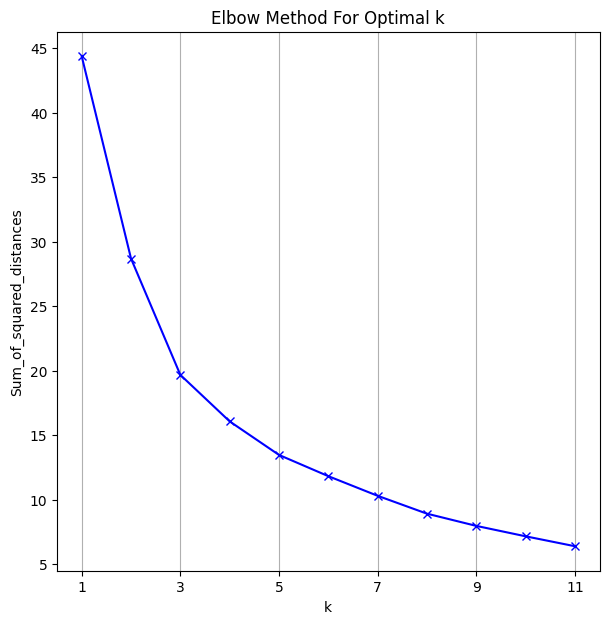

In [16]:
Sum_of_squared_distances = []
n = 12
K = range(1,n)
for k in K:
    km = KMeans(n_clusters=k,random_state=0,init='k-means++',n_init = 1000, max_iter = 5000)
    km = km.fit(data_norm)
    Sum_of_squared_distances.append(km.inertia_)

plt.figure(figsize=(7,7))
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xticks(np.arange(1,n,2))
plt.grid(axis='x')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.3746344890383318
For n_clusters = 3 The average silhouette_score is : 0.34266118839023846
For n_clusters = 4 The average silhouette_score is : 0.35328706325449727


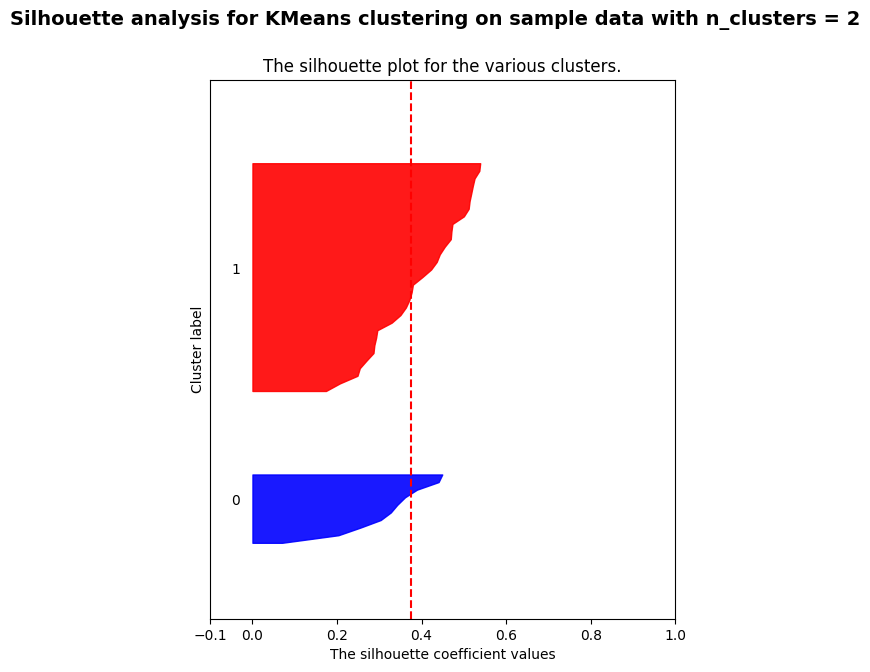

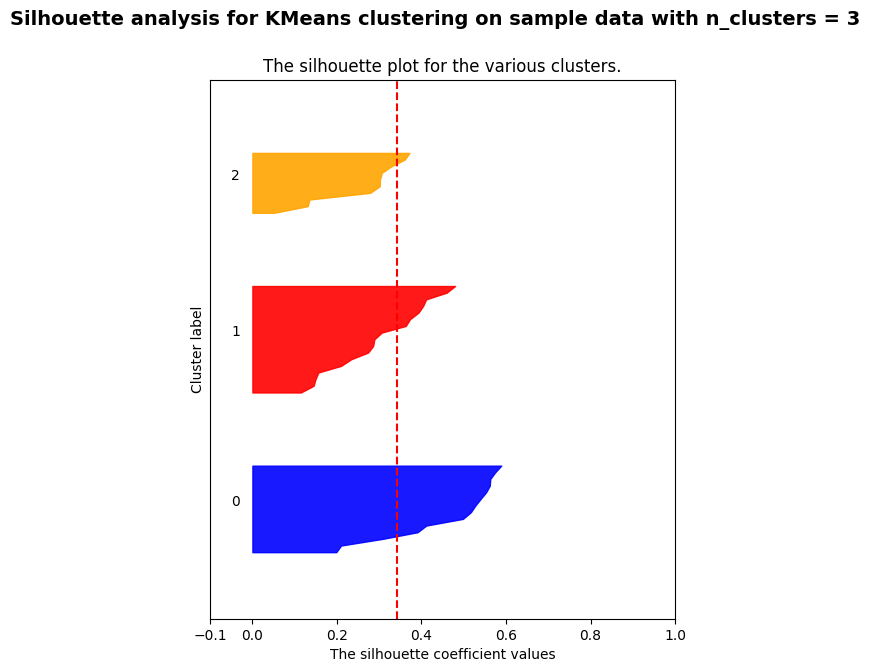

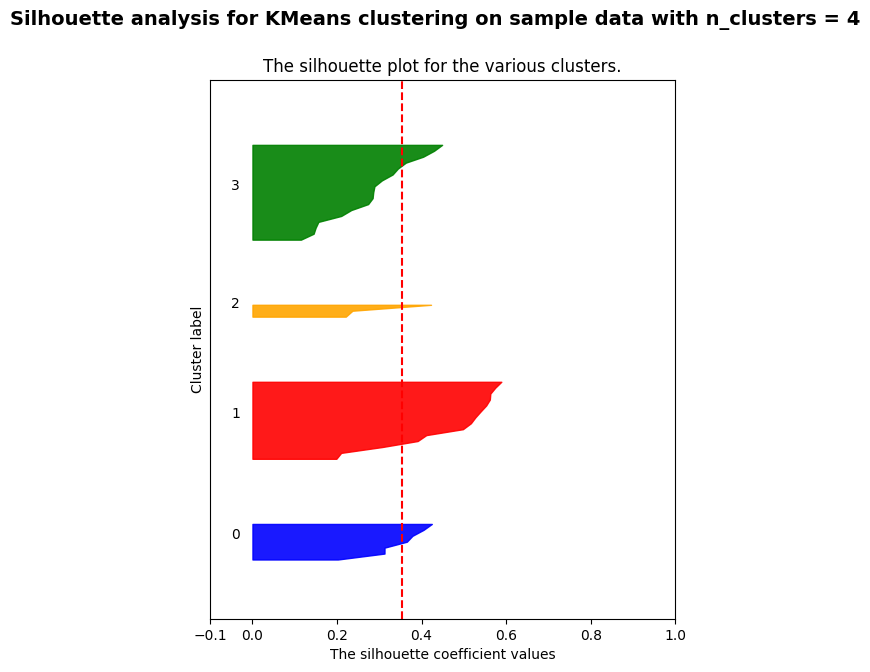

In [17]:
#https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html

k = 5
range_n_clusters = range(2, k)

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, ax1 = plt.subplots()
    fig.set_size_inches(6, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(data_norm) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmeans = KMeans(n_clusters=n_clusters, random_state=0,init='k-means++',n_init = 1000, max_iter = 5000)
    cluster_labels = kmeans.fit_predict(data_norm)
    df_dataset_properties['clusters_kmeans'+str(n_clusters)] = cluster_labels

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(data_norm, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(data_norm, cluster_labels)

    y_lower = 10

    my_colors = ['blue', 'red', 'orange', 'green']
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        #color = cm.nipy_spectral(float(i) / n_clusters)
        color = my_colors[i]

        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.9)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    #2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)



    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    plt.savefig(path_content+path_fig+'/silourtte_clusters_'+str(n_clusters))
plt.show()

You can see this in silhouette plot.

In [18]:
k_cluster_selected = 'clusters_kmeans4'

array([[<Axes: title={'center': 'NumberOfFeatures'}>,
        <Axes: title={'center': 'NumberOfInstances'}>,
        <Axes: title={'center': 'Dimensionality'}>,
        <Axes: title={'center': 'PercentageOfBinaryFeatures'}>],
       [<Axes: title={'center': 'StdvNominalAttDistinctValues'}>,
        <Axes: title={'center': 'MeanNominalAttDistinctValues'}>,
        <Axes: title={'center': 'ClassEntropy'}>,
        <Axes: title={'center': 'AutoCorrelation'}>],
       [<Axes: title={'center': 'NumberOfNumericFeatures'}>,
        <Axes: title={'center': 'NumberOfSymbolicFeatures'}>,
        <Axes: title={'center': 'NumberOfBinaryFeatures'}>,
        <Axes: title={'center': 'PercentageOfSymbolicFeatures'}>],
       [<Axes: title={'center': 'PercentageOfNumericFeatures'}>,
        <Axes: title={'center': 'MajorityClassPercentage'}>,
        <Axes: title={'center': 'MinorityClassPercentage'}>,
        <Axes: title={'center': 'clusters_kmeans2'}>],
       [<Axes: title={'center': 'clusters_kmea

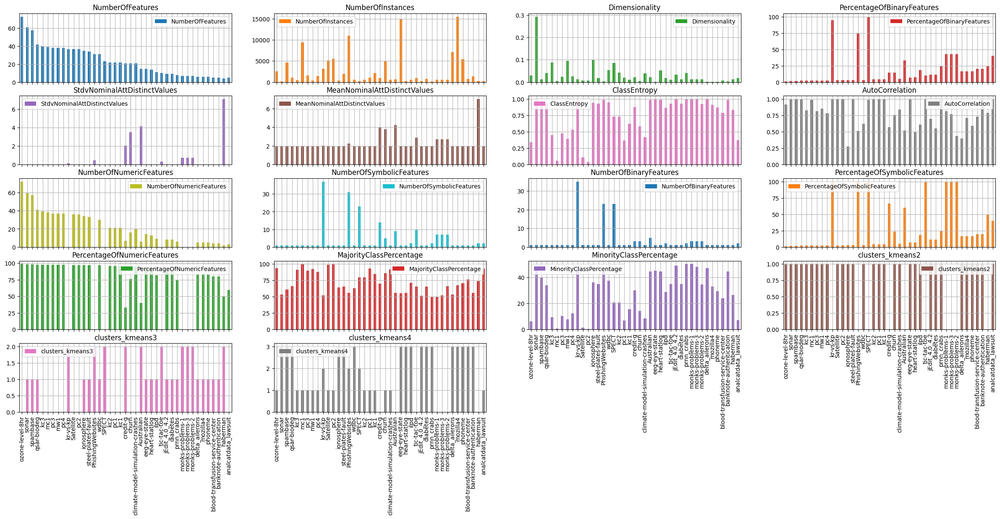

In [19]:
df_dataset_properties.plot(rot=90, subplots=True,layout=(8,4),figsize=(30,20),kind='bar',grid=True)

In [20]:
df_dataset_properties[k_cluster_selected].value_counts()

3    17
1    14
0     7
2     3
Name: clusters_kmeans4, dtype: int64

In [21]:
print('Datasets for cluster 0')
df_dataset_properties.query(k_cluster_selected+' == 0').index.to_list()

Datasets for cluster 0


['credit-g',
 'Australian',
 'tic-tac-toe',
 'monks-problems-1',
 'monks-problems-3',
 'monks-problems-2',
 'haberman']

In [22]:
print('Datasets for cluster 1')
df_dataset_properties.query(k_cluster_selected+' == 1').index.to_list()

Datasets for cluster 1


['ozone-level-8hr',
 'kc3',
 'mc1',
 'pc3',
 'mw1',
 'pc4',
 'Satellite',
 'pc2',
 'kc2',
 'pc1',
 'kc1',
 'churn',
 'climate-model-simulation-crashes',
 'analcatdata_lawsuit']

In [23]:
print('Datasets for cluster 2')
df_dataset_properties.query(k_cluster_selected+' == 2').index.to_list()

Datasets for cluster 2


['kr-vs-kp', 'PhishingWebsites', 'SPECT']

In [24]:
print('Datasets for cluster 3')
df_dataset_properties.query(k_cluster_selected+' == 3').index.to_list()

Datasets for cluster 3


['sonar',
 'spambase',
 'qsar-biodeg',
 'ionosphere',
 'steel-plates-fault',
 'wdbc',
 'eeg-eye-state',
 'heart-statlog',
 'ilpd',
 'jEdit_4.0_4.2',
 'diabetes',
 'prnn_crabs',
 'delta_ailerons',
 'mozilla4',
 'phoneme',
 'blood-transfusion-service-center',
 'banknote-authentication']

In [25]:
df_dataset_properties

,NumberOfFeatures,NumberOfInstances,Dimensionality,PercentageOfBinaryFeatures,StdvNominalAttDistinctValues,MeanNominalAttDistinctValues,ClassEntropy,AutoCorrelation,NumberOfNumericFeatures,NumberOfSymbolicFeatures,NumberOfBinaryFeatures,PercentageOfSymbolicFeatures,PercentageOfNumericFeatures,MajorityClassPercentage,MinorityClassPercentage,clusters_kmeans2,clusters_kmeans3,clusters_kmeans4
ozone-level-8hr,73.0,2534.0,0.028808,1.369863,0.000000,2.000000,0.339790,0.915515,72.0,1.0,1.0,1.369863,98.630137,93.685872,6.314128,1,0,1
sonar,61.0,208.0,0.293269,1.639344,0.000000,2.000000,0.996730,0.995169,60.0,1.0,1.0,1.639344,98.360656,53.365385,46.634615,1,1,3
spambase,58.0,4601.0,0.012606,1.724138,0.000000,2.000000,0.967360,0.999783,57.0,1.0,1.0,1.724138,98.275862,60.595523,39.404477,1,1,3
qsar-biodeg,42.0,1055.0,0.039810,2.380952,0.000000,2.000000,0.922349,0.997154,41.0,1.0,1.0,2.380952,97.619048,66.255924,33.744076,1,1,3
kc3,40.0,458.0,0.087336,2.500000,0.000000,2.000000,0.449311,0.829322,39.0,1.0,1.0,2.500000,97.500000,90.611354,9.388646,1,0,1
mc1,39.0,9466.0,0.004120,2.564103,0.000000,2.000000,0.061481,0.985631,38.0,1.0,1.0,2.564103,97.435897,99.281640,0.718360,1,0,1
pc3,38.0,1563.0,0.024312,2.631579,0.000000,2.000000,0.476455,0.814341,37.0,1.0,1.0,2.631579,97.368421,89.763276,10.236724,1,0,1
mw1,38.0,403.0,0.094293,2.631579,0.000000,2.000000,0.391244,0.855721,37.0,1.0,1.0,2.631579,97.368421,92.307692,7.692308,1,0,1
pc4,38.0,1458.0,0.026063,2.631579,0.000000,2.000000,0.535325,0.780371,37.0,1.0,1.0,2.631579,97.368421,87.791495,12.208505,1,0,1
kr-vs-kp,37.0,3196.0,0.011577,94.594595,0.164399,2.027027,0.998576,0.999061,0.0,37.0,35.0,100.000000,0.000000,52.221527,47.778473,0,2,2


In [26]:
df_dataset_properties
df_dataset_properties.round(2).to_csv('df_dataset_properties.csv')
files.download('df_dataset_properties.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## PCA - (Deprecated)

In [27]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)

k_tmp = df_dataset_properties['clusters_kmeans4']
df_dataset_properties_norm = PreprocessDefault.normalize(df_dataset_properties)

df_dataset_properties_norm['clusters_kmeans4'] = k_tmp

principalComponents = pca.fit_transform(df_dataset_properties_norm)

principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])

principalDf['index'] = df_dataset_properties_norm.index

principalDf = principalDf.set_index('index')


In [28]:
finalDf = pd.concat([principalDf, df_dataset_properties['clusters_kmeans4']],axis=1)

In [29]:
finalDf

,principal component 1,principal component 2,clusters_kmeans4
ozone-level-8hr,0.552242,-1.323856,1
sonar,-1.460899,-0.001562,3
spambase,-1.418595,-0.072390,3
qsar-biodeg,-1.373525,-0.077651,3
kc3,0.561462,-1.075420,1
mc1,0.609458,-1.315968,1
pc3,0.560645,-1.040074,1
mw1,0.574149,-1.108401,1
pc4,0.548512,-0.992007,1
kr-vs-kp,0.209388,1.774328,2


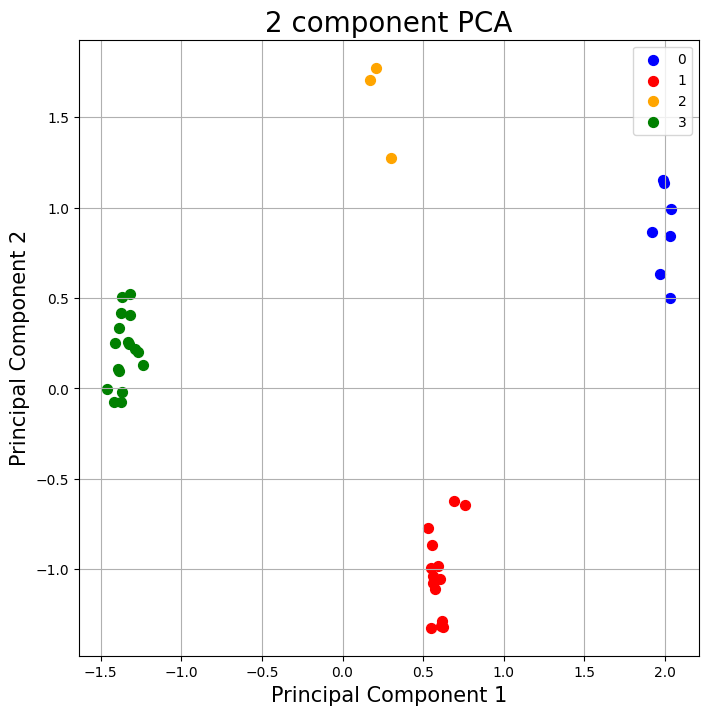

In [30]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)

targets = [0, 1, 2, 3]
colors = ['blue', 'red', 'orange', 'green']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['clusters_kmeans4'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

In [31]:
from numpy import corrcoef

In [32]:
df_final_complete = pd.concat([principalDf, df_dataset_properties],axis=1)
df_final_complete

df_final_complete = df_final_complete.drop(columns='clusters_kmeans2')
df_final_complete = df_final_complete.drop(columns='clusters_kmeans3')
df_final_complete

,principal component 1,principal component 2,NumberOfFeatures,NumberOfInstances,Dimensionality,PercentageOfBinaryFeatures,StdvNominalAttDistinctValues,MeanNominalAttDistinctValues,ClassEntropy,AutoCorrelation,NumberOfNumericFeatures,NumberOfSymbolicFeatures,NumberOfBinaryFeatures,PercentageOfSymbolicFeatures,PercentageOfNumericFeatures,MajorityClassPercentage,MinorityClassPercentage,clusters_kmeans4
ozone-level-8hr,0.552242,-1.323856,73.0,2534.0,0.028808,1.369863,0.000000,2.000000,0.339790,0.915515,72.0,1.0,1.0,1.369863,98.630137,93.685872,6.314128,1
sonar,-1.460899,-0.001562,61.0,208.0,0.293269,1.639344,0.000000,2.000000,0.996730,0.995169,60.0,1.0,1.0,1.639344,98.360656,53.365385,46.634615,3
spambase,-1.418595,-0.072390,58.0,4601.0,0.012606,1.724138,0.000000,2.000000,0.967360,0.999783,57.0,1.0,1.0,1.724138,98.275862,60.595523,39.404477,3
qsar-biodeg,-1.373525,-0.077651,42.0,1055.0,0.039810,2.380952,0.000000,2.000000,0.922349,0.997154,41.0,1.0,1.0,2.380952,97.619048,66.255924,33.744076,3
kc3,0.561462,-1.075420,40.0,458.0,0.087336,2.500000,0.000000,2.000000,0.449311,0.829322,39.0,1.0,1.0,2.500000,97.500000,90.611354,9.388646,1
mc1,0.609458,-1.315968,39.0,9466.0,0.004120,2.564103,0.000000,2.000000,0.061481,0.985631,38.0,1.0,1.0,2.564103,97.435897,99.281640,0.718360,1
pc3,0.560645,-1.040074,38.0,1563.0,0.024312,2.631579,0.000000,2.000000,0.476455,0.814341,37.0,1.0,1.0,2.631579,97.368421,89.763276,10.236724,1
mw1,0.574149,-1.108401,38.0,403.0,0.094293,2.631579,0.000000,2.000000,0.391244,0.855721,37.0,1.0,1.0,2.631579,97.368421,92.307692,7.692308,1
pc4,0.548512,-0.992007,38.0,1458.0,0.026063,2.631579,0.000000,2.000000,0.535325,0.780371,37.0,1.0,1.0,2.631579,97.368421,87.791495,12.208505,1
kr-vs-kp,0.209388,1.774328,37.0,3196.0,0.011577,94.594595,0.164399,2.027027,0.998576,0.999061,0.0,37.0,35.0,100.000000,0.000000,52.221527,47.778473,2


In [33]:
df_0 =  df_final_complete[df_final_complete['clusters_kmeans4'] == 0]
df_0_matrix = df_0.corr()
df_0_matrix['principal component 1'].sort_values(ascending=False)

principal component 1           1.000000
MajorityClassPercentage         0.458898
AutoCorrelation                 0.392012
PercentageOfSymbolicFeatures    0.379096
MeanNominalAttDistinctValues    0.021547
principal component 2          -0.084316
PercentageOfBinaryFeatures     -0.099060
StdvNominalAttDistinctValues   -0.134950
NumberOfInstances              -0.228675
PercentageOfNumericFeatures    -0.379096
NumberOfSymbolicFeatures       -0.435739
MinorityClassPercentage        -0.458898
ClassEntropy                   -0.458998
NumberOfFeatures               -0.651257
NumberOfNumericFeatures        -0.731333
NumberOfBinaryFeatures         -0.842144
Dimensionality                 -0.868335
clusters_kmeans4                     NaN
Name: principal component 1, dtype: float64

In [34]:
df_0_matrix['principal component 2'].sort_values(ascending=False)

principal component 2           1.000000
ClassEntropy                    0.897385
MinorityClassPercentage         0.874052
PercentageOfSymbolicFeatures    0.821272
PercentageOfBinaryFeatures      0.716090
NumberOfBinaryFeatures          0.395268
AutoCorrelation                 0.034341
NumberOfSymbolicFeatures        0.015037
NumberOfInstances              -0.062207
principal component 1          -0.084316
NumberOfFeatures               -0.277475
Dimensionality                 -0.340350
NumberOfNumericFeatures        -0.549646
StdvNominalAttDistinctValues   -0.735928
PercentageOfNumericFeatures    -0.821272
MeanNominalAttDistinctValues   -0.840865
MajorityClassPercentage        -0.874052
clusters_kmeans4                     NaN
Name: principal component 2, dtype: float64

In [35]:
df_1 =  df_final_complete[df_final_complete['clusters_kmeans4'] == 1]
df_1_matrix = df_1.corr()
df_1_matrix['principal component 1'].sort_values(ascending=False)

principal component 1           1.000000
PercentageOfSymbolicFeatures    0.881554
PercentageOfBinaryFeatures      0.845307
NumberOfBinaryFeatures          0.742709
NumberOfSymbolicFeatures        0.612714
MeanNominalAttDistinctValues    0.435651
StdvNominalAttDistinctValues    0.435651
principal component 2           0.393016
MajorityClassPercentage         0.300526
NumberOfInstances               0.201595
AutoCorrelation                 0.128190
ClassEntropy                   -0.274452
MinorityClassPercentage        -0.300526
Dimensionality                 -0.381771
NumberOfFeatures               -0.539170
NumberOfNumericFeatures        -0.567293
PercentageOfNumericFeatures    -0.881554
clusters_kmeans4                     NaN
Name: principal component 1, dtype: float64

In [36]:
df_1_matrix['principal component 2'].sort_values(ascending=False)

principal component 2           1.000000
ClassEntropy                    0.758739
MinorityClassPercentage         0.745207
PercentageOfSymbolicFeatures    0.712764
NumberOfBinaryFeatures          0.669582
PercentageOfBinaryFeatures      0.647802
NumberOfSymbolicFeatures        0.602340
MeanNominalAttDistinctValues    0.493858
StdvNominalAttDistinctValues    0.493858
principal component 1           0.393016
Dimensionality                 -0.018949
AutoCorrelation                -0.219921
NumberOfInstances              -0.450196
PercentageOfNumericFeatures    -0.712764
MajorityClassPercentage        -0.745207
NumberOfFeatures               -0.755192
NumberOfNumericFeatures        -0.777422
clusters_kmeans4                     NaN
Name: principal component 2, dtype: float64

In [37]:
df_2 =  df_final_complete[df_final_complete['clusters_kmeans4'] == 2]
df_2_matrix = df_2.corr()
df_2_matrix['principal component 1'].sort_values(ascending=False)

principal component 1           1.000000
Dimensionality                  0.981636
MajorityClassPercentage         0.918893
PercentageOfBinaryFeatures      0.847566
AutoCorrelation                 0.712331
NumberOfBinaryFeatures         -0.233549
NumberOfFeatures               -0.745722
NumberOfSymbolicFeatures       -0.745722
MeanNominalAttDistinctValues   -0.787592
NumberOfInstances              -0.880590
principal component 2          -0.917437
MinorityClassPercentage        -0.918893
StdvNominalAttDistinctValues   -0.926732
ClassEntropy                   -0.951023
NumberOfNumericFeatures              NaN
PercentageOfSymbolicFeatures         NaN
PercentageOfNumericFeatures          NaN
clusters_kmeans4                     NaN
Name: principal component 1, dtype: float64

In [38]:
df_2_matrix['principal component 2'].sort_values(ascending=False)

principal component 2           1.000000
MinorityClassPercentage         0.999993
ClassEntropy                    0.995497
NumberOfFeatures                0.949244
NumberOfSymbolicFeatures        0.949244
StdvNominalAttDistinctValues    0.700726
NumberOfInstances               0.619339
NumberOfBinaryFeatures          0.601144
MeanNominalAttDistinctValues    0.477393
AutoCorrelation                -0.374270
PercentageOfBinaryFeatures     -0.566438
principal component 1          -0.917437
Dimensionality                 -0.976490
MajorityClassPercentage        -0.999993
NumberOfNumericFeatures              NaN
PercentageOfSymbolicFeatures         NaN
PercentageOfNumericFeatures          NaN
clusters_kmeans4                     NaN
Name: principal component 2, dtype: float64

In [39]:
df_3 =  df_final_complete[df_final_complete['clusters_kmeans4'] == 3]
df_3_matrix = df_3.corr()
df_3_matrix['principal component 1'].sort_values(ascending=False)

principal component 1           1.000000
PercentageOfBinaryFeatures      0.800689
PercentageOfSymbolicFeatures    0.800689
MajorityClassPercentage         0.591926
NumberOfSymbolicFeatures        0.401112
NumberOfBinaryFeatures          0.401112
principal component 2           0.303832
NumberOfInstances              -0.098644
AutoCorrelation                -0.173697
Dimensionality                 -0.559753
MinorityClassPercentage        -0.591926
NumberOfFeatures               -0.717907
NumberOfNumericFeatures        -0.721975
ClassEntropy                   -0.724860
PercentageOfNumericFeatures    -0.800689
StdvNominalAttDistinctValues         NaN
MeanNominalAttDistinctValues         NaN
clusters_kmeans4                     NaN
Name: principal component 1, dtype: float64

In [40]:
df_3_matrix['principal component 2'].sort_values(ascending=False)

principal component 2           1.000000
PercentageOfBinaryFeatures      0.729093
PercentageOfSymbolicFeatures    0.729093
MinorityClassPercentage         0.502766
ClassEntropy                    0.354050
principal component 1           0.303832
NumberOfSymbolicFeatures        0.303314
NumberOfBinaryFeatures          0.303314
NumberOfInstances               0.123551
AutoCorrelation                -0.277884
Dimensionality                 -0.323599
MajorityClassPercentage        -0.502766
PercentageOfNumericFeatures    -0.729093
NumberOfFeatures               -0.795338
NumberOfNumericFeatures        -0.797374
StdvNominalAttDistinctValues         NaN
MeanNominalAttDistinctValues         NaN
clusters_kmeans4                     NaN
Name: principal component 2, dtype: float64

## MCA

In [41]:
from collections import OrderedDict

import numpy as np
from scipy import linalg


GRAY = OrderedDict([
    ('light', '#bababa'),
    ('dark', '#404040')
])


def stylize_axis(ax, grid=True):

    if grid:
        ax.grid()

    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')

    ax.axhline(y=0, linestyle='-', linewidth=1.2, color=GRAY['dark'], alpha=0.6)
    ax.axvline(x=0, linestyle='-', linewidth=1.2, color=GRAY['dark'], alpha=0.6)

    return ax


def build_ellipse(X, Y):
    """Construct ellipse coordinates from two arrays of numbers.
    Args:
        X (1D array_like)
        Y (1D array_like)
    Returns:
        float: The mean of `X`.
        float: The mean of `Y`.
        float: The width of the ellipse.
        float: The height of the ellipse.
        float: The angle of orientation of the ellipse.
    """
    x_mean = np.mean(X)
    y_mean = np.mean(Y)

    cov_matrix = np.cov(np.vstack((X, Y)))
    U, s, V = linalg.svd(cov_matrix, full_matrices=False)

    chi_95 = np.sqrt(4.61)  # 90% quantile of the chi-square distribution
    width = np.sqrt(cov_matrix[0][0]) * chi_95 * 2
    height = np.sqrt(cov_matrix[1][1]) * chi_95 * 2

    eigenvector = V.T[0]
    angle = np.arctan(eigenvector[1] / eigenvector[0])

    return x_mean, y_mean, width, height, angle

In [42]:
import pandas as pd


def make_labels_and_names(X):

    if isinstance(X, pd.DataFrame):
        row_label = X.index.name if X.index.name else 'Rows'
        row_names = X.index.tolist()
        col_label = X.columns.name if X.columns.name else 'Columns'
        col_names = X.columns.tolist()
    else:
        row_label = 'Rows'
        row_names = list(range(X.shape[0]))
        col_label = 'Columns'
        col_names = list(range(X.shape[1]))

    return row_label, row_names, col_label, col_names

In [43]:
"""Singular Value Decomposition (SVD)"""
try:
    import fbpca
    FBPCA_INSTALLED = True
except ImportError:
    FBPCA_INSTALLED = False
from sklearn.utils import extmath


def compute_svd(X, n_components, n_iter, random_state, engine):
    """Computes an SVD with k components."""

    # Determine what SVD engine to use
    if engine == 'auto':
        engine = 'sklearn'

    # Compute the SVD
    if engine == 'fbpca':
        if FBPCA_INSTALLED:
            U, s, V = fbpca.pca(X, k=n_components, n_iter=n_iter)
        else:
            raise ValueError('fbpca is not installed; please install it if you want to use it')
    elif engine == 'sklearn':
        U, s, V = extmath.randomized_svd(
            X,
            n_components=n_components,
            n_iter=n_iter,
            random_state=random_state
        )
    else:
        raise ValueError("engine has to be one of ('auto', 'fbpca', 'sklearn')")

    U, V = extmath.svd_flip(U, V)

    return U, s, V

In [44]:
"""Correspondence Analysis (CA)"""
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import sparse
from sklearn import base
from sklearn import utils

# from . import plot
# from . import util
# from . import svd


class CA(base.BaseEstimator, base.TransformerMixin):

    def __init__(self, n_components=2, n_iter=10, copy=True, check_input=True, benzecri=False,
                 random_state=None, engine='auto'):
        self.n_components = n_components
        self.n_iter = n_iter
        self.copy = copy
        self.check_input = check_input
        self.random_state = random_state
        self.benzecri = benzecri
        self.engine = engine

    def fit(self, X, y=None):

        # Check input
        if self.check_input:
            utils.check_array(X)

        # Check all values are positive
        if (X < 0).any().any():
            raise ValueError("All values in X should be positive")

        _, row_names, _, col_names = make_labels_and_names(X)

        if isinstance(X, pd.DataFrame):
            X = X.to_numpy()

        if self.copy:
            X = np.copy(X)

        # Compute the correspondence matrix which contains the relative frequencies
        X = X.astype(float) / np.sum(X)

        # Compute row and column masses
        self.row_masses_ = pd.Series(X.sum(axis=1), index=row_names)
        self.col_masses_ = pd.Series(X.sum(axis=0), index=col_names)

        # Compute standardised residuals
        r = self.row_masses_.to_numpy()
        c = self.col_masses_.to_numpy()
        S = sparse.diags(r ** -.5) @ (X - np.outer(r, c)) @ sparse.diags(c ** -.5)

        # Compute SVD on the standardised residuals
        self.U_, self.s_, self.V_ = compute_svd(
            X=S,
            n_components=self.n_components,
            n_iter=self.n_iter,
            random_state=self.random_state,
            engine=self.engine
        )

        # Compute total inertia
        self.total_inertia_ = np.einsum('ij,ji->', S, S.T)

        return self

    def _check_is_fitted(self):
        utils.validation.check_is_fitted(self, 'total_inertia_')

    def transform(self, X):
        """Computes the row principal coordinates of a dataset.
        Same as calling `row_coordinates`. In most cases you should be using the same
        dataset as you did when calling the `fit` method. You might however also want to included
        supplementary data.
        """
        self._check_is_fitted()
        if self.check_input:
            utils.check_array(X)
        return self.row_coordinates(X)

    @property
    def eigenvalues_(self):
        """The eigenvalues associated with each principal component.
        Benzecri correction is applied if specified.
        """
        self._check_is_fitted()

        K = len(self.col_masses_)

        if self.benzecri:
            return np.array([
                (K / (K - 1.) * (s - 1. / K)) ** 2
                if s > 1. / K else 0
                for s in np.square(self.s_)
            ])

        return np.square(self.s_).tolist()

    @property
    def explained_inertia_(self):
        """The percentage of explained inertia per principal component."""
        self._check_is_fitted()
        return [eig / self.total_inertia_ for eig in self.eigenvalues_]

    def row_coordinates(self, X):
        """The row principal coordinates."""
        self._check_is_fitted()

        _, row_names, _, _ = make_labels_and_names(X)

        if isinstance(X, pd.DataFrame):
            try:
                X = X.sparse.to_coo().astype(float)
            except AttributeError:
                X = X.to_numpy()

        if self.copy:
            X = X.copy()

        # Normalise the rows so that they sum up to 1
        if isinstance(X, np.ndarray):
            X = X / X.sum(axis=1)[:, None]
        else:
            X = X / X.sum(axis=1)

        return pd.DataFrame(
            data=X @ sparse.diags(self.col_masses_.to_numpy() ** -0.5) @ self.V_.T,
            index=row_names
        )

    def column_coordinates(self, X):
        """The column principal coordinates."""
        self._check_is_fitted()

        _, _, _, col_names = make_labels_and_names(X)

        if isinstance(X, pd.DataFrame):
            is_sparse = X.dtypes.apply(pd.api.types.is_sparse).all()
            if is_sparse:
                X = X.sparse.to_coo()
            else:
                X = X.to_numpy()

        if self.copy:
            X = X.copy()

        # Transpose and make sure the rows sum up to 1
        if isinstance(X, np.ndarray):
            X = X.T / X.T.sum(axis=1)[:, None]
        else:
            X = X.T / X.T.sum(axis=1)

        return pd.DataFrame(
            data=X @ sparse.diags(self.row_masses_.to_numpy() ** -0.5) @ self.U_,
            index=col_names
        )

    def plot_coordinates(self, X, ax=None, figsize=(6, 6), x_component=0, y_component=1,
                                   show_row_labels=True, show_col_labels=True, **kwargs):
        """Plot the principal coordinates."""

        self._check_is_fitted()

        if ax is None:
            fig, ax = plt.subplots(figsize=figsize)

        # Add style
        ax = stylize_axis(ax)

        # Get labels and names
        row_label, row_names, col_label, col_names = make_labels_and_names(X)

        # Plot row principal coordinates
        row_coords = self.row_coordinates(X)
        ax.scatter(
            row_coords[x_component],
            row_coords[y_component],
            **kwargs,
            label=row_label
        )

        # Plot column principal coordinates
        col_coords = self.column_coordinates(X)
        ax.scatter(
            col_coords[x_component],
            col_coords[y_component],
            **kwargs,
            label=col_label
        )

        # Add row labels
        if show_row_labels:
            x = row_coords[x_component]
            y = row_coords[y_component]
            for xi, yi, label in zip(x, y, row_names):
                ax.annotate(label, (xi, yi))

        # Add column labels
        if show_col_labels:
            x = col_coords[x_component]
            y = col_coords[y_component]
            for xi, yi, label in zip(x, y, col_names):
                ax.annotate(label, (xi, yi))

        # Legend
        ax.legend()

        # Text
        ax.set_title('Principal coordinates')
        ei = self.explained_inertia_
        ax.set_xlabel('Component {} ({:.2f}% inertia)'.format(x_component, 100 * ei[x_component]))
        ax.set_ylabel('Component {} ({:.2f}% inertia)'.format(y_component, 100 * ei[y_component]))

        return ax

In [45]:
"""Multiple Correspondence Analysis (MCA)"""
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn import utils
from adjustText import adjust_text

# from . import ca
# from . import plot


class MCA(CA):

    def fit(self, X, y=None):

        if self.check_input:
            utils.check_array(X, dtype=[str, np.number])

        if not isinstance(X, pd.DataFrame):
            X = pd.DataFrame(X)

        n_initial_columns = X.shape[1]

        # One-hot encode the data
        one_hot = pd.get_dummies(X)

        # Apply CA to the indicator matrix
        super().fit(one_hot)

        # Compute the total inertia
        n_new_columns = one_hot.shape[1]
        self.total_inertia_ = (n_new_columns - n_initial_columns) / n_initial_columns

        return self

    def row_coordinates(self, X):
        if not isinstance(X, pd.DataFrame):
            X = pd.DataFrame(X)
        return super().row_coordinates(pd.get_dummies(X))

    def column_coordinates(self, X):
        if not isinstance(X, pd.DataFrame):
            X = pd.DataFrame(X)
        return super().column_coordinates(pd.get_dummies(X))

    def transform(self, X):
        """Computes the row principal coordinates of a dataset."""
        self._check_is_fitted()
        if self.check_input:
            utils.check_array(X, dtype=[str, np.number])
        return self.row_coordinates(X)

    def plot_coordinates(self, X, ax=None, figsize=(6, 6), x_component=0, y_component=1,
                         show_row_points=True, row_points_size=10,
                         row_points_alpha=1, show_row_labels=False,
                         show_column_points=True, column_points_size=30, show_column_labels=False,
                         legend_n_cols=1,
                         xlim=(-2,2),
                         ylim=(-2,2),c=[],colors = ['#5496fa',
                                                    '#aec7e8',
                                                    '#ff7f0e',
                                                    '#ffbb78',
                                                    '#539c8e',
                                                    '#98df8a',
                                                    '#FF6347',
                                                    '#ff9896',
                                                    '#9467bd',
                                                    '#c5b0d5',
                                                    '#8c564b',
                                                    '#c49c94',
                                                    '#e377c2',
                                                    '#f7b6d2',
                                                    '#7f7f7f',
                                                    '#c7c7c7',
                                                    '#bcbd22',
                                                    '#dbdb8d',
                                                    '#17becf',
                                                    '#9edae5']):
        """Plot row and column principal coordinates.
        Parameters:
            ax (matplotlib.Axis): A fresh one will be created and returned if not provided.
            figsize ((float, float)): The desired figure size if `ax` is not provided.
            x_component (int): Number of the component used for the x-axis.
            y_component (int): Number of the component used for the y-axis.
            show_row_points (bool): Whether to show row principal components or not.
            row_points_size (float): Row principal components point size.
            row_points_alpha (float): Alpha for the row principal component.
            show_row_labels (bool): Whether to show row labels or not.
            show_column_points (bool): Whether to show column principal components or not.
            column_points_size (float): Column principal components point size.
            show_column_labels (bool): Whether to show column labels or not.
            legend_n_cols (int): Number of columns used for the legend.
        Returns:
            matplotlib.Axis
        """

        color_cluster = ['blue', 'red', 'orange', 'green']

        def jitter_dots(dots):
          offsets = dots.get_offsets()
          jittered_offsets = offsets
          # only jitter in the x-direction
          jittered_offsets[:, 0] += np.random.uniform(-0.1, 0.1, offsets.shape[0])
          # only jitter in the y-direction
          jittered_offsets[:, 1] += np.random.uniform(-0.1, 0.1, offsets.shape[0])


        self._check_is_fitted()

        if ax is None:
            fig, ax = plt.subplots(figsize=figsize)

        # Add style
        ax = stylize_axis(ax)

        # Plot row principal coordinates
        if show_row_points or show_row_labels:

            row_coords = self.row_coordinates(X)

            if show_row_points:
                id_c0 = df_dataset_properties[df_dataset_properties.loc[:][k_cluster_selected] == 0].index
                id_c1 = df_dataset_properties[df_dataset_properties.loc[:][k_cluster_selected] == 1].index
                id_c2 = df_dataset_properties[df_dataset_properties.loc[:][k_cluster_selected] == 2].index
                id_c3 = df_dataset_properties[df_dataset_properties.loc[:][k_cluster_selected] == 3].index
                if c[0]==True:
                  dots = ax.scatter(
                      row_coords.loc[id_c0, x_component],
                      row_coords.loc[id_c0, y_component],
                      s=row_points_size,
                      color=color_cluster[0],
                      alpha=row_points_alpha,
                      marker=r'^',
                      label='Dataset from cluster 0'
                  )
                  if show_row_labels == False:
                    jitter_dots(dots)

                if c[1]==True:
                  dots = ax.scatter(
                      row_coords.loc[id_c1, x_component],
                      row_coords.loc[id_c1, y_component],
                      s=row_points_size,
                      color=color_cluster[1],
                      alpha=row_points_alpha,
                      marker=r'^',
                      label='Dataset from cluster 1'
                  )
                  if show_row_labels == False:
                    jitter_dots(dots)

                if c[2]==True:
                  dots = ax.scatter(
                      row_coords.loc[id_c2, x_component],
                      row_coords.loc[id_c2, y_component],
                      s=row_points_size,
                      color=color_cluster[2],
                      alpha=row_points_alpha,
                      marker=r'^',
                      label='Dataset from cluster 2'
                  )
                  if show_row_labels == False:
                    jitter_dots(dots)

                if c[3]==True:
                  dots = ax.scatter(
                      row_coords.loc[id_c3, x_component],
                      row_coords.loc[id_c3, y_component],
                      s=row_points_size,
                      color=color_cluster[3],
                      alpha=row_points_alpha,
                      marker=r'^',
                      label='Dataset from cluster 3'
                  )
                  if show_row_labels == False:
                    jitter_dots(dots)
            texts = []

            if show_row_labels:
                for _, row in row_coords.iterrows():
                    if (df_dataset_properties.loc[row.name][k_cluster_selected] == 0) and c[0]==True:
                      texts.append(ax.text(row[x_component], row[y_component], s=row.name, **dict(color=color_cluster[0], alpha=0.6,fontsize='11')))
                    else:
                      if (df_dataset_properties.loc[row.name][k_cluster_selected] == 1) and c[1]==True:
                        texts.append(ax.text(row[x_component], row[y_component], s=row.name, **dict(color=color_cluster[1], alpha=0.6,fontsize='11')))
                      else:
                        if (df_dataset_properties.loc[row.name][k_cluster_selected] == 2) and c[2]==True:
                          texts.append(ax.text(row[x_component], row[y_component], s=row.name, **dict(color=color_cluster[2],fontsize='11')))
                        else:
                          if (df_dataset_properties.loc[row.name][k_cluster_selected] == 3) and c[3]==True:
                            texts.append(ax.text(row[x_component], row[y_component], s=row.name, **dict(color=color_cluster[3],fontsize='11')))
            #adjust_text(texts)


        # Plot column principal coordinates
        if show_column_points or show_column_labels:

            col_coords = self.column_coordinates(X)
            x = col_coords[x_component]
            y = col_coords[y_component]

            prefixes = col_coords.index.str.split('_').map(lambda x: x[0])



            index = 0
            for prefix in prefixes.unique():
                mask = prefixes == prefix

                if show_column_points:
                    ax.scatter(x[mask], y[mask], s=column_points_size, label=prefix,color=colors[index])

                if show_column_labels:
                    for i, label in enumerate(col_coords[mask].index):
                       texts.append(ax.text(x[mask][i], y[mask][i],s=label,**dict(fontsize='12')))
                index += 1


            adjust_text(texts,arrowprops=dict(arrowstyle='->', color='silver'),expand_text=(1,1.4))
            ax.legend(ncol=legend_n_cols,loc='upper left',fontsize='12')


        # Text
        #ax.set_title('Row and column principal coordinates')
        ei = self.explained_inertia_
        ax.set_xlabel('Component {} ({:.2f}%)'.format(x_component, 100 * ei[x_component]))
        ax.set_ylabel('Component {} ({:.2f}%)'.format(y_component, 100 * ei[y_component]))
        plt.xlim(xlim)
        plt.ylim(ylim)
        return ax

In [46]:
df_dataset_properties_copy = df_dataset_properties.copy()
#df_dataset_properties_copy = df_dataset_properties_copy.drop(columns=k_cluster_selected)

df_dataset_properties_copy.to_csv('df_properties.csv')
#files.download('df_properties.csv')

In [47]:
df_dataset_properties_copy = df_dataset_properties_copy.drop(columns='clusters_kmeans2')
df_dataset_properties_copy = df_dataset_properties_copy.drop(columns='clusters_kmeans3')
df_dataset_properties_copy = df_dataset_properties_copy.drop(columns='clusters_kmeans4')

df_dataset_properties = df_dataset_properties.drop(columns='clusters_kmeans2')
df_dataset_properties = df_dataset_properties.drop(columns='clusters_kmeans3')

In [48]:
for i,c in enumerate(df_dataset_properties_copy.columns):
  if c != k_cluster_selected:
    #try:
    #  df_dataset_properties_copy[c] = pd.qcut(df_dataset_properties_copy[c], q=2,duplicates='drop',labels=['s','h'])
    #except:
    df_dataset_properties_copy[c] = pd.cut(df_dataset_properties_copy[c], bins=2,duplicates='drop',labels=['s','h'])

In [49]:
k4 = df_dataset_properties['clusters_kmeans4']
df_dataset_properties = df_dataset_properties.drop(columns='clusters_kmeans4')
df_dataset_properties = PreprocessDefault.normalize(df_dataset_properties)
df_dataset_properties['clusters_kmeans4'] = k4

In [50]:
df_dataset_properties.round(2)

,NumberOfFeatures,NumberOfInstances,Dimensionality,PercentageOfBinaryFeatures,StdvNominalAttDistinctValues,MeanNominalAttDistinctValues,ClassEntropy,AutoCorrelation,NumberOfNumericFeatures,NumberOfSymbolicFeatures,NumberOfBinaryFeatures,PercentageOfSymbolicFeatures,PercentageOfNumericFeatures,MajorityClassPercentage,MinorityClassPercentage,clusters_kmeans4
ozone-level-8hr,1.00,0.15,0.10,0.00,0.00,0.00,0.31,0.88,1.00,0.00,0.00,0.00,1.00,0.88,0.12,1
sonar,0.83,0.00,1.00,0.00,0.00,0.00,1.00,0.99,0.83,0.00,0.00,0.00,1.00,0.07,0.93,3
spambase,0.78,0.29,0.04,0.00,0.00,0.00,0.97,1.00,0.79,0.00,0.00,0.00,1.00,0.21,0.79,3
qsar-biodeg,0.55,0.06,0.13,0.01,0.00,0.00,0.92,1.00,0.57,0.00,0.00,0.01,0.99,0.33,0.67,3
kc3,0.52,0.02,0.30,0.01,0.00,0.00,0.43,0.76,0.54,0.00,0.00,0.01,0.99,0.82,0.18,1
mc1,0.51,0.60,0.01,0.01,0.00,0.00,0.02,0.98,0.53,0.00,0.00,0.01,0.99,0.99,0.01,1
pc3,0.49,0.09,0.08,0.01,0.00,0.00,0.46,0.74,0.51,0.00,0.00,0.01,0.99,0.80,0.20,1
mw1,0.49,0.01,0.32,0.01,0.00,0.00,0.37,0.80,0.51,0.00,0.00,0.01,0.99,0.85,0.15,1
pc4,0.49,0.08,0.09,0.01,0.00,0.00,0.52,0.70,0.51,0.00,0.00,0.01,0.99,0.76,0.24,1
kr-vs-kp,0.48,0.20,0.04,0.95,0.02,0.01,1.00,1.00,0.00,1.00,1.00,1.00,0.00,0.04,0.96,2


In [51]:
df_dataset_properties
df_dataset_properties.round(2).to_csv('df_dataset_properties_norm.csv')
files.download('df_dataset_properties_norm.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [52]:
df_dataset_properties_copy

,NumberOfFeatures,NumberOfInstances,Dimensionality,PercentageOfBinaryFeatures,StdvNominalAttDistinctValues,MeanNominalAttDistinctValues,ClassEntropy,AutoCorrelation,NumberOfNumericFeatures,NumberOfSymbolicFeatures,NumberOfBinaryFeatures,PercentageOfSymbolicFeatures,PercentageOfNumericFeatures,MajorityClassPercentage,MinorityClassPercentage
ozone-level-8hr,h,s,s,s,s,s,s,h,h,s,s,s,h,h,s
sonar,h,s,h,s,s,s,h,h,h,s,s,s,h,s,h
spambase,h,s,s,s,s,s,h,h,h,s,s,s,h,s,h
qsar-biodeg,h,s,s,s,s,s,h,h,h,s,s,s,h,s,h
kc3,h,s,s,s,s,s,s,h,h,s,s,s,h,h,s
mc1,h,h,s,s,s,s,s,h,h,s,s,s,h,h,s
pc3,s,s,s,s,s,s,s,h,h,s,s,s,h,h,s
mw1,s,s,s,s,s,s,s,h,h,s,s,s,h,h,s
pc4,s,s,s,s,s,s,h,h,h,s,s,s,h,h,s
kr-vs-kp,s,s,s,h,s,s,h,h,s,h,h,h,s,s,h


In [53]:
df_dataset_properties_copy
df_dataset_properties_copy.to_csv('df_dataset_properties_binarized.csv')
files.download('df_dataset_properties_binarized.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [54]:
mca = MCA()
mca = mca.fit(df_dataset_properties_copy)

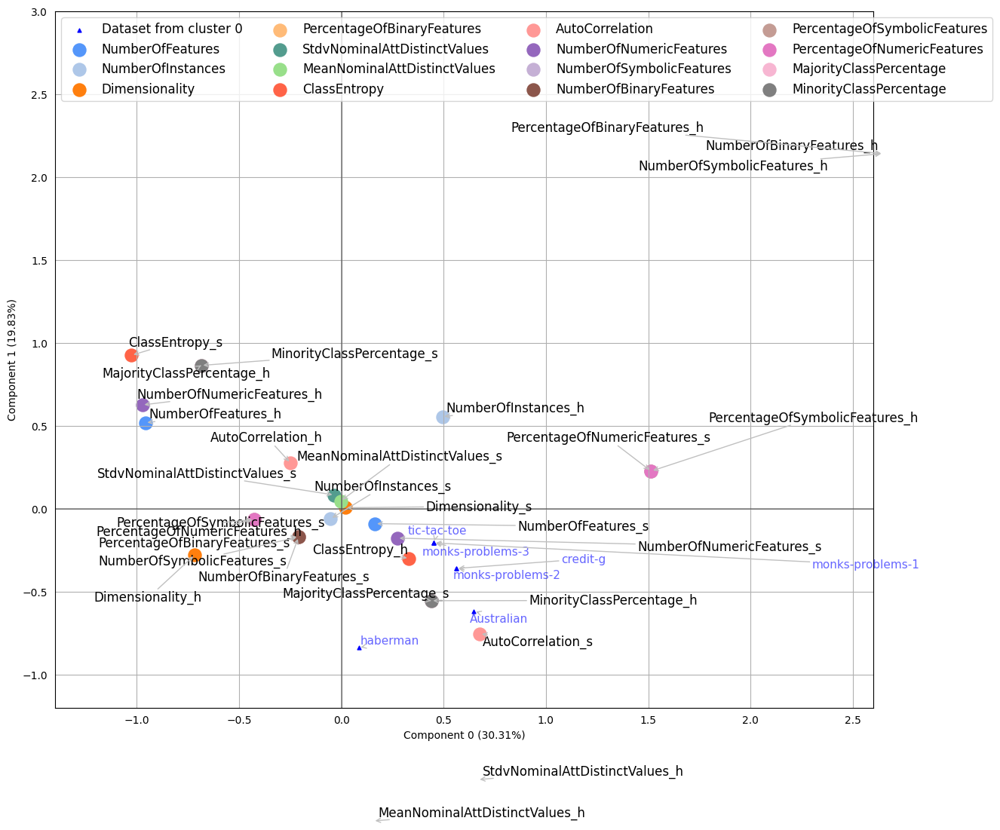

In [55]:
ax = mca.plot_coordinates(
     X=df_dataset_properties_copy,
     ax=None,
     figsize=(14,12),
     show_row_points=True,
     row_points_size=12,
     show_row_labels=True,
     show_column_points=True,
     column_points_size=150,
     show_column_labels=True,
     legend_n_cols=4,
     xlim=(-1.4,2.6),
     ylim=(-1.2,3),
     c=[True,False,False,False])

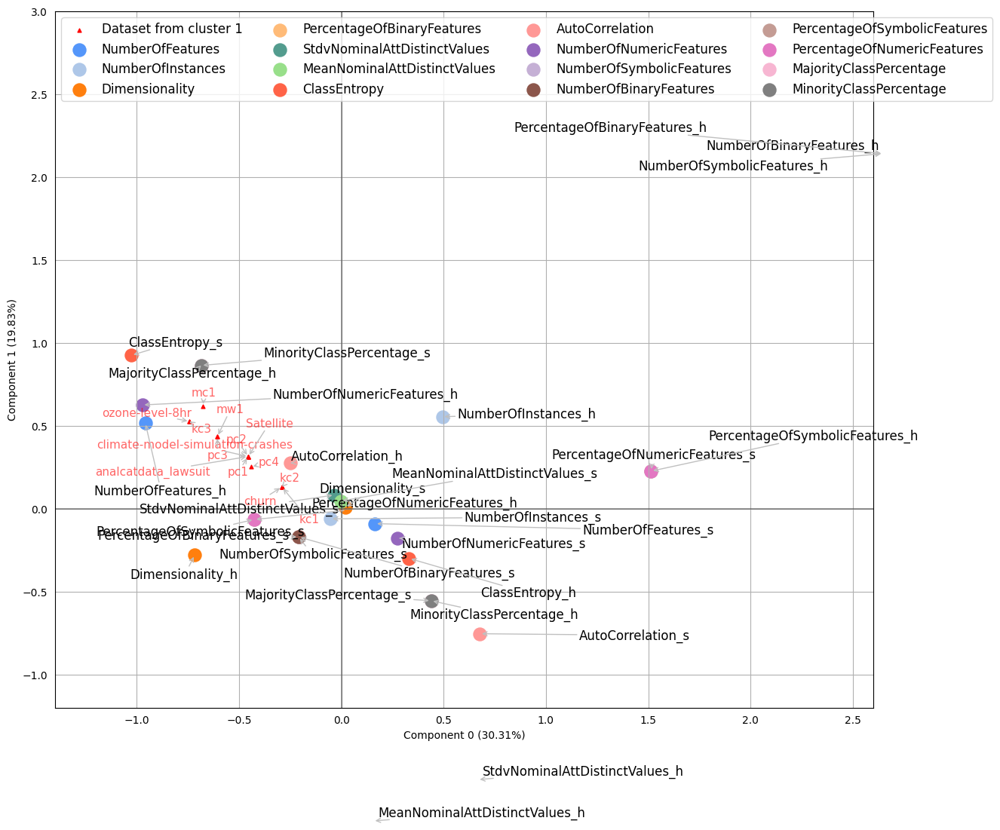

In [56]:
ax = mca.plot_coordinates(
     X=df_dataset_properties_copy,
     ax=None,
     figsize=(14,12),
     show_row_points=True,
     row_points_size=12,
     show_row_labels=True,
     show_column_points=True,
     column_points_size=150,
     show_column_labels=True,
     legend_n_cols=4,
     xlim=(-1.4,2.6),
     ylim=(-1.2,3),
     c=[False,True,False,False])

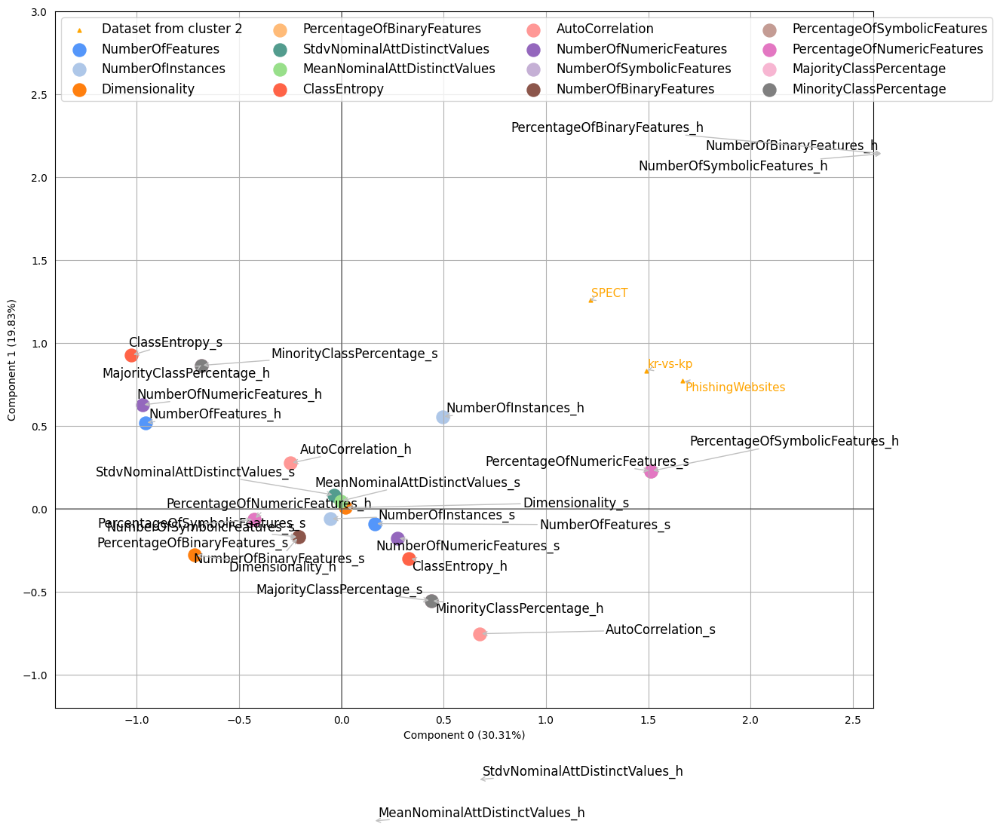

In [57]:
ax = mca.plot_coordinates(
     X=df_dataset_properties_copy,
     ax=None,
     figsize=(14,12),
     show_row_points=True,
     row_points_size=12,
     show_row_labels=True,
     show_column_points=True,
     column_points_size=150,
     show_column_labels=True,
     legend_n_cols=4,
     xlim=(-1.4,2.6),
     ylim=(-1.2,3),
     c=[False,False,True,False])

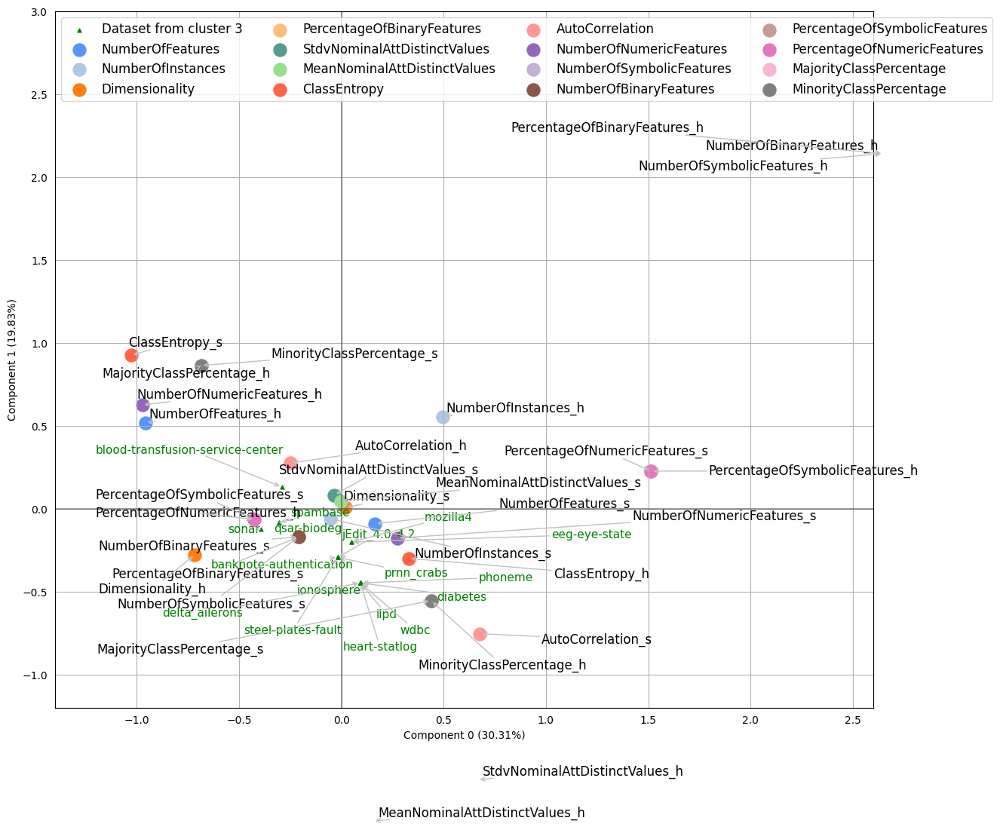

In [58]:
ax = mca.plot_coordinates(
     X=df_dataset_properties_copy,
     ax=None,
     figsize=(14,12),
     show_row_points=True,
     row_points_size=12,
     show_row_labels=True,
     show_column_points=True,
     column_points_size=150,
     show_column_labels=True,
     legend_n_cols=4,
     xlim=(-1.4,2.6),
     ylim=(-1.2,3),
     c=[False,False,False,True])

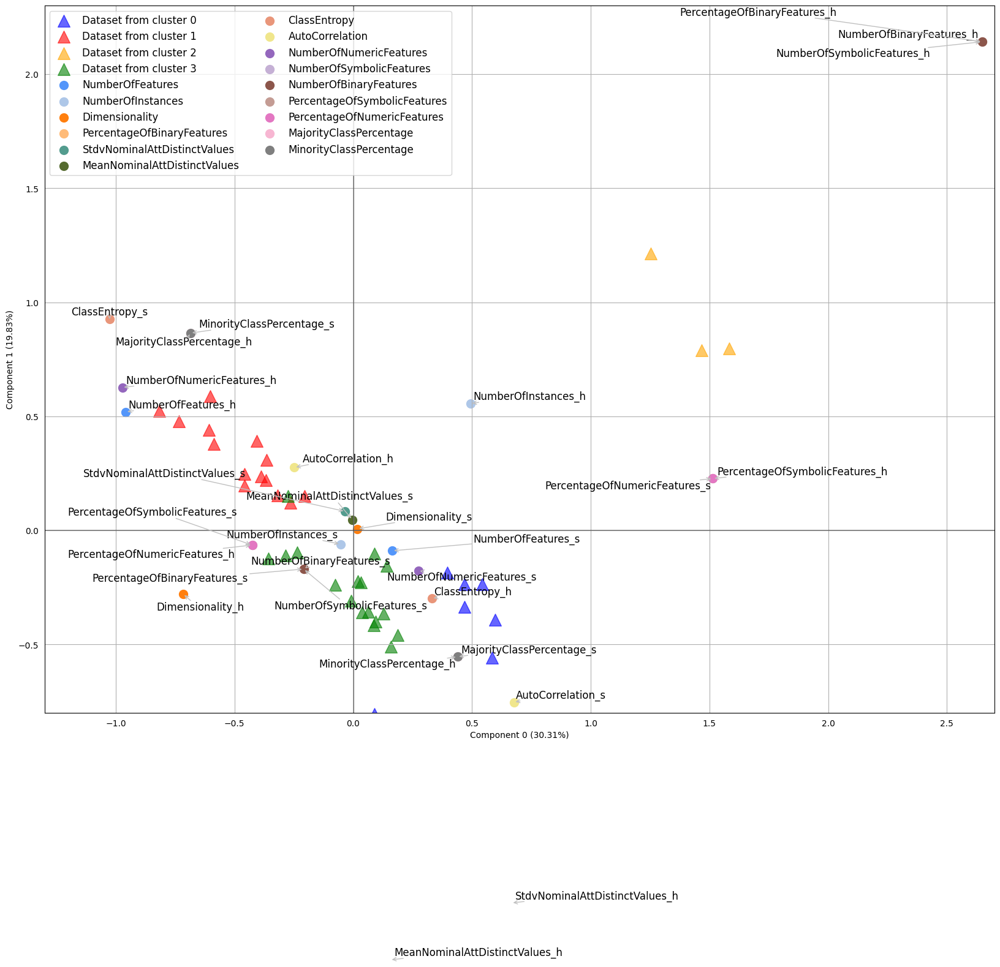

In [59]:
ax = mca.plot_coordinates(
     X=df_dataset_properties_copy,
     ax=None,
     figsize=(20,15),
     show_row_points=True,
     row_points_size=200,
     show_row_labels=False,
     show_column_points=True,
     column_points_size=100,
     show_column_labels=True,
     legend_n_cols=2,
     xlim=(-1.3,2.7),
     ylim=(-0.8,2.3),
     c=[True,True,True,True],
     row_points_alpha=0.6,
     colors = ['#5496fa','#aec7e8','#ff7f0e','#ffbb78','#539c8e','#556B2F','#E9967A','#F0E68C','#9467bd','#c5b0d5','#8c564b','#c49c94','#e377c2','#f7b6d2','#7f7f7f','#c7c7c7','#bcbd22','#dbdb8d','#17becf','#9edae5'])

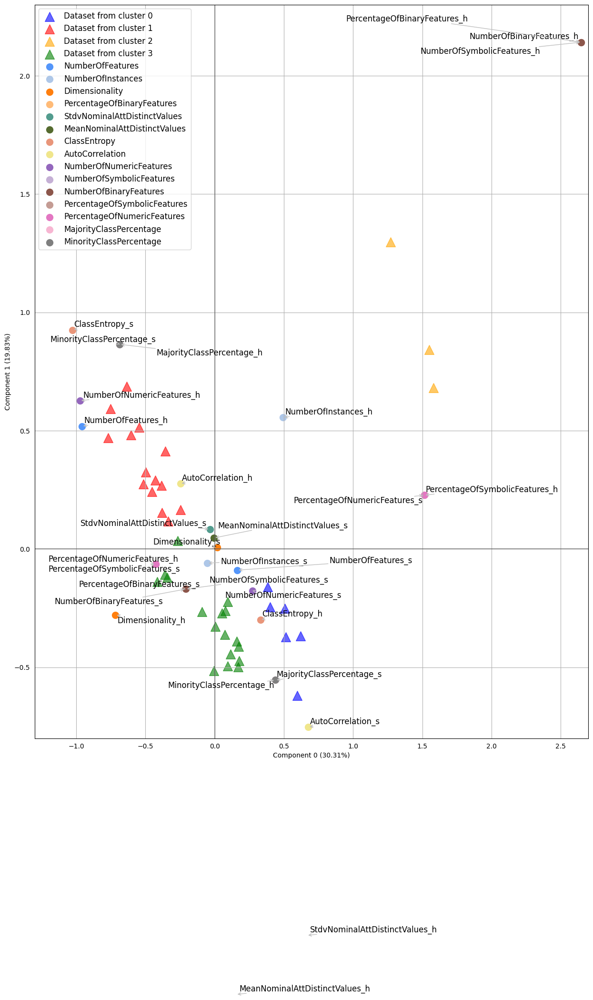

In [60]:
ax = mca.plot_coordinates(
     X=df_dataset_properties_copy,
     ax=None,
     figsize=(15,20),
     show_row_points=True,
     row_points_size=200,
     show_row_labels=False,
     show_column_points=True,
     column_points_size=100,
     show_column_labels=True,
     legend_n_cols=1,
     xlim=(-1.3,2.7),
     ylim=(-0.8,2.3),
     c=[True,True,True,True],
     row_points_alpha=0.6,
     colors = ['#5496fa','#aec7e8','#ff7f0e','#ffbb78','#539c8e','#556B2F','#E9967A','#F0E68C','#9467bd','#c5b0d5','#8c564b','#c49c94','#e377c2','#f7b6d2','#7f7f7f','#c7c7c7','#bcbd22','#dbdb8d','#17becf','#9edae5'])

## Main pipeline function

In [ ]:
do_download_files = do_download

def main_benchmark (code_datasets, df_dataset_properties_cluster,cluster_name,apply_smote=False):

  global path_dataset

  global X

  crossvalidation = 3

  cv_grid_search = crossvalidation

  models_name = ['m1','m2','m3','m4']

  #This dataset will be complete (with values) only in final of notebook
  dt = {  'm1':[],
          'm2':[],
          'm3':[],
          'm4':[]
        }
  df_models_accuracy_analisys = pd.DataFrame(dt)

  dt = {  'm1':[],
          'm2':[],
          'm3':[],
          'm4':[]
        }
  df_models_precision_analisys = pd.DataFrame(dt)

  dt = {  'm1':[],
          'm2':[],
          'm3':[],
          'm4':[]
        }
  df_models_recall_analisys = pd.DataFrame(dt)

  dt = {  'dataset_name'
          'm1_n_nodes':[],
          'm2_n_nodes':[],
          'm3_n_nodes':[],
          'm4_n_nodes':[]
        }
  df_models_nodes = pd.DataFrame(dt)

  dt = {  #'M1xM1':[],
          'm1xm2':[],
          'm1xm3':[],
          'm1xm4':[],
          #'M2xM2':[],
          'm2xm3':[],
          'm2xm4':[],
          #'M3xM3':[],
          'm3xm4':[]
          #'M4xM4':[]
        }
  df_models_friedman_analisys = pd.DataFrame(dt)

  dt = {'dataset_name':[],
          'model_name':[],
          'model_params':[],
          'accuracy':[],
          'precision':[],
          'recall':[],
          'correct_true':[],
          'correct_false':[]}
  df_models_info = pd.DataFrame(dt)

  dt = {'dataset_name':[],
          'model_name':[],
          'xai_vs_xai':[],
          'correlation':[]}
  df_resume_boxplot = pd.DataFrame(dt)

  dt = {'dataset_name':[],
          'model_name':[],
          'xai_vs_xai':[],
          'correlation':[]}
  df_resume_boxplot = pd.DataFrame(dt)

  dt = {  'model':[],
          'shap_vs_shap':[],
          'shap_vs_eli5':[],
          'shap_vs_dalex':[],
          'shap_vs_ci':[],
          'shap_vs_skater':[],
          'shap_vs_lofo':[],
          'shap_vs_info_gain':[],
          'shap_vs_exirt':[],
          'eli5_vs_eli5':[],
          'eli5_vs_dalex':[],
          'eli5_vs_ci':[],
          'eli5_vs_skater':[],
          'eli5_vs_lofo':[],
          'eli5_vs_info_gain':[],
          'eli5_vs_exirt':[],
          'dalex_vs_dalex':[],
          'dalex_vs_ci':[],
          'dalex_vs_skater':[],
          'dalex_vs_lofo':[],
          'dalex_vs_info_gain':[],
          'dalex_vs_exirt':[],
          'ci_vs_ci':[],
          'ci_vs_skater':[],
          'ci_vs_lofo':[],
          'ci_vs_info_gain':[],
          'ci_vs_exirt':[],
          'skater_vs_skater':[],
          'skater_vs_lofo':[],
          'skater_vs_info_gain':[],
          'lofo_vs_lofo':[],
          'lofo_vs_info_gain':[],
          'lofo_vs_exirt':[],
          'info_gain_vs_info_gain':[],
          'info_gain_vs_exirt':[],
          'exirt_vs_exirt':[]}
  df_resume_final_boxplot = pd.DataFrame(dt)







  #if run_train_test_model_* is False the upload of model is required
  run_train_test_model_m1 = True
  run_train_test_model_m2 = True
  run_train_test_model_m3 = True
  run_train_test_model_m4 = True

  crossvalidation = 10

  save_split_train_test_data = True



  print('## Execution of benchmark to: ')
  print(code_datasets)

  ind = 0
  indexf = -1

  for i in range(len(code_datasets)):

          indexf = indexf + 1

          df_models_nodes.loc[i,'dataset_name'] = str(code_datasets[i])

          df_models_info.loc[ind,'dataset_name'] = str(code_datasets[i])
          df_models_info.loc[ind+1,'dataset_name'] = str(code_datasets[i])
          df_models_info.loc[ind+2,'dataset_name'] = str(code_datasets[i])
          df_models_info.loc[ind+3,'dataset_name'] = str(code_datasets[i])

          #genarate diretocry
          path_dataset = '/'+code_datasets[i]
          dirByDataset(path_dataset)

          dataset = openml.datasets.get_dataset(code_datasets[i])

          print(dataset.get_data)

          X, Y, categorical_indicator, attribute_names = dataset.get_data(
                  dataset_format="dataframe", target=dataset.default_target_attribute)




          dt = {'att_original_names':[],
                'shap_m1':[],
                'shap_m2':[],
                'shap_m3':[],
                'shap_m4':[],
                'eli5_m1':[],
                'eli5_m2':[],
                'eli5_m3':[],
                'eli5_m4':[],
                'dalex_m1':[],
                'dalex_m2':[],
                'dalex_m3':[],
                'dalex_m4':[],
                'ci_m1':[],
                'ci_m2':[],
                'ci_m3':[],
                'ci_m4':[],
                'skater_m1':[],
                'skater_m2':[],
                'skater_m3':[],
                'skater_m4':[],
                'lofo_m1':[],
                'lofo_m2':[],
                'lofo_m3':[],
                'lofo_m4':[],
                'info_gain_m1':[],
                'info_gain_m2':[],
                'info_gain_m3':[],
                'info_gain_m4':[],
                'exirt_m1':[],
                'exirt_m2':[],
                'exirt_m3':[],
                'exirt_m4':[]}
          df_feature_rank = pd.DataFrame(dt)
          df_feature_rank['att_original_names'] = attribute_names


          #pre-process
          X = PreprocessDefault.PreprocessXByDataset(X,code_datasets[i])
          Y = PreprocessDefault.PreprocessYByDataset(Y,code_datasets[i])

          #X, Y = PreprocessDefault.PreprocessXY(X, Y)

          attribute_names = X.columns.to_list()



          print(X)

          #normalize data by min-max
          X = PreprocessDefault.normalize(X)

          #fix NaN (incorporar este trecho ao eXirt)
          X['class'] = Y
          X.dropna(inplace=True)
          Y = X['class']
          X = X.drop(columns=['class'])

          #print("pos processado")
          print(X.head(n=100))

          #create context dictionary (necessary to CIU)
          context_dic = {}
          for k in range(len(attribute_names)):
            context_dic[attribute_names[k]] = [min(X[attribute_names[k]]), max(X[attribute_names[k]]), Util.is_int(X[attribute_names[k]])]



          #split data
          X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, stratify=Y, random_state=41) # 95% training and 5% test


          if save_split_train_test_data == True:
              name_dataset = code_datasets[i]

              X_train.to_csv(path_content+path_csv+path_dataset+"/X_train_"+name_dataset+".csv")
              X_test.to_csv(path_content+path_csv+path_dataset+"/X_test_"+name_dataset+".csv")
              y_train.to_csv(path_content+path_csv+path_dataset+"/y_train_"+name_dataset+".csv")
              y_test.to_csv(path_content+path_csv+path_dataset+"/y_test_"+name_dataset+".csv")

              if do_download_files == True:
                files.download(path_content+path_csv+path_dataset+"/X_train_"+name_dataset+".csv")
                files.download(path_content+path_csv+path_dataset+"/X_test_"+name_dataset+".csv")
                files.download(path_content+path_csv+path_dataset+"/y_train_"+name_dataset+".csv")
                files.download(path_content+path_csv+path_dataset+"/y_test_"+name_dataset+".csv")


          #execution of model m1

          file_name = path_content+path_model+path_dataset+'/model_m1_'+code_datasets[i]+'.sav'

          df_models_info.loc[ind+1,'model_name'] = 'm1'

          if run_train_test_model_m1 == True:

            param_grid = { #https://lightgbm.readthedocs.io/en/latest/Parameters-Tuning.html
                'n_estimators': [100]
                #'max_depth': [5]
            }


            # Create a based model

            model_m1 = lgb.LGBMClassifier()
            # Instantiate the grid search model
            #https://scikit-learn.org/stable/auto_examples/model_selection/plot_cv_indices.html#sphx-glr-auto-examples-model-selection-plot-cv-indices-py
            grid_search = GridSearchCV(estimator = model_m1, param_grid = param_grid,
                                      cv = StratifiedKFold(cv_grid_search), n_jobs = 3,
                                       verbose = 2,scoring = 'roc_auc')


            # Fit the grid search to the data
            grid_search.fit(X_train, y_train)

            print(grid_search.best_params_)

            model_m1 = grid_search.best_estimator_

            #TO-DO
            #_, n_nodes = model_m1.decision_path(X)
            #df_models_nodes.loc[i,'m1_n_nodes'] = sum(n_nodes)

            model_m1_copy_1 = grid_search.best_estimator_

            #save model
            pickle.dump(model_m1, open(file_name, 'wb'))
            if do_download_files == True:
              files.download(file_name)
          else:
            model_m1 = pickle.load(open(file_name, 'rb'))

          y_pred_m1=model_m1.predict(X_test)
          print(model_m1)
          df_models_info.loc[ind+1,'model_params'] = str(model_m1.get_params())

          #analysis precision, accuracy and recall
          ac, pr, re = AnalysisDefault.calcAccuracyPrecisionRecallByModel(y_test,y_pred_m1)

          df_models_accuracy_analisys.loc[i,'m1'] = ac
          df_models_precision_analisys.loc[i,'m1'] = pr
          df_models_recall_analisys.loc[i,'m1'] = re

          df_models_info.loc[ind+1,'accuracy'] = ac
          df_models_info.loc[ind+1,'precision'] = pr
          df_models_info.loc[ind+1,'recall'] = re

          #confusion matrix
          tp, tn = AnalysisDefault.calcConfusionMatrix(y_test,y_pred_m1,"m1")
          df_models_info.loc[ind+1,'correct_true'] = tp
          df_models_info.loc[ind+1,'correct_false'] = tn


          #statistical analysis
          hit_rates = AnalysisDefault.calcCrossValidation(model_m1,X_train, y_train, crossvalidation, False)
          hit_rates_m1 = hit_rates

	        #execution of model m2

          file_name = path_content+path_model+path_dataset+'/model_m2_'+code_datasets[i]+'.sav'

          df_models_info.loc[ind+1,'model_name'] = 'm2'

          if run_train_test_model_m2 == True:

            param_grid = {
                'iterations': [1000]
                #'depth': [5]
            }


            # Create a based model
            model_m2 = CatBoostClassifier(silent=True, cat_features=Util.identifyCatFeatures(X))
            # Instantiate the grid search model
            #https://scikit-learn.org/stable/auto_examples/model_selection/plot_cv_indices.html#sphx-glr-auto-examples-model-selection-plot-cv-indices-py
            grid_search = GridSearchCV(estimator = model_m2, param_grid = param_grid,
                                      cv = StratifiedKFold(cv_grid_search), n_jobs = 3,
                                       verbose = 2,scoring = 'roc_auc')


            # Fit the grid search to the data
            grid_search.fit(X_train, y_train)

            print(grid_search.best_params_)

            model_m2 = grid_search.best_estimator_

            #TO-DO
            #_, n_nodes = model_m2.decision_path(X)
            #df_models_nodes.loc[i,'m2_n_nodes'] = sum(n_nodes)

            model_m2_copy_1 = grid_search.best_estimator_

            #save model
            pickle.dump(model_m2, open(file_name, 'wb'))
            if do_download_files == True:
              files.download(file_name)
          else:
            model_m2 = pickle.load(open(file_name, 'rb'))

          y_pred_m2=model_m2.predict(X_test)
          print(model_m2)
          df_models_info.loc[ind+1,'model_params'] = str(model_m2.get_params())

          #analysis precision, accuracy and recall
          ac, pr, re = AnalysisDefault.calcAccuracyPrecisionRecallByModel(y_test,y_pred_m2)

          df_models_accuracy_analisys.loc[i,'m2'] = ac
          df_models_precision_analisys.loc[i,'m2'] = pr
          df_models_recall_analisys.loc[i,'m2'] = re

          df_models_info.loc[ind+1,'accuracy'] = ac
          df_models_info.loc[ind+1,'precision'] = pr
          df_models_info.loc[ind+1,'recall'] = re

          #confusion matrix
          tp, tn = AnalysisDefault.calcConfusionMatrix(y_test,y_pred_m2,"m2")
          df_models_info.loc[ind+1,'correct_true'] = tp
          df_models_info.loc[ind+1,'correct_false'] = tn


          #statistical analysis
          hit_rates = AnalysisDefault.calcCrossValidation(model_m2,X_train, y_train, crossvalidation, False)
          hit_rates_m2 = hit_rates

          #execution of model m3

          file_name = path_content+path_model+path_dataset+'/model_m3_'+code_datasets[i]+'.sav'

          df_models_info.loc[ind+1,'model_name'] = 'm3'

          if run_train_test_model_m3 == True:

            param_grid = {
                'n_estimators': [100]#,
                #'max_depth': [5]
            }


            # Create a based model
            model_m3 = RandomForestClassifier()
            # Instantiate the grid search model
            #https://scikit-learn.org/stable/auto_examples/model_selection/plot_cv_indices.html#sphx-glr-auto-examples-model-selection-plot-cv-indices-py
            grid_search = GridSearchCV(estimator = model_m3, param_grid = param_grid,
                                      cv = StratifiedKFold(cv_grid_search), n_jobs = 3,
                                       verbose = 2,scoring = 'roc_auc')


            # Fit the grid search to the data
            grid_search.fit(X_train, y_train)

            print(grid_search.best_params_)

            model_m3 = grid_search.best_estimator_

            #TO-DO
            #_, n_nodes = model_m3.decision_path(X)
            #df_models_nodes.loc[i,'m3_n_nodes'] = sum(n_nodes)

            model_m3_copy_1 = grid_search.best_estimator_

            #save model
            pickle.dump(model_m3, open(file_name, 'wb'))
            if do_download_files == True:
              files.download(file_name)
          else:
            model_m3 = pickle.load(open(file_name, 'rb'))

          y_pred_m3=model_m3.predict(X_test)
          print(model_m3)
          df_models_info.loc[ind+1,'model_params'] = str(model_m3.get_params())

          #analysis precision, accuracy and recall
          ac, pr, re = AnalysisDefault.calcAccuracyPrecisionRecallByModel(y_test,y_pred_m3)

          df_models_accuracy_analisys.loc[i,'m3'] = ac
          df_models_precision_analisys.loc[i,'m3'] = pr
          df_models_recall_analisys.loc[i,'m3'] = re

          df_models_info.loc[ind+1,'accuracy'] = ac
          df_models_info.loc[ind+1,'precision'] = pr
          df_models_info.loc[ind+1,'recall'] = re

          #confusion matrix
          tp, tn = AnalysisDefault.calcConfusionMatrix(y_test,y_pred_m3,"m3")
          df_models_info.loc[ind+1,'correct_true'] = tp
          df_models_info.loc[ind+1,'correct_false'] = tn


          #statistical analysis
          hit_rates = AnalysisDefault.calcCrossValidation(model_m3,X_train, y_train, crossvalidation, False)
          hit_rates_m3 = hit_rates


          	  #execution of model m4

          file_name = path_content+path_model+path_dataset+'/model_m4_'+code_datasets[i]+'.sav'

          df_models_info.loc[ind+1,'model_name'] = 'm4'

          if run_train_test_model_m4 == True:

            param_grid = {
                'n_estimators': [100]#,
                #'max_depth': [5]
            }


            # Create a based model
            model_m4 = GradientBoostingClassifier()
            # Instantiate the grid search model
            #https://scikit-learn.org/stable/auto_examples/model_selection/plot_cv_indices.html#sphx-glr-auto-examples-model-selection-plot-cv-indices-py
            grid_search = GridSearchCV(estimator = model_m4, param_grid = param_grid,
                                      cv = StratifiedKFold(cv_grid_search), n_jobs = 3,
                                       verbose = 2,scoring = 'roc_auc')


            # Fit the grid search to the data
            grid_search.fit(X_train, y_train)

            print(grid_search.best_params_)

            model_m4 = grid_search.best_estimator_

            #TO-DO
            #_, n_nodes = model_m4.decision_path(X)
            #df_models_nodes.loc[i,'m4_n_nodes'] = sum(n_nodes)

            model_m4_copy_1 = grid_search.best_estimator_

            #save model
            pickle.dump(model_m4, open(file_name, 'wb'))
            if do_download_files == True:
              files.download(file_name)
          else:
            model_m4 = pickle.load(open(file_name, 'rb'))

          y_pred_m4=model_m4.predict(X_test)
          print(model_m4)
          df_models_info.loc[ind+1,'model_params'] = str(model_m4.get_params())

          #analysis precision, accuracy and recall
          ac, pr, re = AnalysisDefault.calcAccuracyPrecisionRecallByModel(y_test,y_pred_m4)

          df_models_accuracy_analisys.loc[i,'m4'] = ac
          df_models_precision_analisys.loc[i,'m4'] = pr
          df_models_recall_analisys.loc[i,'m4'] = re

          df_models_info.loc[ind+1,'accuracy'] = ac
          df_models_info.loc[ind+1,'precision'] = pr
          df_models_info.loc[ind+1,'recall'] = re

          #confusion matrix
          tp, tn = AnalysisDefault.calcConfusionMatrix(y_test,y_pred_m4,"m4")
          df_models_info.loc[ind+1,'correct_true'] = tp
          df_models_info.loc[ind+1,'correct_false'] = tn


          #statistical analysis
          hit_rates = AnalysisDefault.calcCrossValidation(model_m4,X_train, y_train, crossvalidation, False)
          hit_rates_m4 = hit_rates

          #statisticals comparations
          name = str(path_content+path_fig+path_dataset+"/fig_crossval_dataset_"+code_datasets[i]+".pdf")
          AnalysisDefault.plotComparationCrossValidation(hit_rates_m1,hit_rates_m2,hit_rates_m3,hit_rates_m4,name)


          name = str(path_content+path_fig+path_dataset+"/fig_friedman_dataset_"+code_datasets[i]+".pdf")
          AnalysisDefault.plotFriedmanTest(hit_rates_m1,hit_rates_m2,hit_rates_m3,hit_rates_m4,name)
          friedCoef, line_df_models_friedman = AnalysisDefault.calcFriedmanTest(hit_rates_m1,hit_rates_m2,hit_rates_m3,hit_rates_m4,models_names=models_name)


          df_models_friedman_analisys.loc[len(df_models_friedman_analisys)] = line_df_models_friedman


          X_data = X_test.copy(deep=True)

          #explanation by skater
          print()
          print('Skater explaning...')
          print('Explaining M1...')
          df_feature_rank['skater_m1'] = ExplainableTools.explainRankSkater(model_m1, X_data)
          print('Explaining M2...')
          df_feature_rank['skater_m2'] = ExplainableTools.explainRankSkater(model_m2, X_data)
          #print('Explaining M3...')
          df_feature_rank['skater_m3'] = ExplainableTools.explainRankSkater(model_m3, X_data)
          print('Explaining M4...')
          df_feature_rank['skater_m4'] = ExplainableTools.explainRankSkater(model_m4, X_data)

          del X_data
          X_data = X_test.copy(deep=True)
          y_data = y_test.copy(deep=True)

          #explanation by eli5
          print()
          print('Eli5 explaning...')
          print('Explaining M1...')
          df_feature_rank['eli5_m1'] = ExplainableTools.explainRankByEli5(model_m1, X_data, y_data)
          print('Explaining M2...')
          df_feature_rank['eli5_m2'] = ExplainableTools.explainRankByEli5(model_m2, X_data, y_data)
          print('Explaining M3...')
          df_feature_rank['eli5_m3'] = ExplainableTools.explainRankByEli5(model_m3, X_data, y_data)
          print('Explaining M4...')
          df_feature_rank['eli5_m4'] = ExplainableTools.explainRankByEli5(model_m4, X_data, y_data)

          del X_data
          del y_data
          X_data = X_test.copy(deep=True)

          #explanation by tree shap
          print()
          print('Shap explaning...')
          print('Explaining M1...')
          df_feature_rank['shap_m1'] = ExplainableTools.explainRankByTreeShap(model_m1, attribute_names, X_data)
          print('Explaining M2...')
          df_feature_rank['shap_m2'] = ExplainableTools.explainRankByTreeShap(model_m2,attribute_names, X_data,is_gradient=True)
          print('Explaining M3...')
          df_feature_rank['shap_m3'] = ExplainableTools.explainRankByTreeShap(model_m3,attribute_names, X_data)
          print('Explaining M4...')
          df_feature_rank['shap_m4'] = ExplainableTools.explainRankByTreeShap(model_m4,attribute_names, X_data,is_gradient=True)

          del X_data
          X_data = X_test.copy(deep=True)
          y_data = y_test.copy(deep=True)


          #explanation by dalex
          print()
          print('Dalex explaning...')
          print('Explaining M1...')
          df_feature_rank['dalex_m1'] = ExplainableTools.explainRankDalex(model_m1,X_data, y_data)
          print('Explaining M2...')
          df_feature_rank['dalex_m2'] = ExplainableTools.explainRankDalex(model_m2,X_data, y_data)
          print('Explaining M3...')
          df_feature_rank['dalex_m3'] = ExplainableTools.explainRankDalex(model_m3,X_data, y_data)
          print('Explaining M4...')
          df_feature_rank['dalex_m4'] = ExplainableTools.explainRankDalex(model_m4,X_data, y_data)

          del X_data
          X_data = X_test.copy(deep=True)

          #explanation by ci
          print()
          print('CI explaning...')
          print('Explaining M1...')
          df_feature_rank['ci_m1'] = ExplainableTools.explainRankByCiu(model_m1, X_data, X, attribute_names, context_dic,rank='ci')
          print('Explaining M2...')
          df_feature_rank['ci_m2'] = ExplainableTools.explainRankByCiu(model_m2, X_data, X, attribute_names, context_dic,rank='ci')
          print('Explaining M3...')
          df_feature_rank['ci_m3'] = ExplainableTools.explainRankByCiu(model_m3, X_data, X, attribute_names, context_dic,rank='ci')
          print('Explaining M4...')
          df_feature_rank['ci_m4'] = ExplainableTools.explainRankByCiu(model_m4, X_data, X, attribute_names, context_dic,rank='ci')

          del X_data
          X_data = X_test.copy(deep=True)
          y_data = y_test.copy(deep=True)

          #explanation by lofo
          print()
          print('Lofo explaning...')
          print('Explaining M1...')
          df_feature_rank['lofo_m1'] = ExplainableTools.explainRankByLofo(model_m1, X_data, y_data, attribute_names)
          print('Explaining M2...')
          df_feature_rank['lofo_m2'] = ExplainableTools.explainRankByLofo(model_m2, X_data, y_data, attribute_names)
          print('Explaining M3...')
          df_feature_rank['lofo_m3'] = ExplainableTools.explainRankByLofo(model_m3, X_data, y_data, attribute_names)
          print('Explaining M4...')
          df_feature_rank['lofo_m4'] = ExplainableTools.explainRankByLofo(model_m4, X_data, y_data, attribute_names)

          del X_data
          del y_data
          X_data_train = X_train.copy(deep=True)
          X_data_test = X_test.copy(deep=True)
          y_data_train = y_train.copy(deep=True)
          y_data_test = y_test.copy(deep=True)

          #explanation by exirt
          print()
          print('eXirt explaning...')
          print('Explaining M1...')
          df_feature_rank['exirt_m1'], temp = explainer.explainRankByEXirt(model_m1, X_data_train, X_data_test, y_data_train, y_data_test,code_datasets[i]+'_m1')
          print('Explaining M2...')
          df_feature_rank['exirt_m2'], temp = explainer.explainRankByEXirt(model_m2, X_data_train, X_data_test, y_data_train, y_data_test,code_datasets[i]+'_m2')
          print('Explaining M3...')
          df_feature_rank['exirt_m3'], temp = explainer.explainRankByEXirt(model_m3, X_data_train, X_data_test, y_data_train, y_data_test,code_datasets[i]+'_m3')
          print('Explaining M4...')
          df_feature_rank['exirt_m4'], temp = explainer.explainRankByEXirt(model_m4, X_data_train, X_data_test, y_data_train, y_data_test,code_datasets[i]+'_m4')

          del X_data_train
          del X_data_test
          del y_data_train
          del y_data_test
          X_data = X_test.copy(deep=True)
          y_data = y_test.copy(deep=True)

          #explanation by info gain
          print()
          print('Infomation gain rank...')
          rank_info_gain = ExplainableTools.explainRankByInfoGain(X_data, y_data, attribute_names)
          print('Info rank 1...')
          df_feature_rank['info_gain_m1'] = rank_info_gain
          print('Info rank 2...')
          df_feature_rank['info_gain_m2'] = rank_info_gain
          print('Info rank 3...')
          df_feature_rank['info_gain_m3'] = rank_info_gain
          print('Info rank 4...')
          df_feature_rank['info_gain_m4'] = rank_info_gain

          del X_data
          del y_data




          #spearman correlation m1

          dt = {'tool':['shap_m1','eli5_m1','dalex_m1','ci_m1','skater_m1','lofo_m1','info_gain_m1', 'exirt_m1'],
                'shap_m1':[0,0,0,0,0,0,0,0],
                'eli5_m1':[0,0,0,0,0,0,0,0],
                'dalex_m1':[0,0,0,0,0,0,0,0],
                'ci_m1':[0,0,0,0,0,0,0,0],
                'skater_m1':[0,0,0,0,0,0,0,0],
                'lofo_m1':[0,0,0,0,0,0,0,0],
                'info_gain_m1':[0,0,0,0,0,0,0,0],
                'exirt_m1':[0,0,0,0,0,0,0,0],
                }
          df_spearman_correlations_m1 = pd.DataFrame(dt)
          df_spearman_correlations_m1 = df_spearman_correlations_m1.set_index('tool')


          indexf = indexf + 1

          df_resume_final_boxplot.loc[indexf,'model'] = 'm1'
          for index1, d1 in enumerate(df_spearman_correlations_m1.columns.to_list()):
            for index2, d2 in enumerate(df_spearman_correlations_m1.columns.to_list()):
              if index1 >= index2:
                if d1 != 'tool' and d2 != 'tool':
                  df_spearman_correlations_m1.loc[d1,d2] =  AnalysisDefault.calcSpearmanCoef(df_feature_rank[d1],df_feature_rank[d2])
                  df_resume_final_boxplot.loc[indexf,str(d1.replace('_m1','')+'_vs_'+d2.replace('_m1',''))] = df_spearman_correlations_m1.loc[d1,d2]



          df_spearman_correlations_m1 = df_spearman_correlations_m1.reset_index()
          minSp = -0.7
          maxSp = 0.7
          sns.heatmap(df_spearman_correlations_m1.drop(columns='tool').values,xticklabels=df_spearman_correlations_m1['tool'].values,yticklabels=df_spearman_correlations_m1['tool'].values, vmin=minSp, vmax=maxSp,cmap="RdYlGn",linewidths=.5,annot=True)

          name_fig = path_content+path_fig+path_dataset+"/fig_spearman_coeficients_matrix_"+code_datasets[i]+"_m1.pdf"
          plt.savefig(name_fig)
          plt.show()
          if do_download_files == True:
            files.download(name_fig)

          name_df = path_content+path_csv+path_dataset+"/df_spearman_coeficients_matrix_"+code_datasets[i]+"_m1.csv"
          df_spearman_correlations_m1.to_csv(name_df)
          if do_download_files == True:
            files.download(name_df)


          #spearman correlation m2

          dt = {'tool':['shap_m2','eli5_m2','dalex_m2','ci_m2','skater_m2','lofo_m2','info_gain_m2', 'exirt_m2'],
                'shap_m2':[0,0,0,0,0,0,0,0],
                'eli5_m2':[0,0,0,0,0,0,0,0],
                'dalex_m2':[0,0,0,0,0,0,0,0],
                'ci_m2':[0,0,0,0,0,0,0,0],
                'skater_m2':[0,0,0,0,0,0,0,0],
                'lofo_m2':[0,0,0,0,0,0,0,0],
                'info_gain_m2':[0,0,0,0,0,0,0,0],
                'exirt_m2':[0,0,0,0,0,0,0,0],
                }
          df_spearman_correlations_m2 = pd.DataFrame(dt)
          df_spearman_correlations_m2 = df_spearman_correlations_m2.set_index('tool')


          indexf = indexf + 1

          df_resume_final_boxplot.loc[indexf,'model'] = 'm2'
          for index1, d1 in enumerate(df_spearman_correlations_m2.columns.to_list()):
            for index2, d2 in enumerate(df_spearman_correlations_m2.columns.to_list()):
              if index1 >= index2:
                if d1 != 'tool' and d2 != 'tool':
                  df_spearman_correlations_m2.loc[d1,d2] =  AnalysisDefault.calcSpearmanCoef(df_feature_rank[d1],df_feature_rank[d2])
                  df_resume_final_boxplot.loc[indexf,str(d1.replace('_m2','')+'_vs_'+d2.replace('_m2',''))] = df_spearman_correlations_m2.loc[d1,d2]



          df_spearman_correlations_m2 = df_spearman_correlations_m2.reset_index()
          minSp = -0.7
          maxSp = 0.7
          sns.heatmap(df_spearman_correlations_m2.drop(columns='tool').values,xticklabels=df_spearman_correlations_m2['tool'].values,yticklabels=df_spearman_correlations_m2['tool'].values, vmin=minSp, vmax=maxSp,cmap="RdYlGn",linewidths=.5,annot=True)

          name_fig = path_content+path_fig+path_dataset+"/fig_spearman_coeficients_matrix_"+code_datasets[i]+"_m2.pdf"
          plt.savefig(name_fig)
          plt.show()
          if do_download_files == True:
            files.download(name_fig)

          name_df = path_content+path_csv+path_dataset+"/df_spearman_coeficients_matrix_"+code_datasets[i]+"_m2.csv"
          df_spearman_correlations_m2.to_csv(name_df)
          if do_download_files == True:
            files.download(name_df)


          #spearman correlation m3

          dt = {'tool':['shap_m3','eli5_m3','dalex_m3','ci_m3','skater_m3','lofo_m3','info_gain_m3', 'exirt_m3'],
                'shap_m3':[0,0,0,0,0,0,0,0],
                'eli5_m3':[0,0,0,0,0,0,0,0],
                'dalex_m3':[0,0,0,0,0,0,0,0],
                'ci_m3':[0,0,0,0,0,0,0,0],
                'skater_m3':[0,0,0,0,0,0,0,0],
                'lofo_m3':[0,0,0,0,0,0,0,0],
                'info_gain_m3':[0,0,0,0,0,0,0,0],
                'exirt_m3':[0,0,0,0,0,0,0,0],
                }
          df_spearman_correlations_m3 = pd.DataFrame(dt)
          df_spearman_correlations_m3 = df_spearman_correlations_m3.set_index('tool')


          indexf = indexf + 1

          df_resume_final_boxplot.loc[indexf,'model'] = 'm3'
          for index1, d1 in enumerate(df_spearman_correlations_m3.columns.to_list()):
            for index2, d2 in enumerate(df_spearman_correlations_m3.columns.to_list()):
              if index1 >= index2:
                if d1 != 'tool' and d2 != 'tool':
                  df_spearman_correlations_m3.loc[d1,d2] =  AnalysisDefault.calcSpearmanCoef(df_feature_rank[d1],df_feature_rank[d2])
                  df_resume_final_boxplot.loc[indexf,str(d1.replace('_m3','')+'_vs_'+d2.replace('_m3',''))] = df_spearman_correlations_m3.loc[d1,d2]



          df_spearman_correlations_m3 = df_spearman_correlations_m3.reset_index()
          minSp = -0.7
          maxSp = 0.7
          sns.heatmap(df_spearman_correlations_m3.drop(columns='tool').values,xticklabels=df_spearman_correlations_m3['tool'].values,yticklabels=df_spearman_correlations_m3['tool'].values, vmin=minSp, vmax=maxSp,cmap="RdYlGn",linewidths=.5,annot=True)

          name_fig = path_content+path_fig+path_dataset+"/fig_spearman_coeficients_matrix_"+code_datasets[i]+"_m3.pdf"
          plt.savefig(name_fig)
          plt.show()
          if do_download_files == True:
            files.download(name_fig)

          name_df = path_content+path_csv+path_dataset+"/df_spearman_coeficients_matrix_"+code_datasets[i]+"_m3.csv"
          df_spearman_correlations_m3.to_csv(name_df)
          if do_download_files == True:
            files.download(name_df)

          #spearman correlation m4

          dt = {'tool':['shap_m4','eli5_m4','dalex_m4','ci_m4','skater_m4','lofo_m4','info_gain_m4', 'exirt_m4'],
                'shap_m4':[0,0,0,0,0,0,0,0],
                'eli5_m4':[0,0,0,0,0,0,0,0],
                'dalex_m4':[0,0,0,0,0,0,0,0],
                'ci_m4':[0,0,0,0,0,0,0,0],
                'skater_m4':[0,0,0,0,0,0,0,0],
                'lofo_m4':[0,0,0,0,0,0,0,0],
                'info_gain_m4':[0,0,0,0,0,0,0,0],
                'exirt_m4':[0,0,0,0,0,0,0,0],
                }
          df_spearman_correlations_m4 = pd.DataFrame(dt)
          df_spearman_correlations_m4 = df_spearman_correlations_m4.set_index('tool')


          indexf = indexf + 1

          df_resume_final_boxplot.loc[indexf,'model'] = 'm4'
          for index1, d1 in enumerate(df_spearman_correlations_m4.columns.to_list()):
            for index2, d2 in enumerate(df_spearman_correlations_m4.columns.to_list()):
              if index1 >= index2:
                if d1 != 'tool' and d2 != 'tool':
                  df_spearman_correlations_m4.loc[d1,d2] =  AnalysisDefault.calcSpearmanCoef(df_feature_rank[d1],df_feature_rank[d2])
                  df_resume_final_boxplot.loc[indexf,str(d1.replace('_m4','')+'_vs_'+d2.replace('_m4',''))] = df_spearman_correlations_m4.loc[d1,d2]



          df_spearman_correlations_m4 = df_spearman_correlations_m4.reset_index()
          minSp = -0.7
          maxSp = 0.7
          sns.heatmap(df_spearman_correlations_m4.drop(columns='tool').values,xticklabels=df_spearman_correlations_m4['tool'].values,yticklabels=df_spearman_correlations_m4['tool'].values, vmin=minSp, vmax=maxSp,cmap="RdYlGn",linewidths=.5,annot=True)

          name_fig = path_content+path_fig+path_dataset+"/fig_spearman_coeficients_matrix_"+code_datasets[i]+"_m4.pdf"
          plt.savefig(name_fig)
          plt.show()
          if do_download_files == True:
            files.download(name_fig)

          name_df = path_content+path_csv+path_dataset+"/df_spearman_coeficients_matrix_"+code_datasets[i]+"_m4.csv"
          df_spearman_correlations_m4.to_csv(name_df)
          if do_download_files == True:
            files.download(name_df)

          ind = ind + 5

          name = path_content+path_csv+'/df_models_info.csv'
          df_models_info.to_csv(name)
          if do_download_files == True:
            files.download(name)

          name_df = path_content+path_csv+path_dataset+"/df_features_ranks_by_"+code_datasets[i]+".csv"
          df_feature_rank.to_csv(name_df)
          if do_download_files == True:
            files.download(name_df)



  return df_resume_final_boxplot, df_dataset_properties_cluster, models_name, df_models_friedman_analisys, df_models_accuracy_analisys, df_models_precision_analisys, df_models_recall_analisys

def plot_resume(dfs_ret, df_dataset_properties_cluster, models_name, cluster):

  #fix plot after remaker
  dfs_ret = dfs_ret.dropna(axis=1)
  dfs_ret = dfs_ret.drop(columns=['info_gain_vs_ci',
                                  'info_gain_vs_dalex',
                                  'info_gain_vs_eli5',
                                  'info_gain_vs_skater',
                                  #'dalex_vs_eli5',
                                  'info_gain_vs_lofo',
                                  #'lofo_vs_dalex',
                                  #'skater_vs_eli5',
                                  'info_gain_vs_shap',
                                  #'ci_vs_dalex',
                                  #'lofo_vs_shap',
                                  #'dalex_vs_shap',
                                  #'skater_vs_ci',
                                  #'ci_vs_shap',
                                  #'lofo_vs_skater',
                                  #'ci_vs_eli5',
                                  #'eli5_vs_shap',
                                  #'lofo_vs_ci',
                                  #'lofo_vs_eli5',
                                  #'skater_vs_shap',
                                  #'skater_vs_dalex',
                                  'shap_vs_shap',
                                  'eli5_vs_eli5',
                                  'lofo_vs_lofo',
                                  'skater_vs_skater',
                                  'exirt_vs_exirt',
                                  'info_gain_vs_info_gain',
                                  'ci_vs_ci',
                                  'dalex_vs_dalex'])

  dfs_ret = [dfs_ret[dfs_ret['model'] == 'm1'],
             dfs_ret[dfs_ret['model'] == 'm2'],
             dfs_ret[dfs_ret['model'] == 'm3'],
             dfs_ret[dfs_ret['model'] == 'm4']]



  for ii, df_boxplot in enumerate(dfs_ret):


      #df_boxplot.boxplot()
      figure(figsize=(6, 4), dpi=100)
      meds = df_boxplot.median()
      meds.sort_values(ascending=True, inplace=True)
      df2 = df_boxplot[meds.index]

      axes = df2.boxplot(rot=90,return_type='axes')
      plt.title('Resume: ' +models_name[ii] + ' - Cluster: '+str(cluster))
      axes.set_ylim(-1, 1)
      major_ticks = np.arange(-1.1, 1.1, 0.1)


      axes.set_yticks(major_ticks)

      plt.savefig(path_content+path_fig+'/resume_benchmark_'+models_name[ii]+'.pdf')
      plt.show()


  dfs_ret_ultimate = dfs_ret.copy()

  list_lofo_means_of_medians = []
  list_exirt_means_of_medians = []
  list_xai_means_of_medians = []

  for i, df_comparation in enumerate(dfs_ret_ultimate):
    list_lofo_medians = []
    list_exirt_medians = []
    list_xai_medians = []
    for ii, col in enumerate(df_comparation.columns):
       if (col == 'eli5_vs_shap'   or
           col == 'skater_vs_ci'   or
           col == 'dalex_vs_shap'  or
           col == 'dalex_vs_eli5'  or
           col == 'ci_vs_eli5'     or
           col == 'ci_vs_dalex'    or
           col == 'skater_vs_shap' or
           col == 'skater_vs_eli5' or
           col == 'skater_vs_dalex'or
           col == 'ci_vs_shap'):
         list_xai_medians.append(df_comparation[col].median())

       if (col == 'exirt_vs_shap'   or
           col == 'exirt_vs_eli5'   or
           col == 'exirt_vs_dalex'  or
           col == 'exirt_vs_ci'     or
           col == 'exirt_vs_skater'):
          list_exirt_medians.append(df_comparation[col].median())

       if (col == 'lofo_vs_shap'   or
           col == 'lofo_vs_eli5'   or
           col == 'lofo_vs_dalex'  or
           col == 'lofo_vs_ci'     or
           col == 'lofo_vs_skater'):
          list_lofo_medians.append(df_comparation[col].median())

  #   list_lofo_means_of_medians.append(sum(list_lofo_medians)/len(list_lofo_medians))
  #   list_exirt_means_of_medians.append(sum(list_exirt_medians)/len(list_exirt_medians))
  #   list_xai_means_of_medians.append(sum(list_xai_medians)/len(list_xai_medians))

  # df = pd.DataFrame({
  #   'MOM eXirt': list_exirt_means_of_medians,
  #   'MOM XAI': list_xai_means_of_medians,
  #   'MOM Lofo': list_lofo_means_of_medians}, index=[1, 2, 3, 4])
  # df.plot.line(grid=True,figsize=(7,6),xticks=[1,2,3,4],yticks=np.arange(0, 1.1, step=0.05),ylim=(0,1.1),style='-o')
  # return df

def plot_resume_eXirt(dfs_ret, df_dataset_properties_cluster, models_name, cluster):

  #fix plot after remaker
  dfs_ret = dfs_ret.dropna(axis=1)
  dfs_ret = dfs_ret.drop(columns=['info_gain_vs_ci',
                                  'info_gain_vs_dalex',
                                  'info_gain_vs_eli5',
                                  'info_gain_vs_skater',
                                  'dalex_vs_eli5',
                                  'info_gain_vs_lofo',
                                  'lofo_vs_dalex',
                                  'skater_vs_eli5',
                                  'info_gain_vs_shap',
                                  'ci_vs_dalex',
                                  'lofo_vs_shap',
                                  'dalex_vs_shap',
                                  'skater_vs_ci',
                                  'ci_vs_shap',
                                  'lofo_vs_skater',
                                  'ci_vs_eli5',
                                  'eli5_vs_shap',
                                  'lofo_vs_ci',
                                  'lofo_vs_eli5',
                                  'skater_vs_shap',
                                  'skater_vs_dalex',
                                  'shap_vs_shap',
                                  'eli5_vs_eli5',
                                  'lofo_vs_lofo',
                                  'skater_vs_skater',
                                  'exirt_vs_exirt',
                                  'exirt_vs_info_gain',
                                  'info_gain_vs_info_gain',
                                  'ci_vs_ci',
                                  'dalex_vs_dalex'])

  dfs_ret = [dfs_ret[dfs_ret['model'] == 'm1'],
             dfs_ret[dfs_ret['model'] == 'm2'],
             dfs_ret[dfs_ret['model'] == 'm3'],
             dfs_ret[dfs_ret['model'] == 'm4']]



  for ii, df_boxplot in enumerate(dfs_ret):


      #df_boxplot.boxplot()
      figure(figsize=(2, 4), dpi=100)
      meds = df_boxplot.median()
      meds.sort_values(ascending=True, inplace=True)
      df2 = df_boxplot[meds.index]

      axes = df2.boxplot(rot=90,return_type='axes')
      plt.title('Resume: ' +models_name[ii] + ' - Cluster: '+str(cluster))
      axes.set_ylim(-1, 1)
      major_ticks = np.arange(-1.1, 1.1, 0.1)


      axes.set_yticks(major_ticks)

      plt.savefig(path_content+path_fig+'/resume_benchmark_'+models_name[ii]+'.pdf')
      plt.show()


  dfs_ret_ultimate = dfs_ret.copy()

  list_lofo_means_of_medians = []
  list_exirt_means_of_medians = []
  list_xai_means_of_medians = []

  for i, df_comparation in enumerate(dfs_ret_ultimate):
    list_lofo_medians = []
    list_exirt_medians = []
    list_xai_medians = []
    for ii, col in enumerate(df_comparation.columns):
       if (col == 'eli5_vs_shap'   or
           col == 'skater_vs_ci'   or
           col == 'dalex_vs_shap'  or
           col == 'dalex_vs_eli5'  or
           col == 'ci_vs_eli5'     or
           col == 'ci_vs_dalex'    or
           col == 'skater_vs_shap' or
           col == 'skater_vs_eli5' or
           col == 'skater_vs_dalex'or
           col == 'ci_vs_shap'):
         list_xai_medians.append(df_comparation[col].median())

       if (col == 'exirt_vs_shap'   or
           col == 'exirt_vs_eli5'   or
           col == 'exirt_vs_dalex'  or
           col == 'exirt_vs_ci'     or
           col == 'exirt_vs_skater'):
          list_exirt_medians.append(df_comparation[col].median())

       if (col == 'lofo_vs_shap'   or
           col == 'lofo_vs_eli5'   or
           col == 'lofo_vs_dalex'  or
           col == 'lofo_vs_ci'     or
           col == 'lofo_vs_skater'):
          list_lofo_medians.append(df_comparation[col].median())

  #   list_lofo_means_of_medians.append(sum(list_lofo_medians)/len(list_lofo_medians))
  #   list_exirt_means_of_medians.append(sum(list_exirt_medians)/len(list_exirt_medians))
  #   list_xai_means_of_medians.append(sum(list_xai_medians)/len(list_xai_medians))

  # df = pd.DataFrame({
  #   'MOM eXirt': list_exirt_means_of_medians,
  #   'MOM XAI': list_xai_means_of_medians,
  #   'MOM Lofo': list_lofo_means_of_medians}, index=[1, 2, 3, 4])
  # df.plot.line(grid=True,figsize=(7,6),xticks=[1,2,3,4],yticks=np.arange(0, 1.1, step=0.05),ylim=(0,1.1),style='-o')
  # return df

## Execute pipeline to cluster 0




## Execution of benchmark to: 
['credit-g', 'Australian', 'tic-tac-toe', 'monks-problems-1', 'monks-problems-3', 'monks-problems-2', 'haberman']
<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: credit-g
Version.......: 1
Format........: ARFF
Upload Date...: 2014-04-06 23:21:47
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/31/credit-g.arff
OpenML URL....: https://www.openml.org/d/31
# of features.: 21
# of instances: 1000>
     checking_status  duration  credit_history  purpose  credit_amount  \
0                  0         6               0        0         1169.0   
1                  1        48               1        0         5951.0   
2                  2        12               0        1         2096.0   
3                  0        42               1        2         7882.0   
4                  0        24               2        3         4870.0   
..               ...       ...             ...      ...            ...   
9

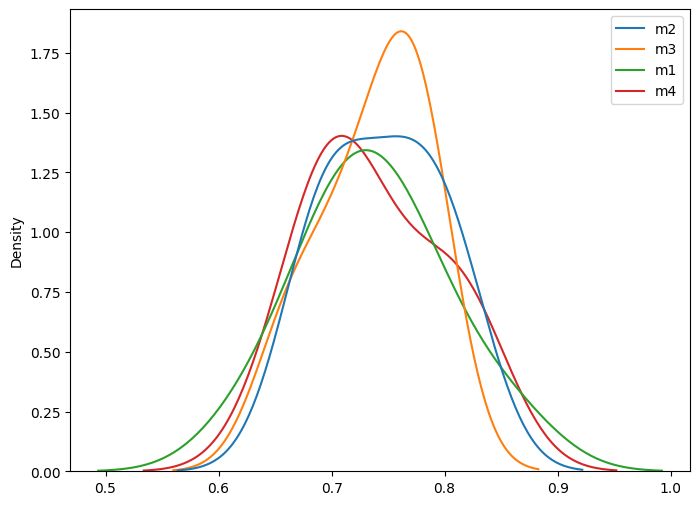

Friedman Test
FriedmanchisquareResult(statistic=2.7558139534883774, pvalue=0.43082547239545665)


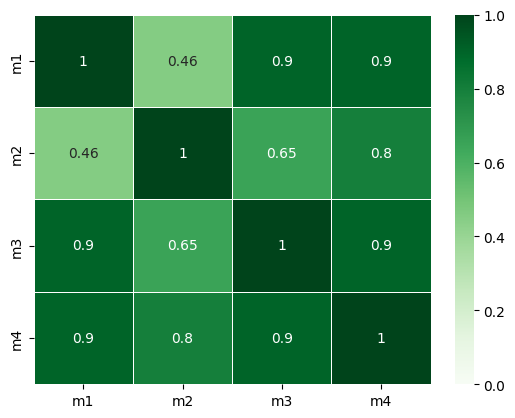

Friedman Test
FriedmanchisquareResult(statistic=2.7558139534883774, pvalue=0.43082547239545665)

Skater explaning...
Explaining M1...


2023-06-01 21:55:07,292 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 21:55:08,232 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 21:55:09,174 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 21:55:10,294 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/20 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/20 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/20 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/20 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


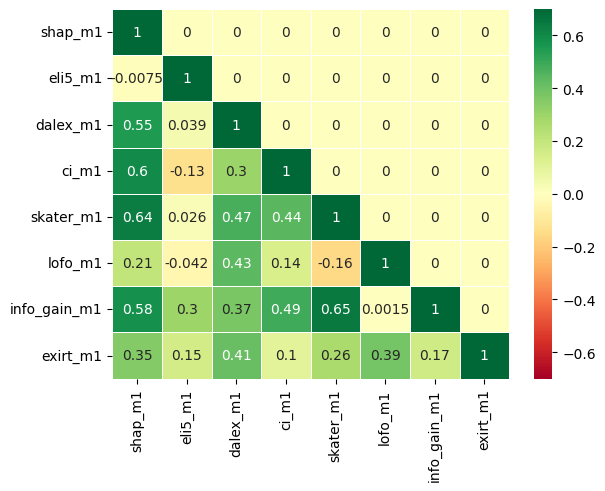

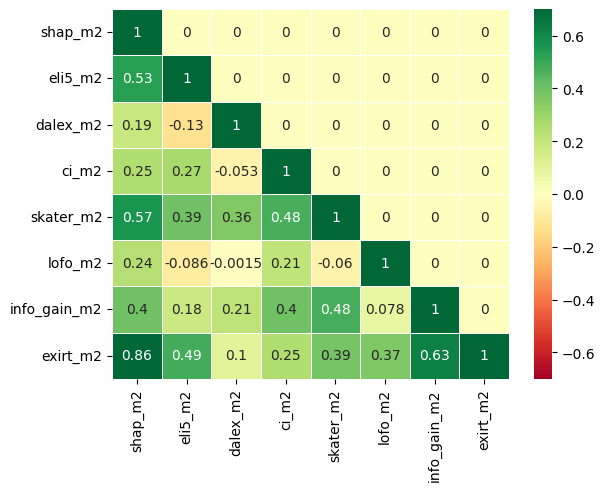

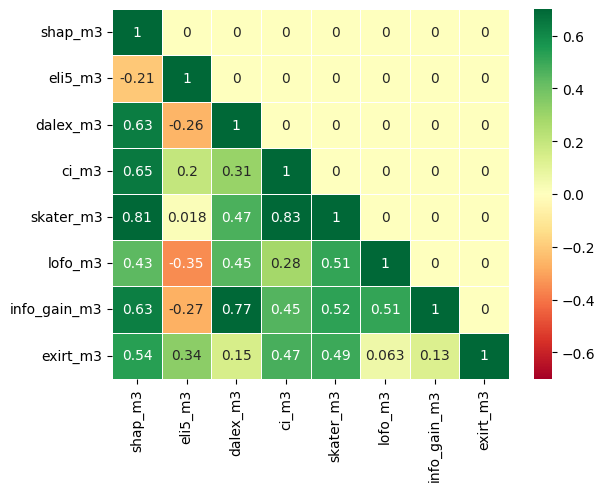

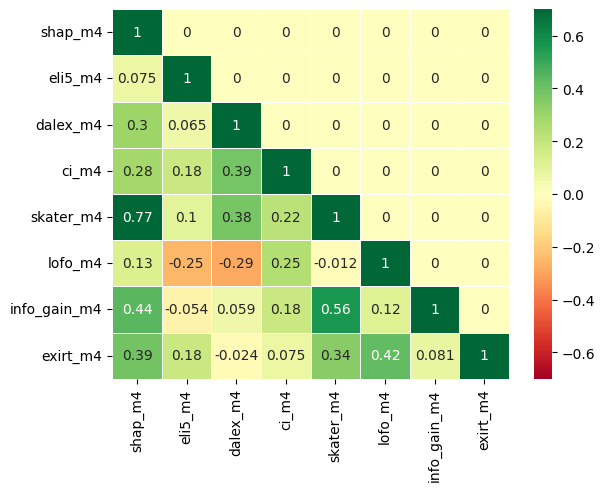

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: Australian
Version.......: 4
Format........: ARFF
Upload Date...: 2017-12-04 22:15:38
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/18151910/Australian.arff
OpenML URL....: https://www.openml.org/d/40981
# of features.: 15
# of instances: 690>
     A1     A2   A3  A4  A5  A6  A7  A8  A9  A10  A11  A12  A13  A14
0     0   65.0  168   0   0   0  39   0   0    1    0    0   32  161
1     1   72.0  123   0   1   0   5   0   0    1    1    0   53    1
2     1  142.0   52   1   0   0  31   0   0    1    0    0   98    1
3     1   60.0  169   1   2   1   1   1   1   12    0    0    1    1
4     0   44.0  134   0   3   0  46   1   1   15    1    0   18   68
..   ..    ...  ...  ..  ..  ..  ..  ..  ..  ...  ...  ...  ...  ...
685   0  163.0  160   0   7   0  99   1   0    1    1    0    1    1
686   0   49.0   14   0   1   0   4   0   0    1    1    0    1   35
687   1   32.0  145   0   3   0

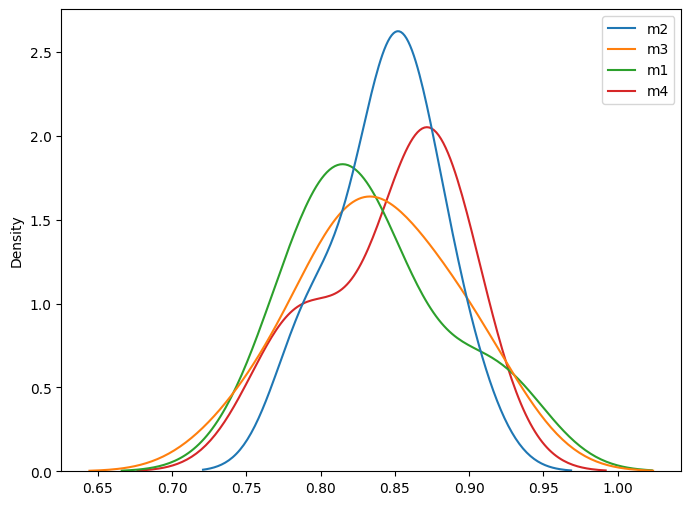

Friedman Test
FriedmanchisquareResult(statistic=0.8965517241379324, pvalue=0.8262598767639037)


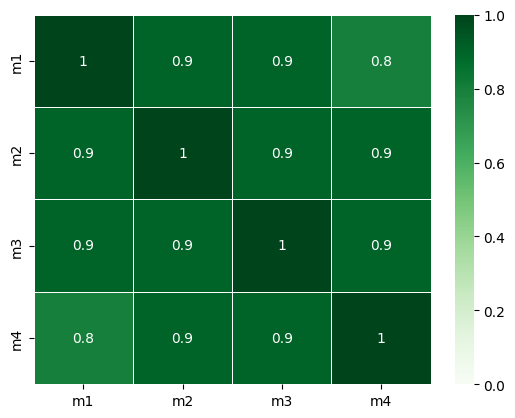

Friedman Test
FriedmanchisquareResult(statistic=0.8965517241379324, pvalue=0.8262598767639037)

Skater explaning...
Explaining M1...


2023-06-01 22:04:58,373 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 22:04:58,920 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 22:04:59,485 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 22:05:00,271 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/14 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/14 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/14 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/14 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


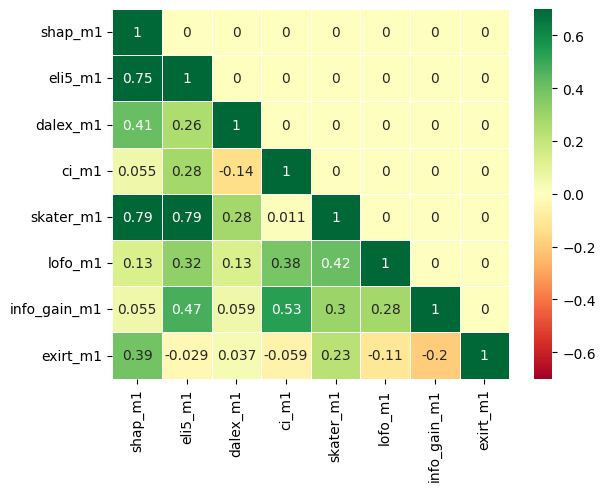

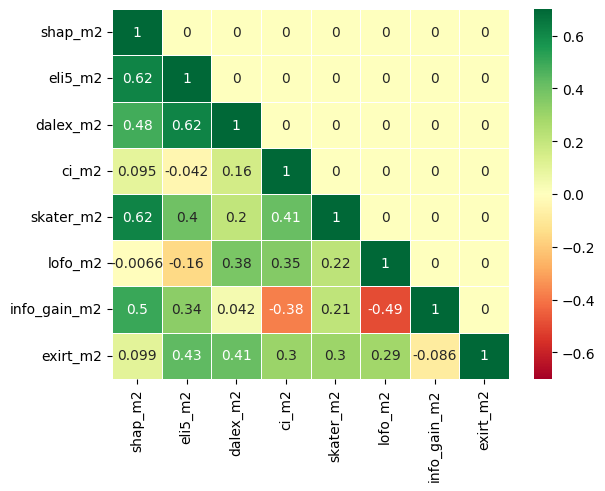

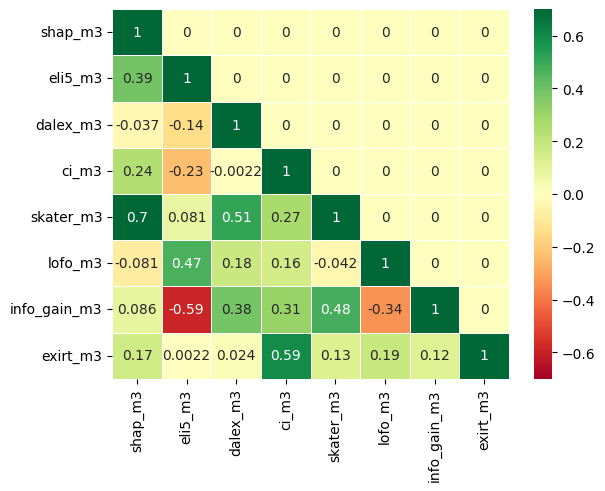

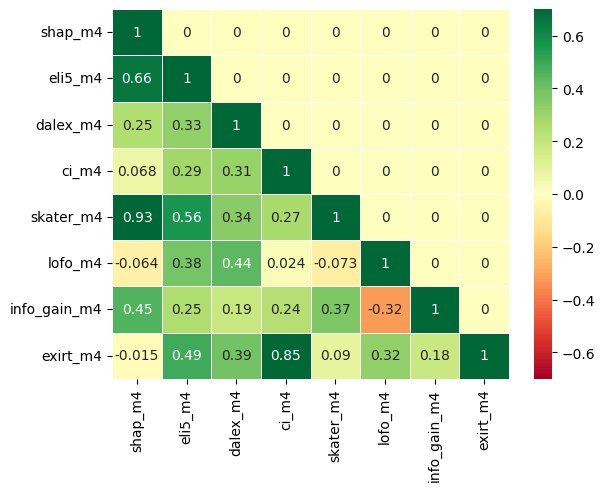

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: tic-tac-toe
Version.......: 1
Format........: ARFF
Upload Date...: 2014-04-06 23:22:59
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/50/tic-tac-toe.arff
OpenML URL....: https://www.openml.org/d/50
# of features.: 10
# of instances: 958>
     top-left-square  top-middle-square  top-right-square  middle-left-square  \
0                  0                  0                 0                   0   
1                  0                  0                 0                   0   
2                  0                  0                 0                   0   
3                  0                  0                 0                   0   
4                  0                  0                 0                   0   
..               ...                ...               ...                 ...   
953                1                  0                 0                   0   
954        

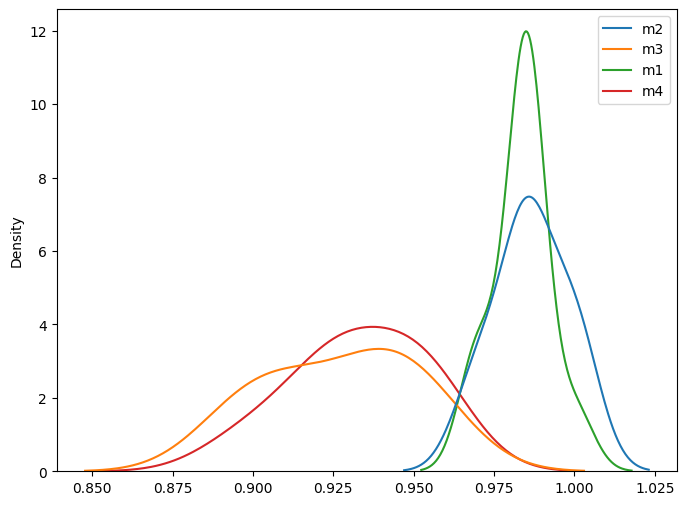

Friedman Test
FriedmanchisquareResult(statistic=26.800000000000004, pvalue=6.484009724005069e-06)


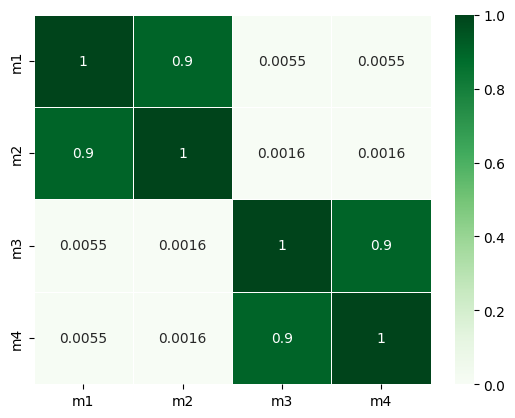

Friedman Test
FriedmanchisquareResult(statistic=26.800000000000004, pvalue=6.484009724005069e-06)

Skater explaning...
Explaining M1...


2023-06-01 22:09:10,646 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 22:09:11,029 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 22:09:11,402 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 22:09:11,873 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/9 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/9 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/9 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/9 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


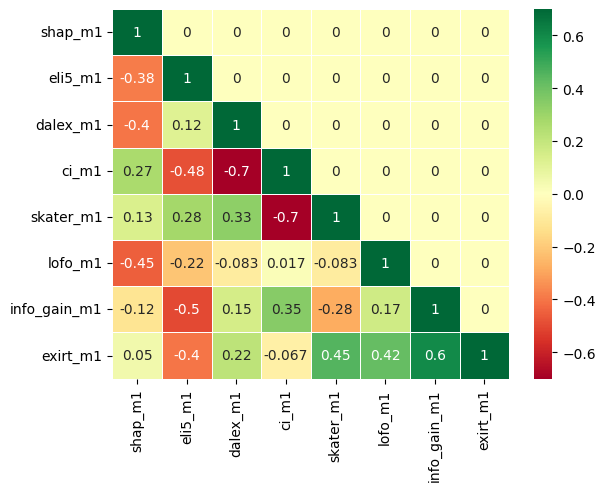

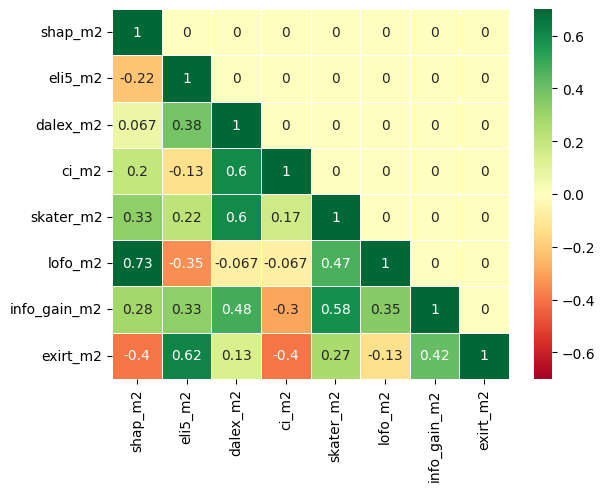

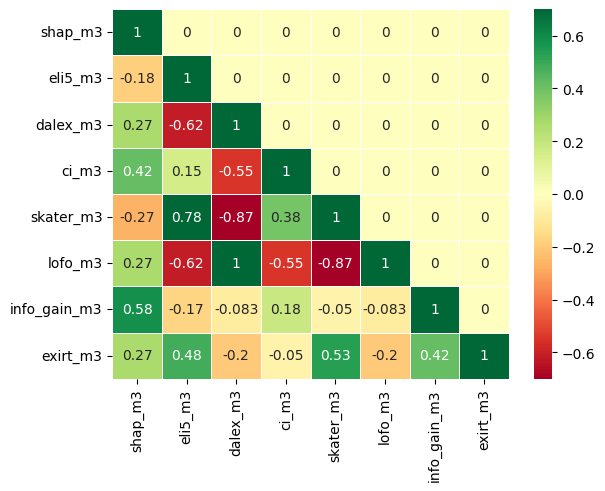

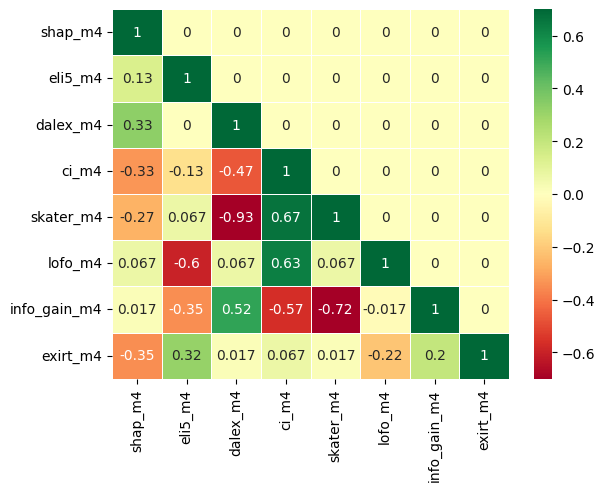

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: monks-problems-1
Version.......: 1
Format........: ARFF
Upload Date...: 2014-08-26 17:11:18
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/52236/monks-problems-1.arff
OpenML URL....: https://www.openml.org/d/333
# of features.: 7
# of instances: 556>
     attr1  attr2  attr3  attr4  attr5  attr6
0        1      1      1      1      3      1
1        1      1      1      1      3      2
2        1      1      1      3      2      1
3        1      1      1      3      3      2
4        1      1      2      1      2      1
..     ...    ...    ...    ...    ...    ...
551      3      3      2      3      2      2
552      3      3      2      3      3      1
553      3      3      2      3      3      2
554      3      3      2      3      4      1
555      3      3      2      3      4      2

[556 rows x 6 columns]
    attr1  attr2  attr3  attr4     attr5  attr6
0     0.0    0.0    0.

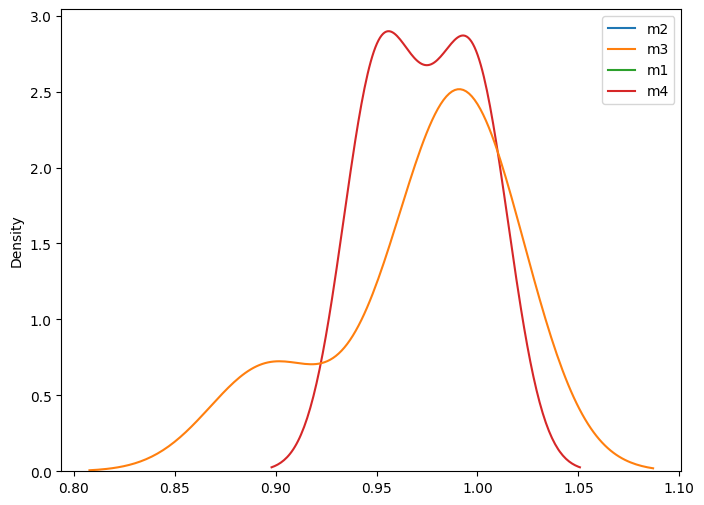

Friedman Test
FriedmanchisquareResult(statistic=12.964285714285698, pvalue=0.004714479633060424)


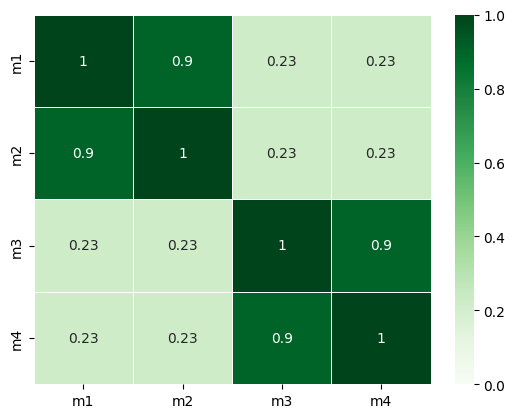

Friedman Test
FriedmanchisquareResult(statistic=12.964285714285698, pvalue=0.004714479633060424)

Skater explaning...
Explaining M1...


2023-06-01 22:14:35,054 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 22:14:35,296 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 22:14:35,544 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 22:14:35,830 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/6 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/6 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/6 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/6 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


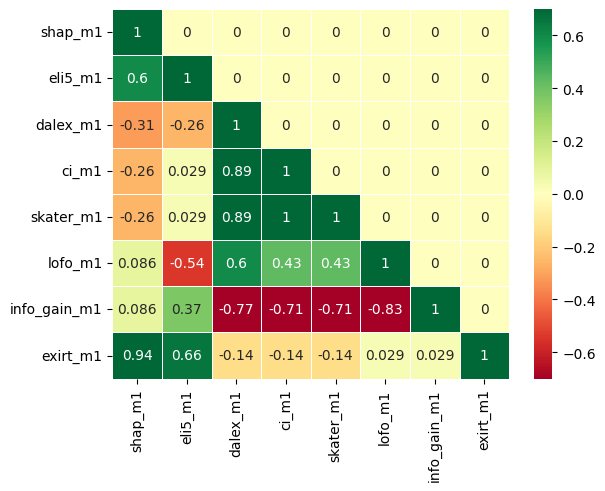

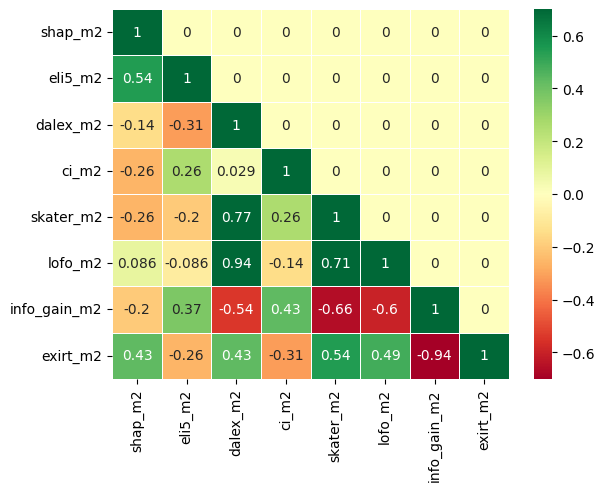

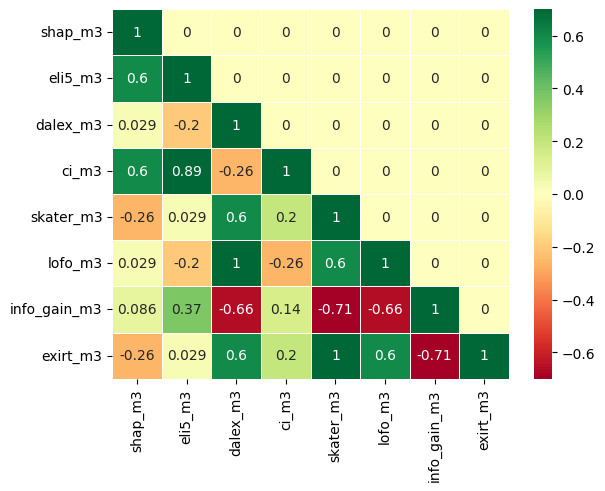

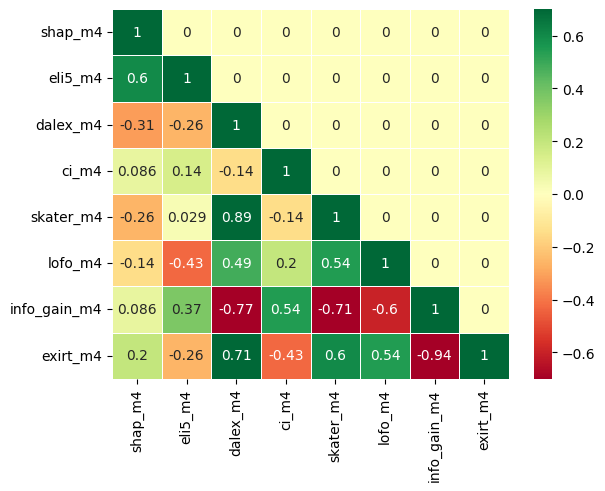

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: monks-problems-3
Version.......: 1
Format........: ARFF
Upload Date...: 2014-08-26 17:41:07
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/52238/monks-problems-3.arff
OpenML URL....: https://www.openml.org/d/335
# of features.: 7
# of instances: 554>
     attr1  attr2  attr3  attr4  attr5  attr6
0        0      0      0      0      0      0
1        0      0      0      0      1      1
2        0      0      0      0      1      0
3        0      0      0      0      2      1
4        0      0      0      0      1      1
..     ...    ...    ...    ...    ...    ...
549      2      2      1      2      1      0
550      2      2      1      2      2      1
551      2      2      1      2      2      0
552      2      2      1      2      1      1
553      2      2      1      2      1      0

[554 rows x 6 columns]
    attr1  attr2  attr3  attr4  attr5  attr6
0     0.0    0.0    0.0  

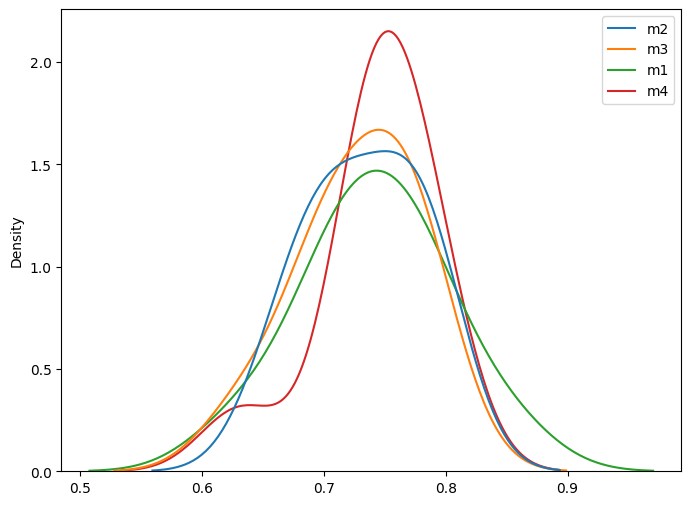

Friedman Test
FriedmanchisquareResult(statistic=2.2916666666666745, pvalue=0.5141192320239989)


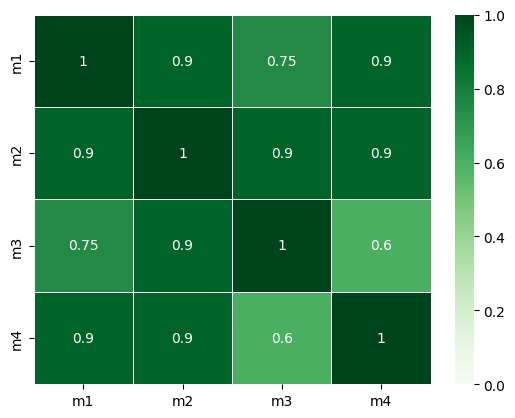

Friedman Test
FriedmanchisquareResult(statistic=2.2916666666666745, pvalue=0.5141192320239989)

Skater explaning...
Explaining M1...


2023-06-01 22:16:35,777 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 22:16:36,220 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 22:16:36,606 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 22:16:37,116 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/6 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/6 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/6 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/6 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


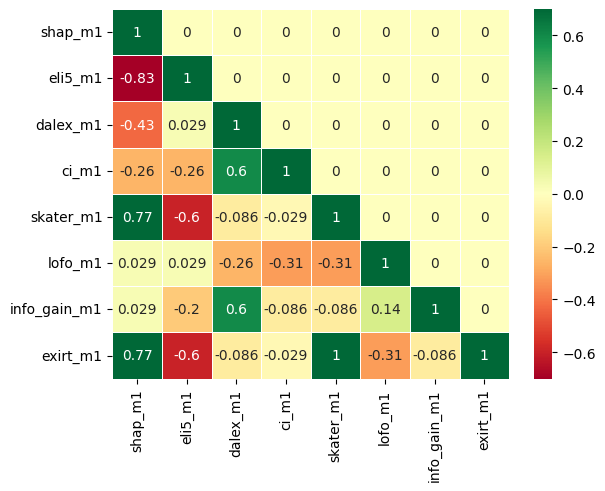

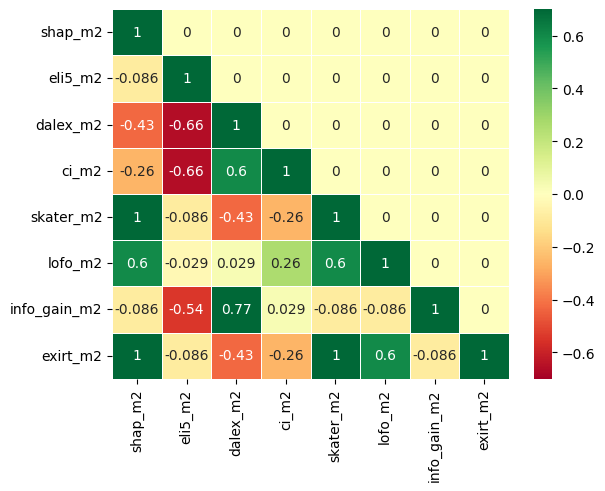

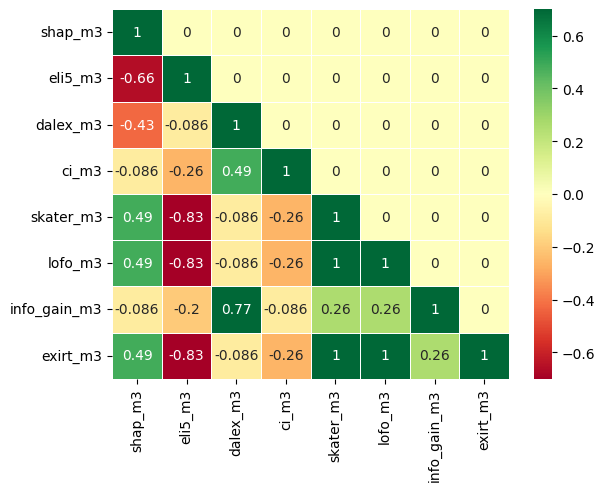

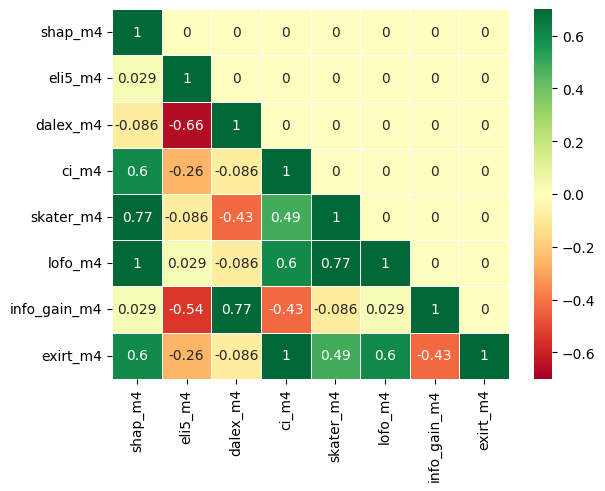

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: monks-problems-2
Version.......: 1
Format........: ARFF
Upload Date...: 2014-08-26 17:29:02
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/52237/monks-problems-2.arff
OpenML URL....: https://www.openml.org/d/334
# of features.: 7
# of instances: 601>
     attr1  attr2  attr3  attr4  attr5  attr6
0        1      1      1      1      2      2
1        1      1      1      1      4      1
2        1      1      1      2      1      1
3        1      1      1      2      1      2
4        1      1      1      2      2      1
..     ...    ...    ...    ...    ...    ...
596      3      3      2      3      2      2
597      3      3      2      3      3      1
598      3      3      2      3      3      2
599      3      3      2      3      4      1
600      3      3      2      3      4      2

[601 rows x 6 columns]
    attr1  attr2  attr3  attr4     attr5  attr6
0     0.0    0.0    0.

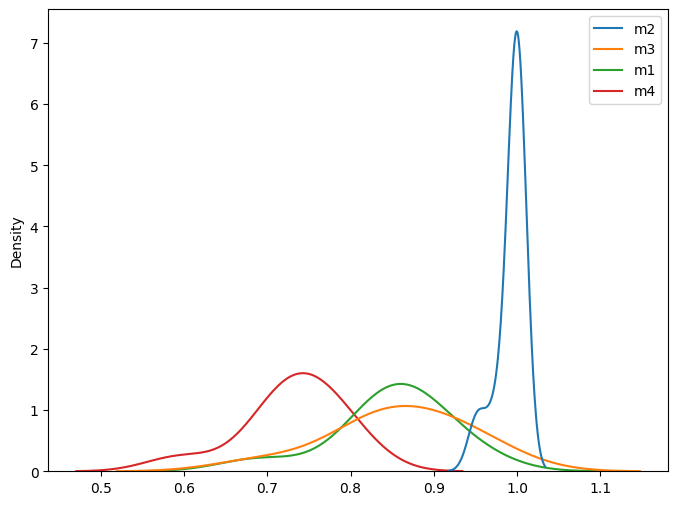

Friedman Test
FriedmanchisquareResult(statistic=27.8659793814433, pvalue=3.875057715704228e-06)


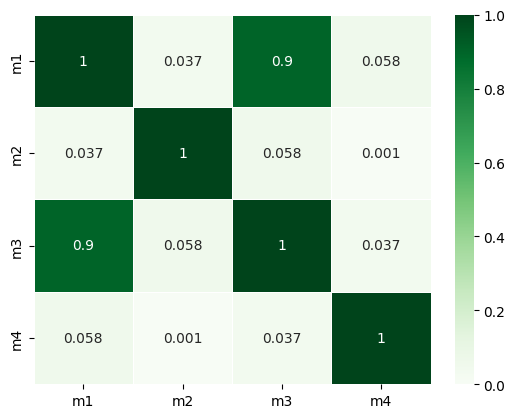

Friedman Test
FriedmanchisquareResult(statistic=27.8659793814433, pvalue=3.875057715704228e-06)

Skater explaning...
Explaining M1...


2023-06-01 22:18:44,209 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 22:18:44,458 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 22:18:44,710 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 22:18:45,011 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/6 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/6 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/6 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/6 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


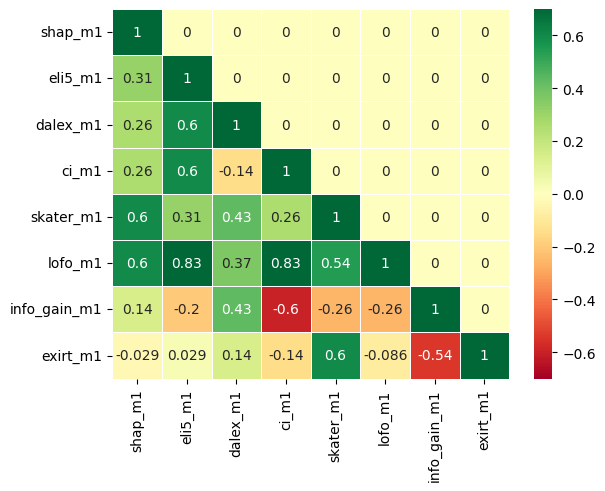

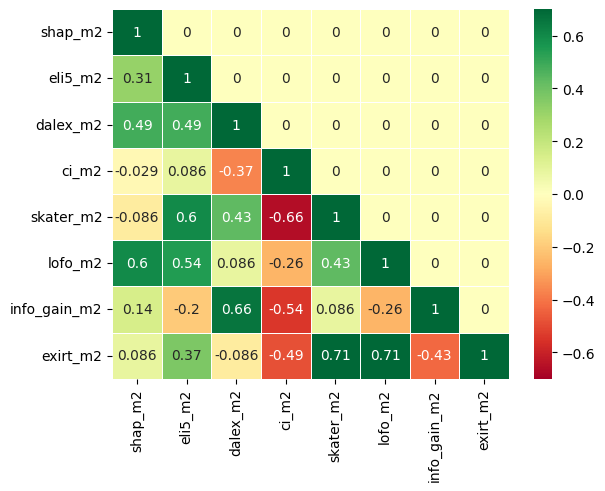

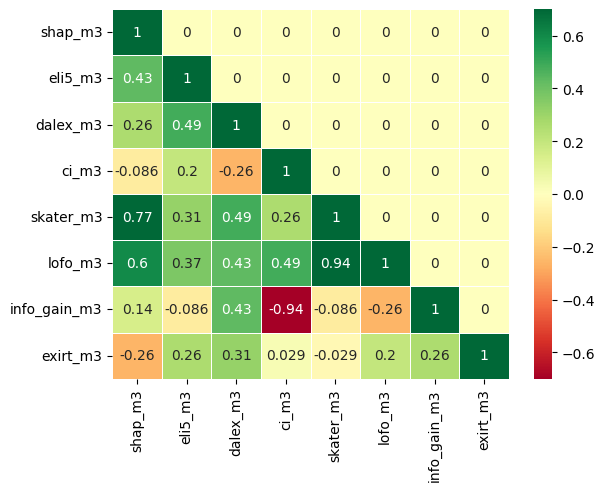

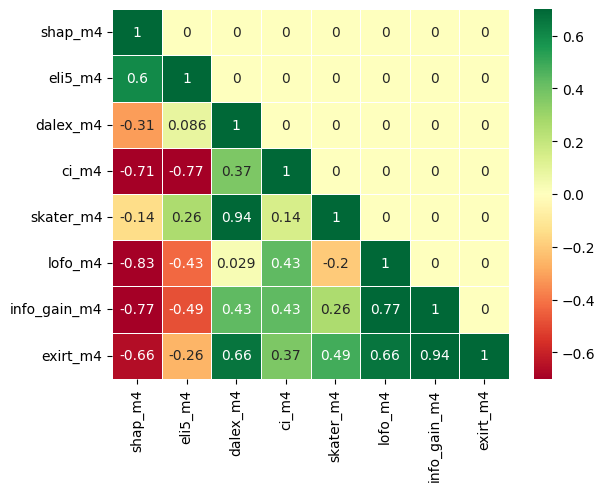

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: haberman
Version.......: 1
Format........: ARFF
Upload Date...: 2014-04-06 23:22:34
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/43/haberman.arff
OpenML URL....: https://www.openml.org/d/43
# of features.: 4
# of instances: 306>
     Age_of_patient_at_time_of_operation  Patients_year_of_operation  \
0                                     30                           0   
1                                     30                           1   
2                                     30                           2   
3                                     31                           3   
4                                     31                           2   
..                                   ...                         ...   
301                                   75                           1   
302                                   76                           6   
303               

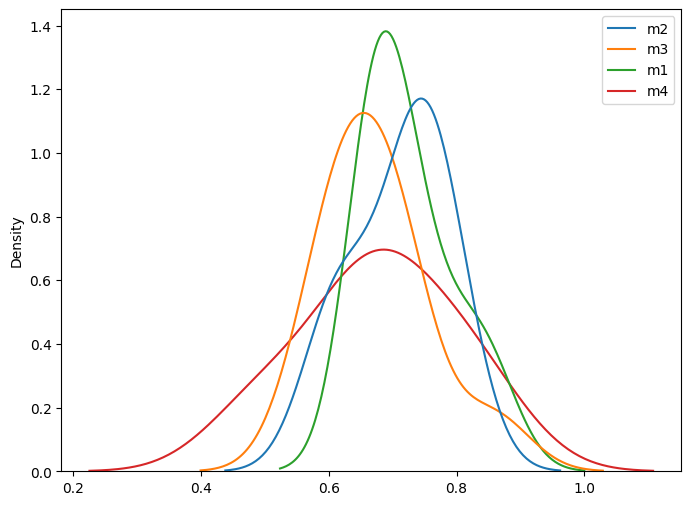

Friedman Test
FriedmanchisquareResult(statistic=4.220930232558135, pvalue=0.23857470858615906)


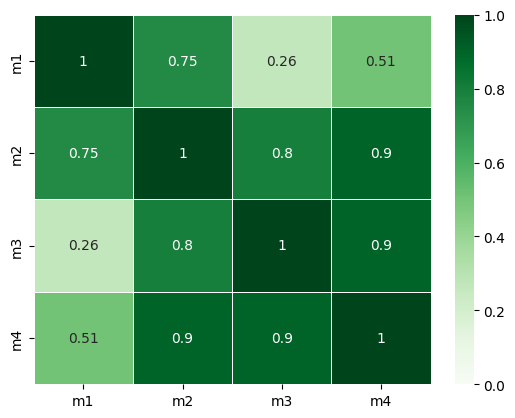

Friedman Test
FriedmanchisquareResult(statistic=4.220930232558135, pvalue=0.23857470858615906)

Skater explaning...
Explaining M1...


2023-06-01 22:21:02,185 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 22:21:02,358 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 22:21:02,543 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 22:21:02,737 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/3 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/3 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/3 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/3 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


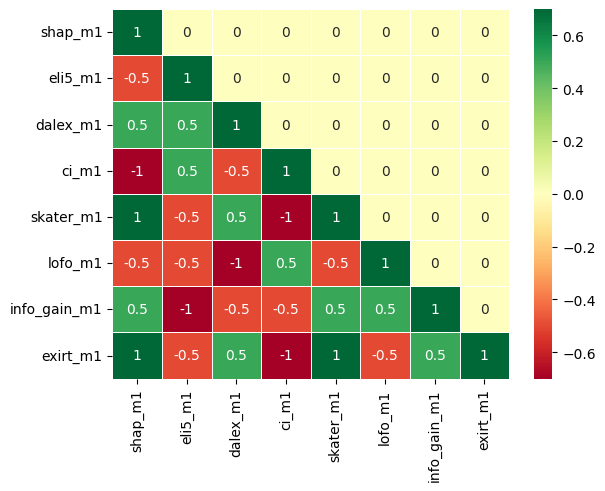

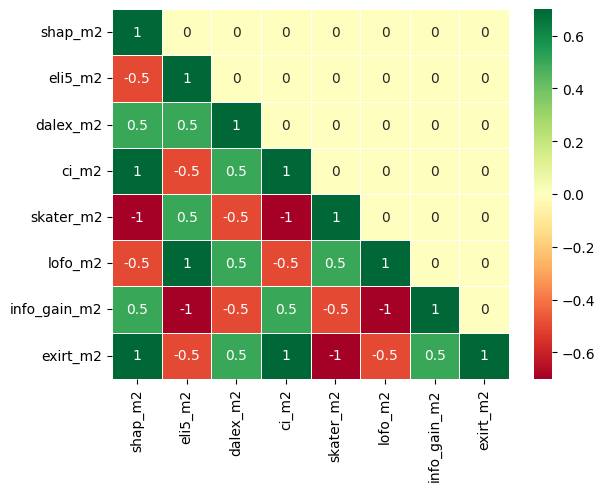

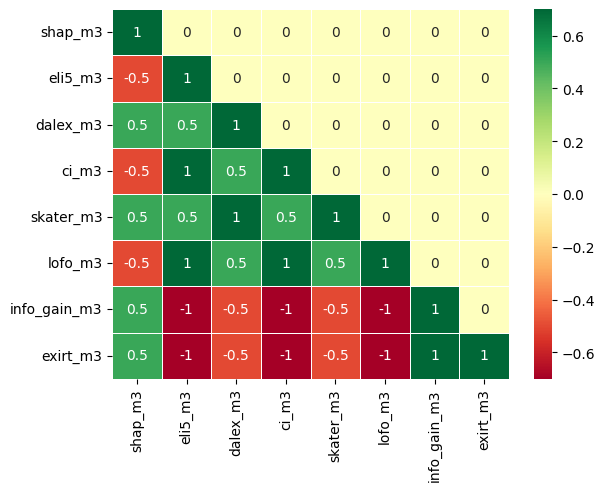

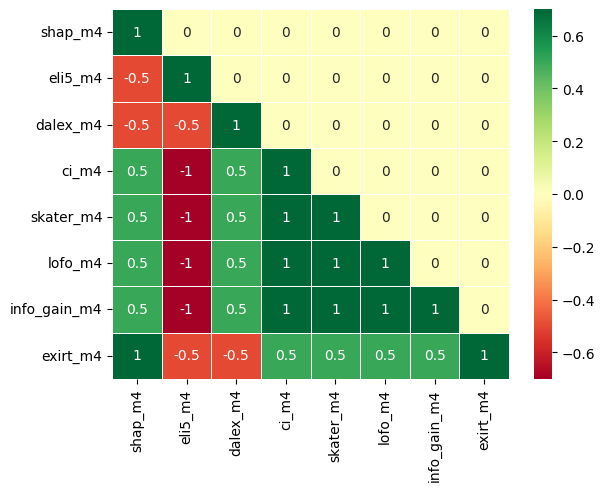

In [ ]:
cluster = 0

df_prop_tmp = df_dataset_properties.query(k_cluster_selected + ' == '+str(cluster))
list_dataset = list(df_dataset_properties.query(k_cluster_selected + ' == '+str(cluster)).index)
dfs_ret_0, df_dataset_properties_cluster_0, models_name_0, df_friedman_resume_0, df_accuracy_resume_0, df_precision_resume_0, df_recall_resume_0 = main_benchmark(list_dataset, df_prop_tmp,cluster_name=str(cluster))


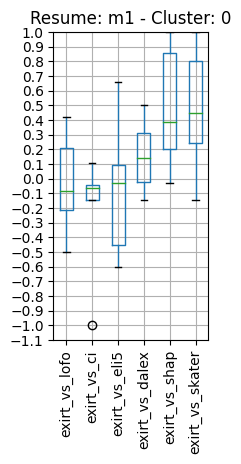

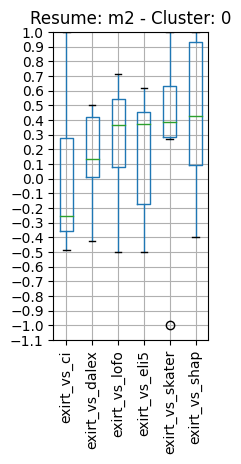

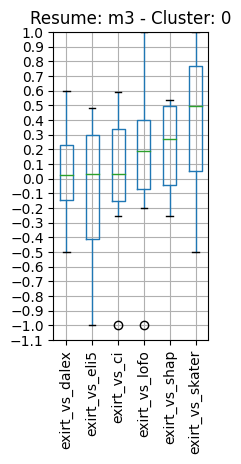

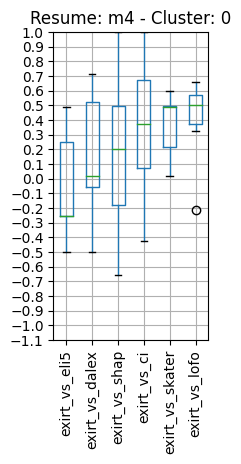

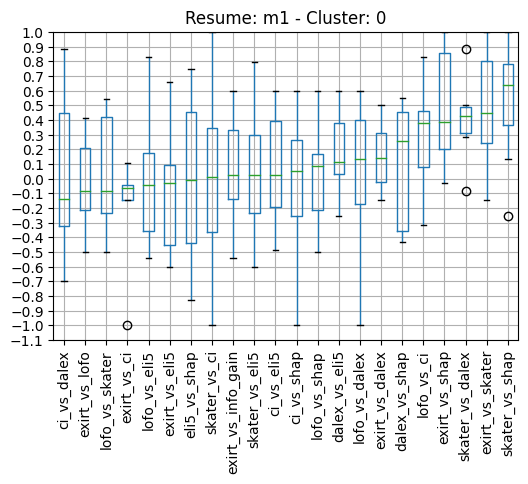

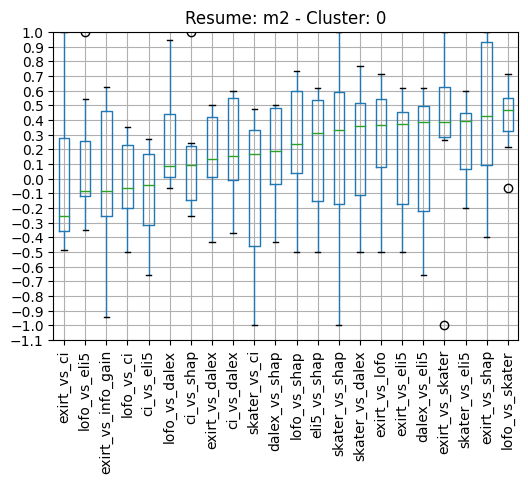

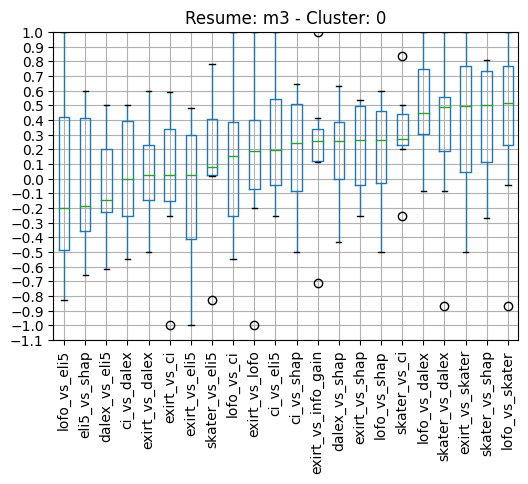

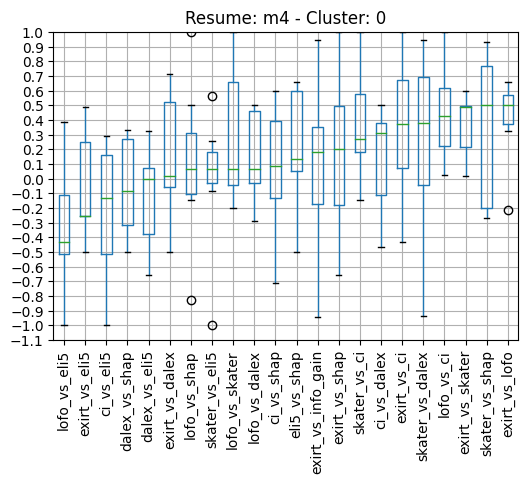

Text(0.5, 1.0, 'Resume of Recall - Cluster: 0')

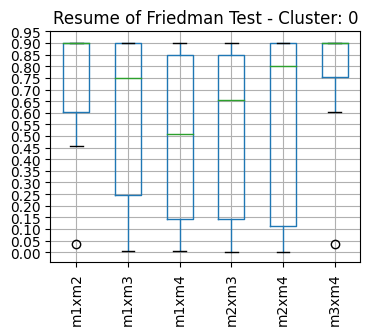

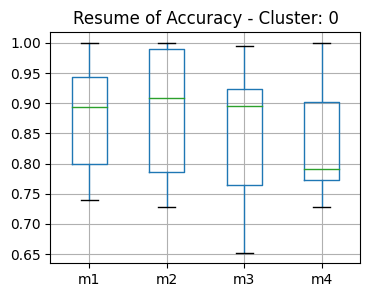

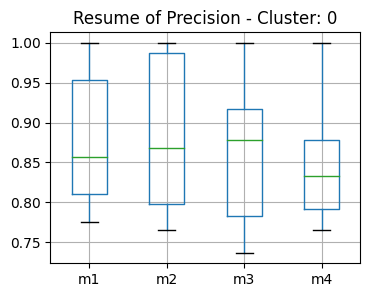

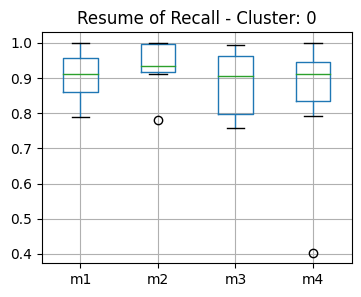

In [ ]:
plot_resume_eXirt(dfs_ret_0, df_dataset_properties_cluster_0, models_name_0, cluster)

plot_resume(dfs_ret_0, df_dataset_properties_cluster_0, models_name_0, cluster)

figure(figsize=(4,3), dpi=100)
axes = df_friedman_resume_0.boxplot(return_type = 'axes', rot=90)
plt.title('Resume of Friedman Test - Cluster: '+ str(cluster))
major_ticks = np.arange(0, 1, 0.05)
axes.set_yticks(major_ticks)
#axes.set_ylim(0, 1)

figure(figsize=(4,3), dpi=100)
axes = df_accuracy_resume_0.boxplot(return_type = 'axes')
plt.title('Resume of Accuracy - Cluster: '+ str(cluster))
#axes.set_ylim(0, 1)

figure(figsize=(4,3), dpi=100)
axes = df_precision_resume_0.boxplot(return_type = 'axes')
plt.title('Resume of Precision - Cluster: '+ str(cluster))
#axes.set_ylim(0, 1)

figure(figsize=(4,3), dpi=100)
axes = df_recall_resume_0.boxplot(return_type = 'axes')
plt.title('Resume of Recall - Cluster: '+ str(cluster))
#axes.set_ylim(0, 1)

In [ ]:
!zip -r '/content/workspace_cluster_'$cluster'.zip' /content
if do_download_workspace:
  files.download('/content/workspace_cluster_'+str(cluster)+'.zip')

  adding: content/ (stored 0%)
  adding: content/.config/ (stored 0%)
  adding: content/.config/configurations/ (stored 0%)
  adding: content/.config/configurations/config_default (deflated 15%)
  adding: content/.config/active_config (stored 0%)
  adding: content/.config/logs/ (stored 0%)
  adding: content/.config/logs/2023.05.31/ (stored 0%)
  adding: content/.config/logs/2023.05.31/13.44.53.488326.log (deflated 91%)
  adding: content/.config/logs/2023.05.31/13.46.25.325188.log (deflated 56%)
  adding: content/.config/logs/2023.05.31/13.45.46.962882.log (deflated 86%)
  adding: content/.config/logs/2023.05.31/13.45.55.608474.log (deflated 57%)
  adding: content/.config/logs/2023.05.31/13.46.24.421311.log (deflated 57%)
  adding: content/.config/logs/2023.05.31/13.45.18.951664.log (deflated 58%)
  adding: content/.config/gce (stored 0%)
  adding: content/.config/.last_update_check.json (deflated 22%)
  adding: content/.config/config_sentinel (stored 0%)
  adding: content/.config/.last

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Execute pipeline to cluster 1

In [ ]:
cluster = 1

df_prop_tmp = df_dataset_properties.query(k_cluster_selected + ' == '+str(cluster))
list_dataset = list(df_dataset_properties.query(k_cluster_selected + ' == '+str(cluster)).index)
dfs_ret_1, df_dataset_properties_cluster_1, models_name_1, df_friedman_resume_1, df_accuracy_resume_1, df_precision_resume_1, df_recall_resume_1 = main_benchmark(list_dataset, df_prop_tmp,cluster_name=str(cluster))


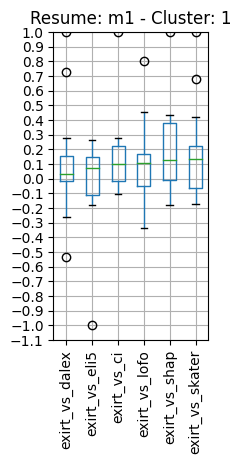

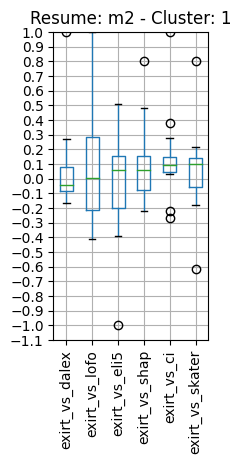

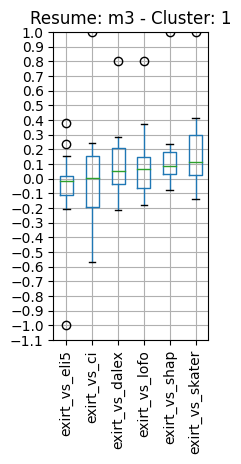

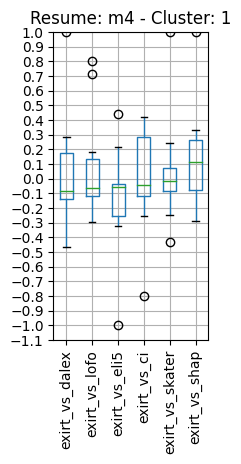

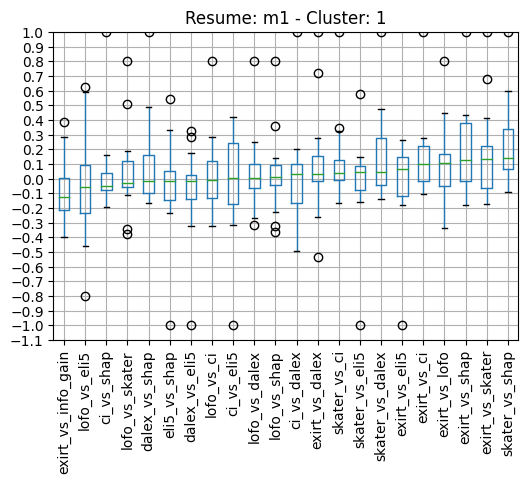

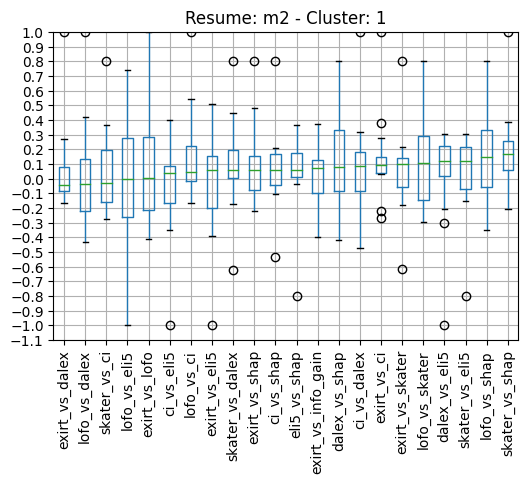

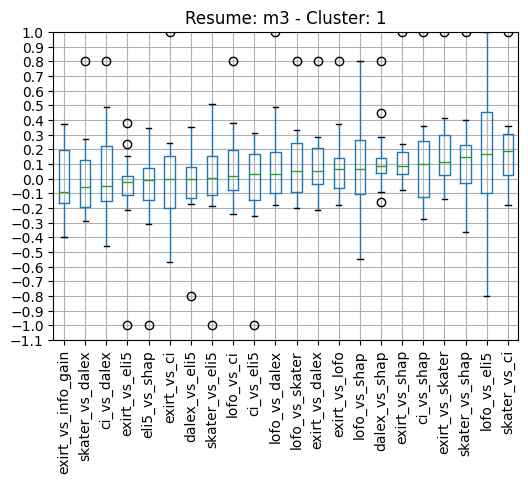

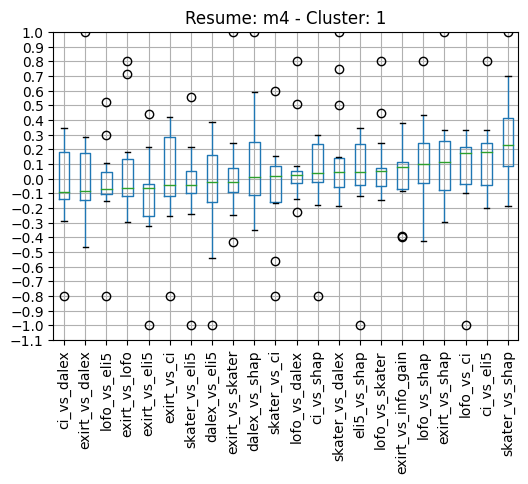

(0.0, 1.0)

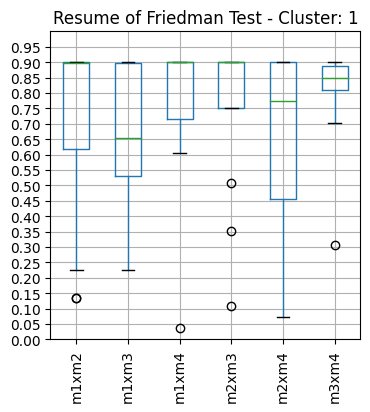

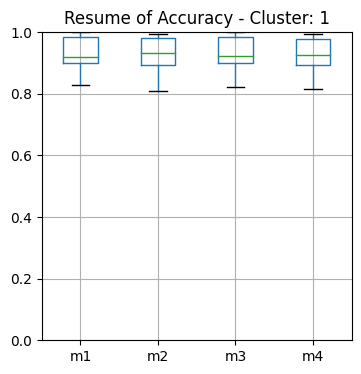

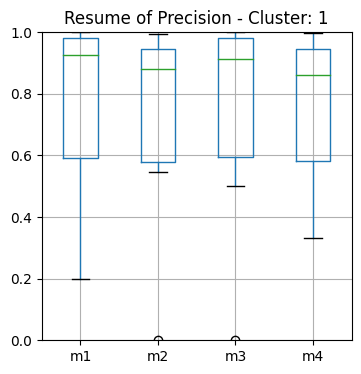

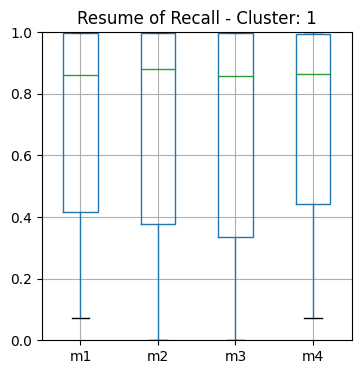

In [ ]:
df = plot_resume_eXirt(dfs_ret_1, df_dataset_properties_cluster_1, models_name_1, cluster)

df = plot_resume(dfs_ret_1, df_dataset_properties_cluster_1, models_name_1, cluster)

figure(figsize=(4,3), dpi=100)
axes = df_friedman_resume_1.boxplot(return_type = 'axes', rot=90)
plt.title('Resume of Friedman Test - Cluster: '+ str(cluster))
major_ticks = np.arange(0, 1, 0.05)
axes.set_yticks(major_ticks)
axes.set_ylim(0, 1)

figure(figsize=(4,3), dpi=100)
axes = df_accuracy_resume_1.boxplot(return_type = 'axes')
plt.title('Resume of Accuracy - Cluster: '+ str(cluster))
axes.set_ylim(0, 1)

figure(figsize=(4,3), dpi=100)
axes = df_precision_resume_1.boxplot(return_type = 'axes')
plt.title('Resume of Precision - Cluster: '+ str(cluster))
axes.set_ylim(0, 1)

figure(figsize=(4,3), dpi=100)
axes = df_recall_resume_1.boxplot(return_type = 'axes')
plt.title('Resume of Recall - Cluster: '+ str(cluster))
axes.set_ylim(0, 1)

In [ ]:
#df.plot.line(grid=True,figsize=(7,6),xticks=[1,2,3,4],yticks=np.arange(0, 1.1, step=0.05),ylim=(0,1.1),style='-o')

In [ ]:
!zip -r '/content/workspace_cluster_'$cluster'.zip' /content
if do_download_workspace:
  files.download('/content/workspace_cluster_'+str(cluster)+'.zip')

  adding: content/ (stored 0%)
  adding: content/.config/ (stored 0%)
  adding: content/.config/config_sentinel (stored 0%)
  adding: content/.config/configurations/ (stored 0%)
  adding: content/.config/configurations/config_default (deflated 15%)
  adding: content/.config/gce (stored 0%)
  adding: content/.config/.last_opt_in_prompt.yaml (stored 0%)
  adding: content/.config/active_config (stored 0%)
  adding: content/.config/.last_survey_prompt.yaml (stored 0%)
  adding: content/.config/.last_update_check.json (deflated 23%)
  adding: content/.config/logs/ (stored 0%)
  adding: content/.config/logs/2023.05.25/ (stored 0%)
  adding: content/.config/logs/2023.05.25/13.40.57.832685.log (deflated 91%)
  adding: content/.config/logs/2023.05.25/13.41.58.512075.log (deflated 58%)
  adding: content/.config/logs/2023.05.25/13.42.26.525543.log (deflated 56%)
  adding: content/.config/logs/2023.05.25/13.41.50.470207.log (deflated 86%)
  adding: content/.config/logs/2023.05.25/13.42.25.729591.l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Execute pipeline to cluster 2

## Execution of benchmark to: 
['kr-vs-kp', 'PhishingWebsites', 'SPECT']
<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: kr-vs-kp
Version.......: 1
Format........: ARFF
Upload Date...: 2014-04-06 23:19:28
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/3/kr-vs-kp.arff
OpenML URL....: https://www.openml.org/d/3
# of features.: 37
# of instances: 3196>
      bkblk  bknwy  bkon8  bkona  bkspr  bkxbq  bkxcr  bkxwp  blxwp  bxqsq  \
0         0      0      0      0      0      0      0      0      0      0   
1         0      0      0      0      1      0      0      0      0      0   
2         0      0      0      0      1      0      1      0      0      0   
3         0      0      0      0      0      0      0      0      1      0   
4         0      0      0      0      0      0      0      0      0      0   
...     ...    ...    ...    ...    ...    ...    ...    ...    ...    ...   
3191      1      0      0      0      0      0 

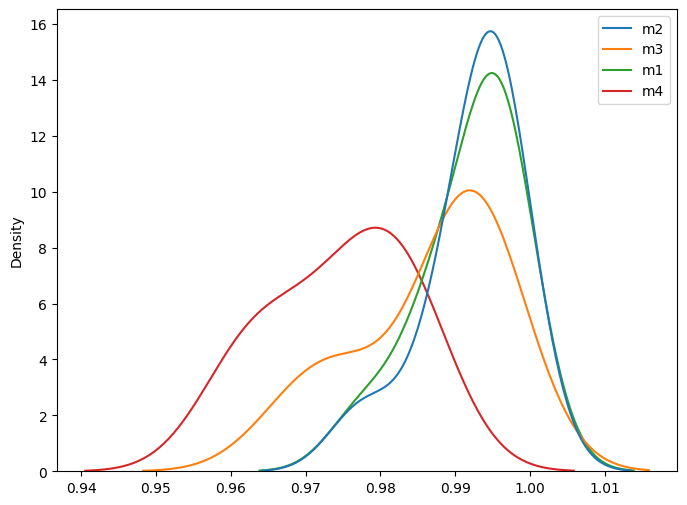

Friedman Test
FriedmanchisquareResult(statistic=22.213483146067396, pvalue=5.888796921984069e-05)


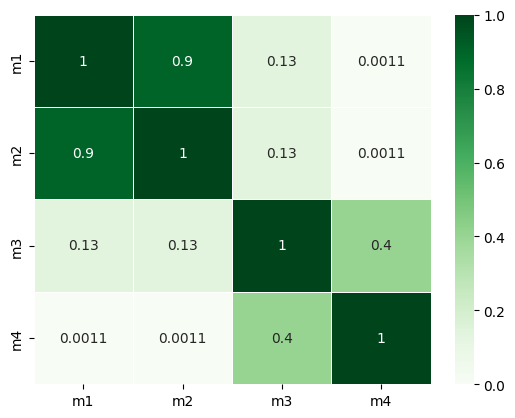

Friedman Test
FriedmanchisquareResult(statistic=22.213483146067396, pvalue=5.888796921984069e-05)

Skater explaning...
Explaining M1...


2023-05-31 14:23:56,076 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-05-31 14:23:58,642 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-05-31 14:24:01,357 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-05-31 14:24:04,544 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/36 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/36 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/36 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/36 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


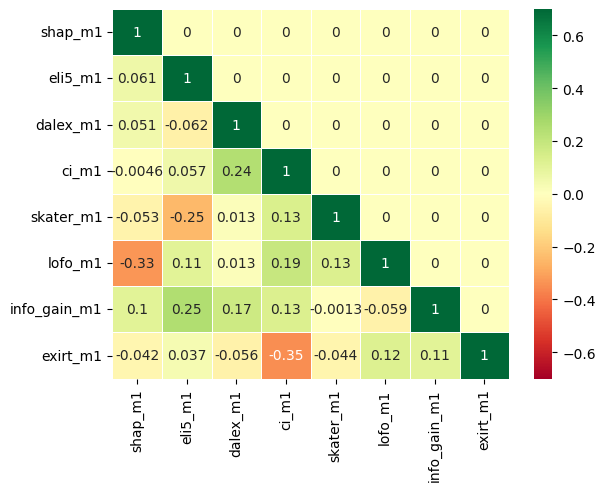

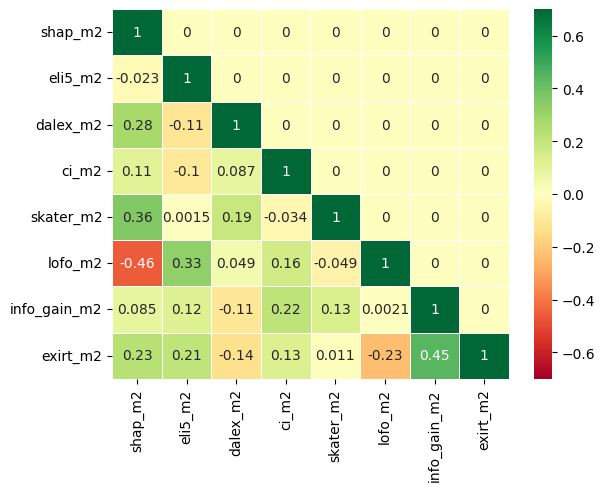

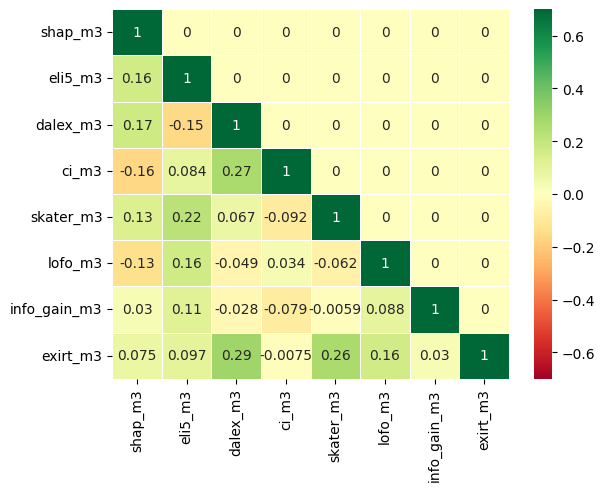

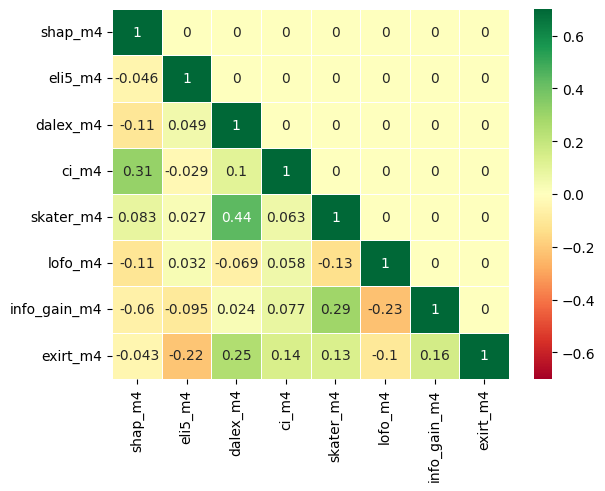

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: PhishingWebsites
Version.......: 1
Format........: ARFF
Upload Date...: 2016-02-16 15:30:33
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/1798106/PhishingWebsites.arff
OpenML URL....: https://www.openml.org/d/4534
# of features.: 31
# of instances: 11055>
       having_IP_Address  URL_Length  Shortining_Service  having_At_Symbol  \
0                      0           0                   0                 0   
1                      1           0                   0                 0   
2                      1           1                   0                 0   
3                      1           1                   0                 0   
4                      1           1                   1                 0   
...                  ...         ...                 ...               ...   
11050                  1           2                   0                 1   
11051           

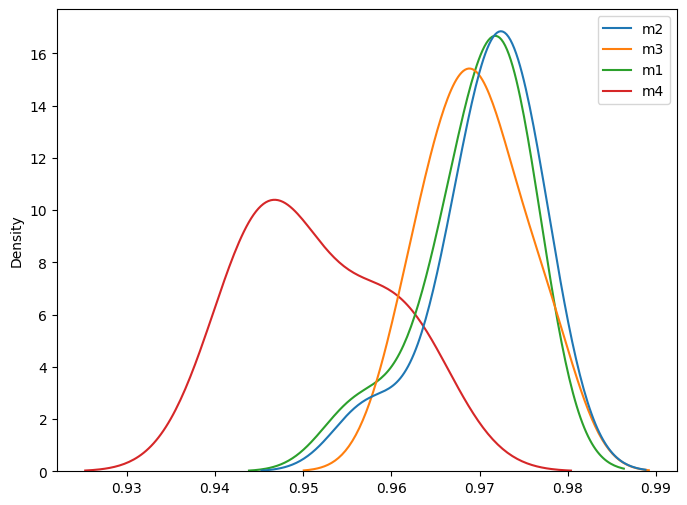

Friedman Test
FriedmanchisquareResult(statistic=19.363636363636353, pvalue=0.0002299200994906802)


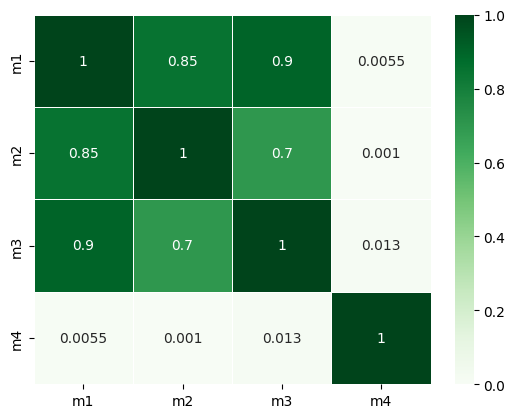

Friedman Test
FriedmanchisquareResult(statistic=19.363636363636353, pvalue=0.0002299200994906802)

Skater explaning...
Explaining M1...


2023-05-31 14:40:03,191 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-05-31 14:40:09,586 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-05-31 14:40:15,007 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-05-31 14:40:22,150 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/30 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/30 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/30 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/30 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


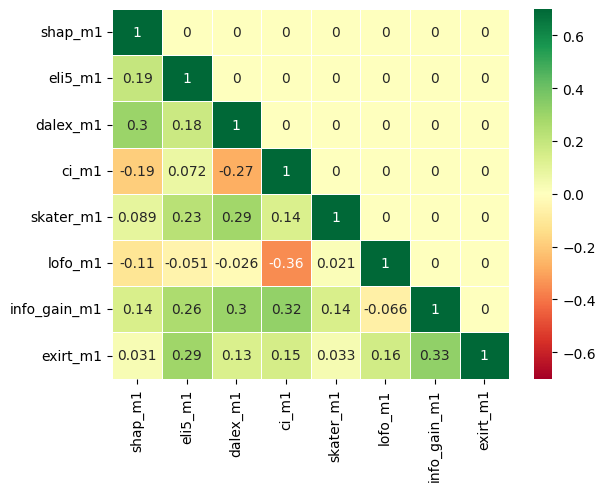

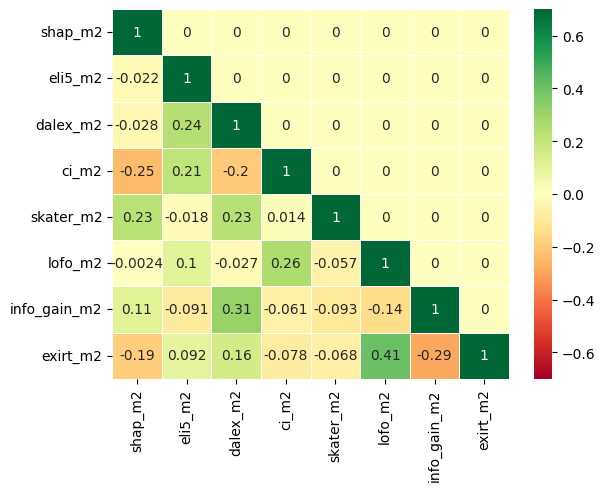

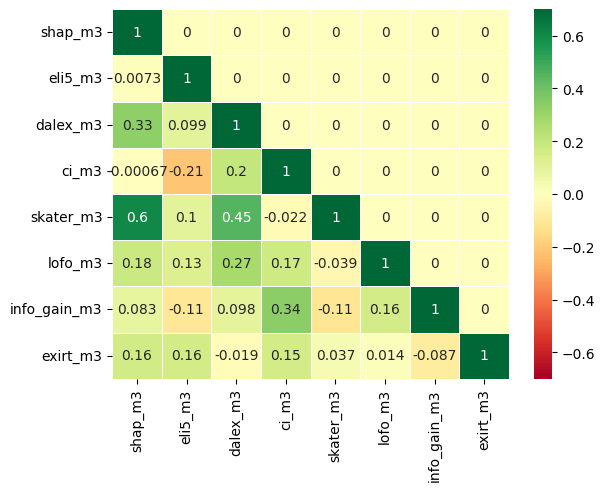

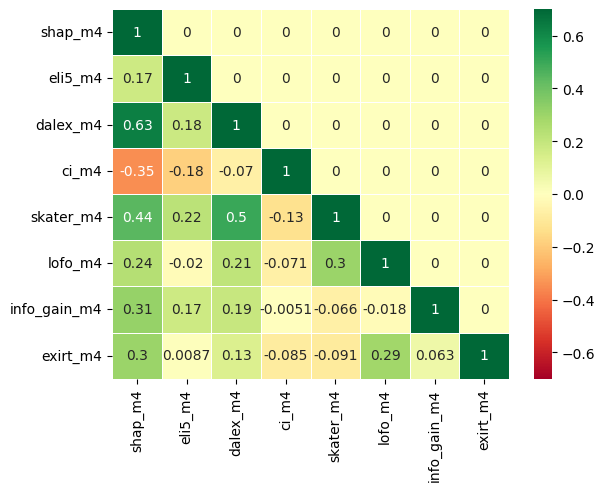

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: SPECT
Version.......: 1
Format........: ARFF
Upload Date...: 2014-08-26 17:57:57
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/52239/SPECT.arff
OpenML URL....: https://www.openml.org/d/336
# of features.: 23
# of instances: 267>
     F1  F2  F3  F4  F5  F6  F7  F8  F9  F10  ...  F13  F14  F15  F16  F17  \
0     0   0   0   0   0   0   0   0   0    0  ...    0    0    0    0    0   
1     0   0   1   0   0   0   0   0   0    0  ...    0    0    0    0    0   
2     1   0   1   1   1   0   0   0   1    1  ...    0    1    0    0    0   
3     0   0   0   1   0   0   0   1   1    0  ...    1    1    0    0    0   
4     0   0   0   1   0   0   0   0   1    0  ...    0    1    1    1    0   
..   ..  ..  ..  ..  ..  ..  ..  ..  ..  ...  ...  ...  ...  ...  ...  ...   
262   0   0   0   1   0   0   0   1   1    0  ...    1    1    0    0    0   
263   1   1   0   1   0   1   0   1   1    

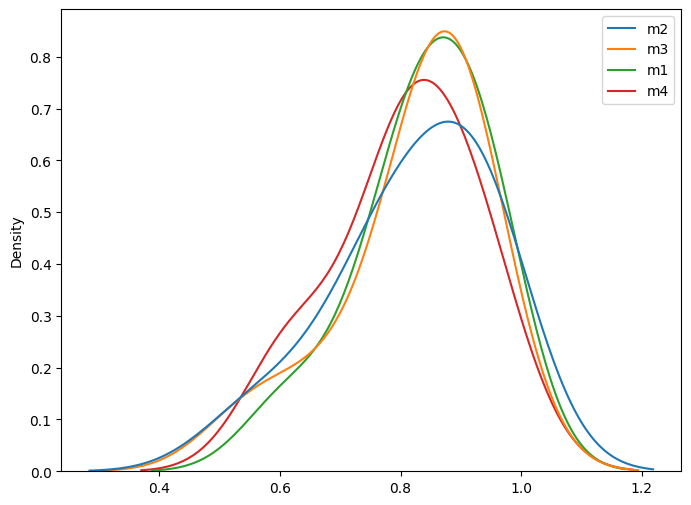

Friedman Test
FriedmanchisquareResult(statistic=4.549999999999983, pvalue=0.20787352680925067)


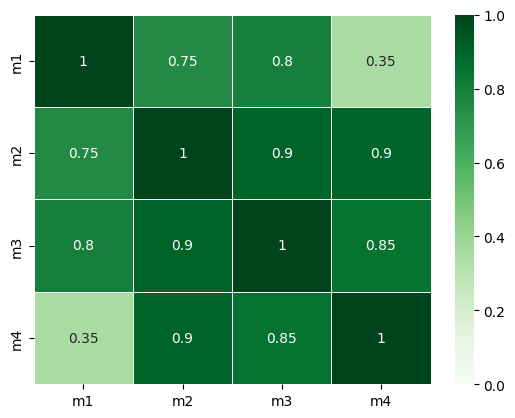

Friedman Test
FriedmanchisquareResult(statistic=4.549999999999983, pvalue=0.20787352680925067)

Skater explaning...
Explaining M1...


2023-05-31 14:58:13,185 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-05-31 14:58:13,826 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-05-31 14:58:14,450 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-05-31 14:58:15,253 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/22 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/22 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/22 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/22 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


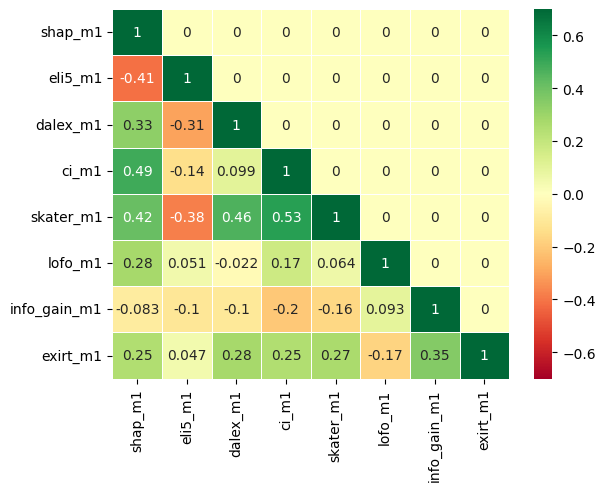

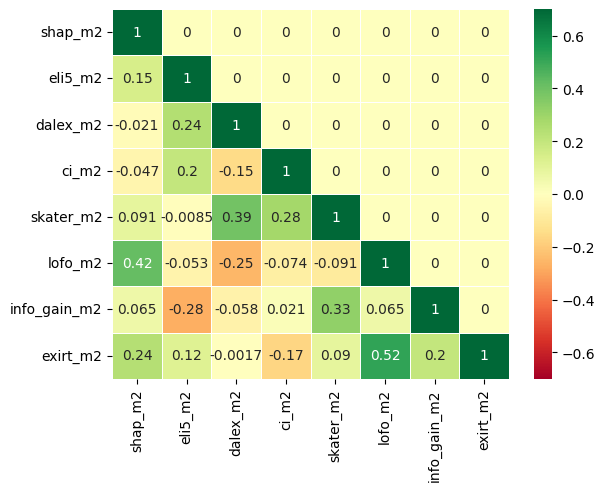

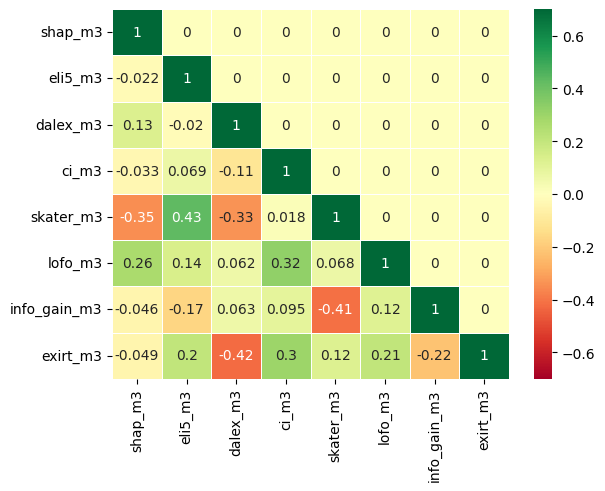

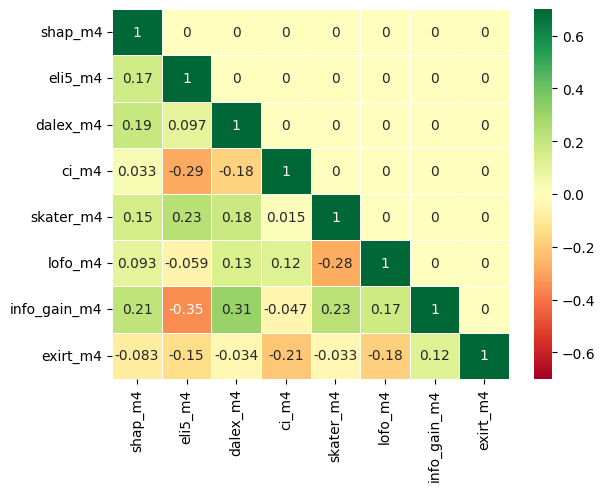

In [ ]:
cluster = 2

df_prop_tmp = df_dataset_properties.query(k_cluster_selected + ' == '+str(cluster))
list_dataset = list(df_dataset_properties.query(k_cluster_selected + ' == '+str(cluster)).index)
dfs_ret_2, df_dataset_properties_cluster_2, models_name_2, df_friedman_resume_2, df_accuracy_resume_2, df_precision_resume_2, df_recall_resume_2 = main_benchmark(list_dataset, df_prop_tmp,cluster_name=str(cluster))

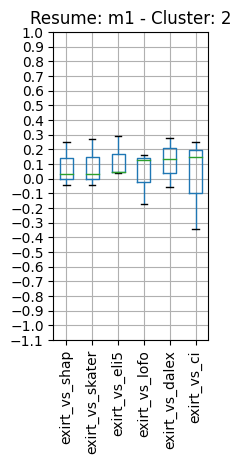

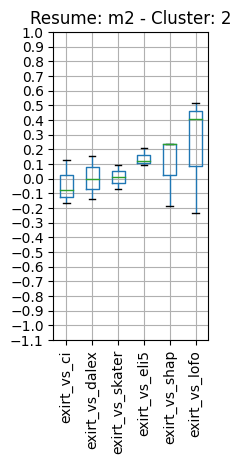

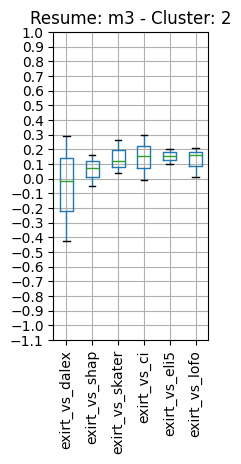

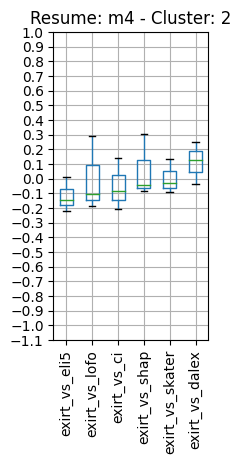

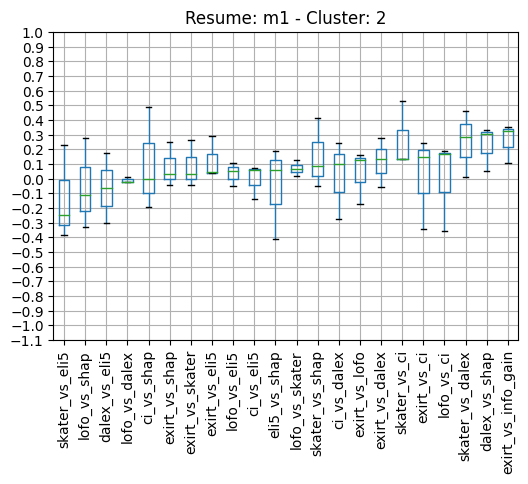

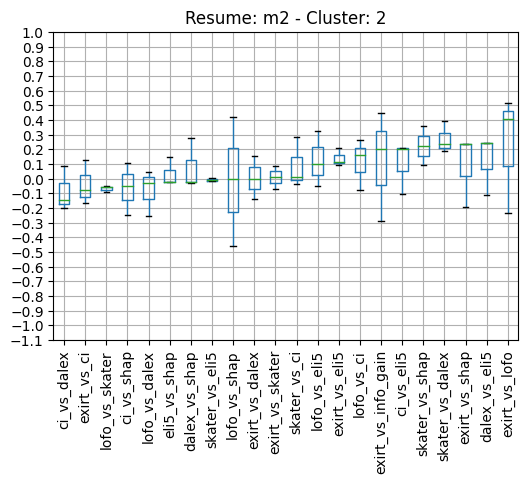

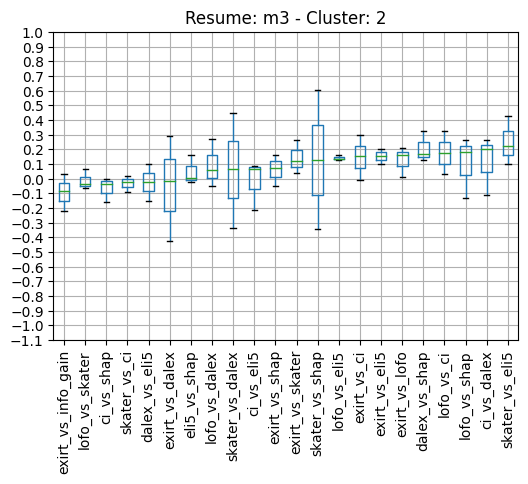

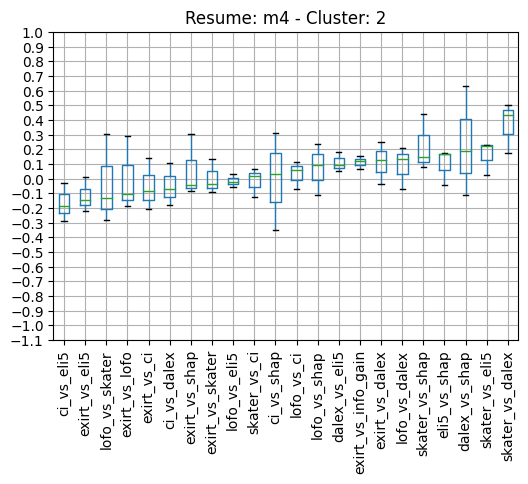

(0.0, 1.0)

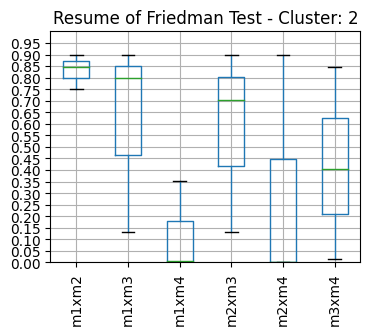

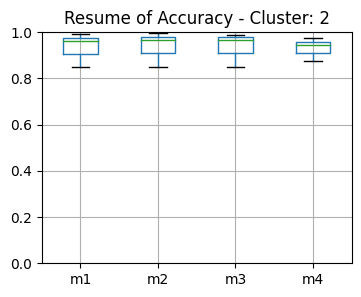

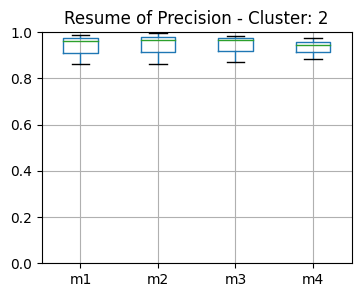

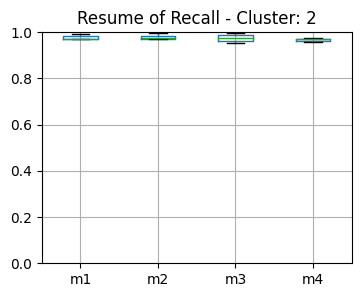

In [ ]:
plot_resume_eXirt(dfs_ret_2, df_dataset_properties_cluster_2, models_name_2, cluster)

plot_resume(dfs_ret_2, df_dataset_properties_cluster_2, models_name_2, cluster)


figure(figsize=(4, 3), dpi=100)
axes = df_friedman_resume_2.boxplot(return_type = 'axes',rot=90)
plt.title('Resume of Friedman Test - Cluster: '+ str(cluster))
major_ticks = np.arange(0, 1, 0.05)
axes.set_yticks(major_ticks)
axes.set_ylim(0, 1)

figure(figsize=(4,3), dpi=100)
axes = df_accuracy_resume_2.boxplot(return_type = 'axes')
plt.title('Resume of Accuracy - Cluster: '+ str(cluster))
axes.set_ylim(0, 1)

figure(figsize=(4,3), dpi=100)
axes = df_precision_resume_2.boxplot(return_type = 'axes')
plt.title('Resume of Precision - Cluster: '+ str(cluster))
axes.set_ylim(0, 1)

figure(figsize=(4,3), dpi=100)
axes = df_recall_resume_2.boxplot(return_type = 'axes')
plt.title('Resume of Recall - Cluster: '+ str(cluster))
axes.set_ylim(0, 1)

In [ ]:
!zip -r '/content/workspace_cluster_'$cluster'.zip' /content
if do_download_workspace:
  files.download('/content/workspace_cluster_'+str(cluster)+'.zip')

  adding: content/ (stored 0%)
  adding: content/.config/ (stored 0%)
  adding: content/.config/logs/ (stored 0%)
  adding: content/.config/logs/2023.05.26/ (stored 0%)
  adding: content/.config/logs/2023.05.26/13.47.20.430721.log (deflated 86%)
  adding: content/.config/logs/2023.05.26/13.47.55.044066.log (deflated 57%)
  adding: content/.config/logs/2023.05.26/13.47.55.757168.log (deflated 56%)
  adding: content/.config/logs/2023.05.26/13.46.55.291565.log (deflated 58%)
  adding: content/.config/logs/2023.05.26/13.46.28.642850.log (deflated 91%)
  adding: content/.config/logs/2023.05.26/13.47.28.632090.log (deflated 58%)
  adding: content/.config/.last_opt_in_prompt.yaml (stored 0%)
  adding: content/.config/config_sentinel (stored 0%)
  adding: content/.config/gce (stored 0%)
  adding: content/.config/.last_survey_prompt.yaml (stored 0%)
  adding: content/.config/active_config (stored 0%)
  adding: content/.config/.last_update_check.json (deflated 23%)
  adding: content/.config/conf

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Execute pipeline to cluster 3

## Execution of benchmark to: 
['sonar', 'spambase', 'qsar-biodeg', 'ionosphere', 'steel-plates-fault', 'wdbc', 'eeg-eye-state', 'heart-statlog', 'ilpd', 'jEdit_4.0_4.2', 'diabetes', 'prnn_crabs', 'delta_ailerons', 'mozilla4', 'phoneme', 'blood-transfusion-service-center', 'banknote-authentication']
<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: sonar
Version.......: 1
Format........: ARFF
Upload Date...: 2014-04-06 23:22:24
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/40/sonar.arff
OpenML URL....: https://www.openml.org/d/40
# of features.: 61
# of instances: 208>
All numeric
     attribute_1  attribute_2  attribute_3  attribute_4  attribute_5  \
0         0.0200       0.0371       0.0428       0.0207       0.0954   
1         0.0453       0.0523       0.0843       0.0689       0.1183   
2         0.0262       0.0582       0.1099       0.1083       0.0974   
3         0.0100       0.0171       0.0623       0.0205       0.0205  

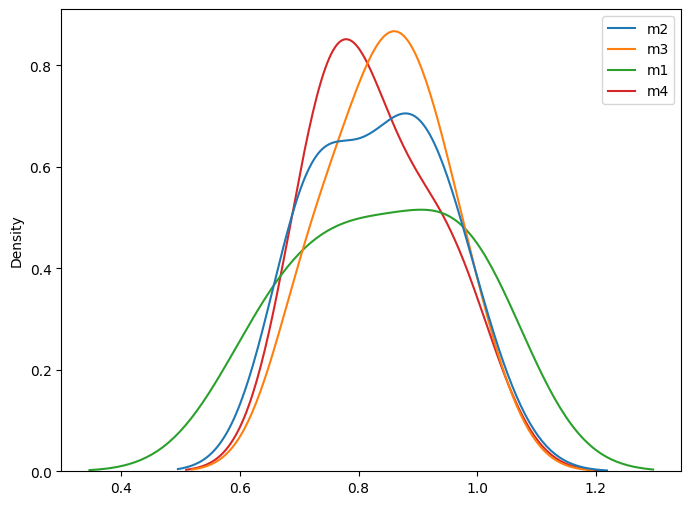

Friedman Test
FriedmanchisquareResult(statistic=0.7377049180327683, pvalue=0.8643015469276881)


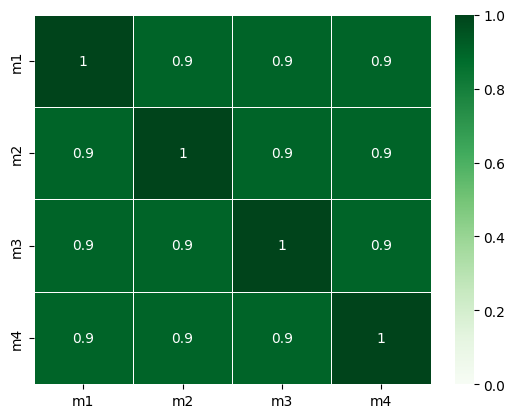

Friedman Test
FriedmanchisquareResult(statistic=0.7377049180327683, pvalue=0.8643015469276881)

Skater explaning...
Explaining M1...


2023-06-01 16:52:34,294 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 16:52:40,222 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 16:52:44,635 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 16:52:50,540 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/60 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/60 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/60 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/60 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


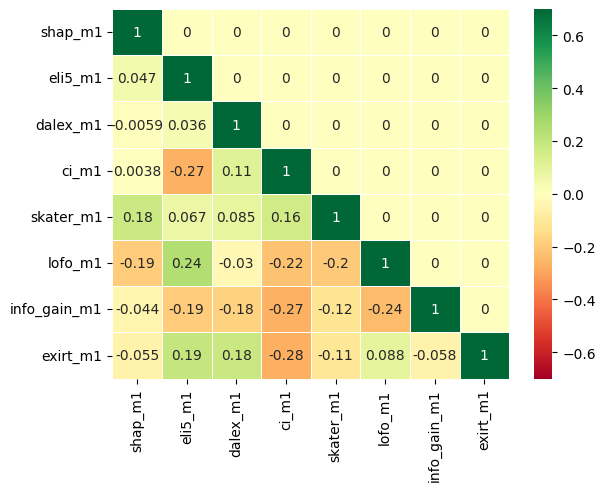

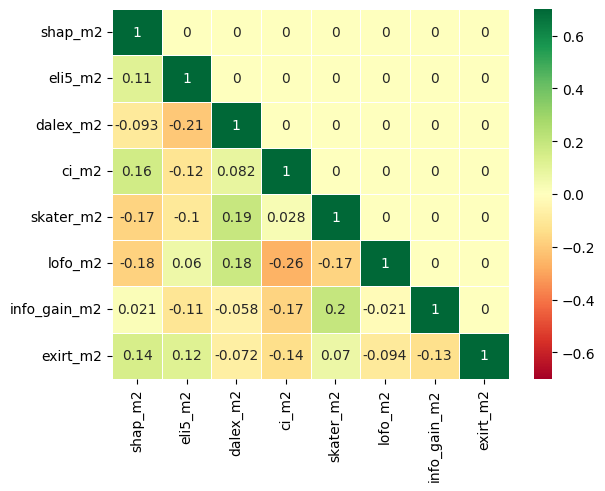

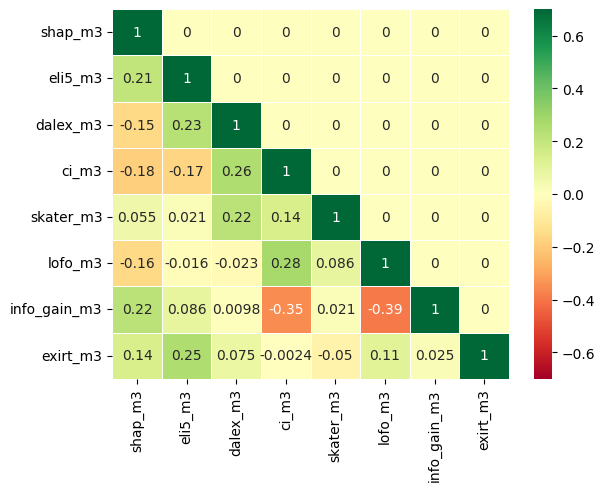

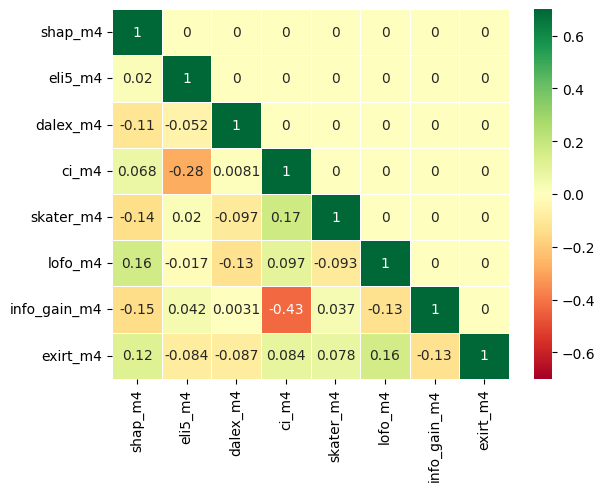

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: spambase
Version.......: 1
Format........: ARFF
Upload Date...: 2014-04-06 23:22:41
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/44/spambase.arff
OpenML URL....: https://www.openml.org/d/44
# of features.: 58
# of instances: 4601>
All numeric
      word_freq_make  word_freq_address  word_freq_all  word_freq_3d  \
0               0.00               0.64           0.64           0.0   
1               0.21               0.28           0.50           0.0   
2               0.06               0.00           0.71           0.0   
3               0.00               0.00           0.00           0.0   
4               0.00               0.00           0.00           0.0   
...              ...                ...            ...           ...   
4596            0.31               0.00           0.62           0.0   
4597            0.00               0.00           0.00           0.0   
4598

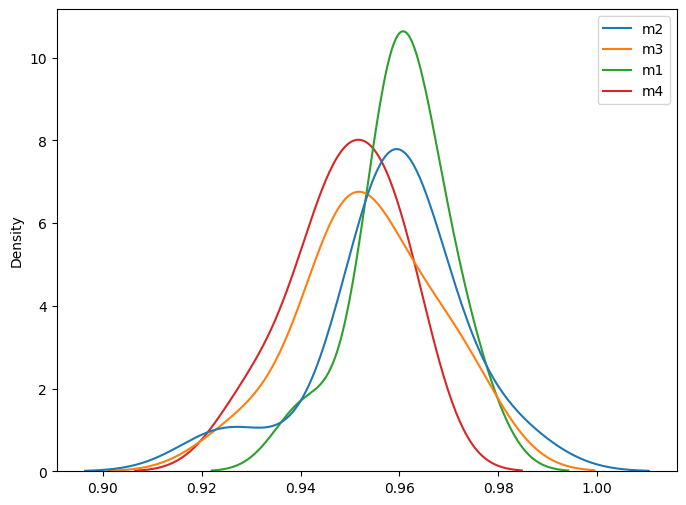

Friedman Test
FriedmanchisquareResult(statistic=12.347368421052622, pvalue=0.006283187869102803)


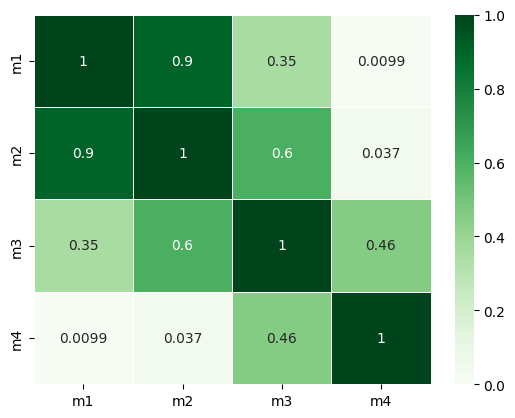

Friedman Test
FriedmanchisquareResult(statistic=12.347368421052622, pvalue=0.006283187869102803)

Skater explaning...
Explaining M1...


2023-06-01 17:17:54,848 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 17:18:06,813 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 17:18:19,505 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 17:18:32,517 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/57 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/57 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/57 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/57 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


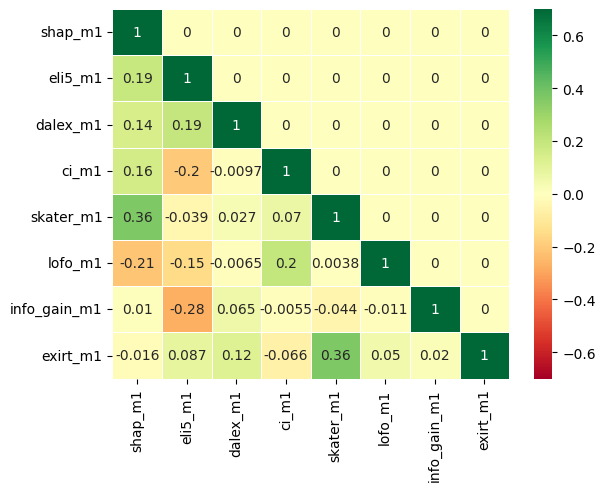

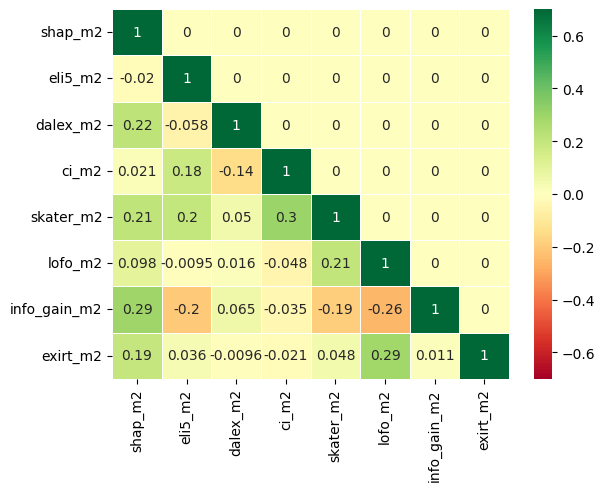

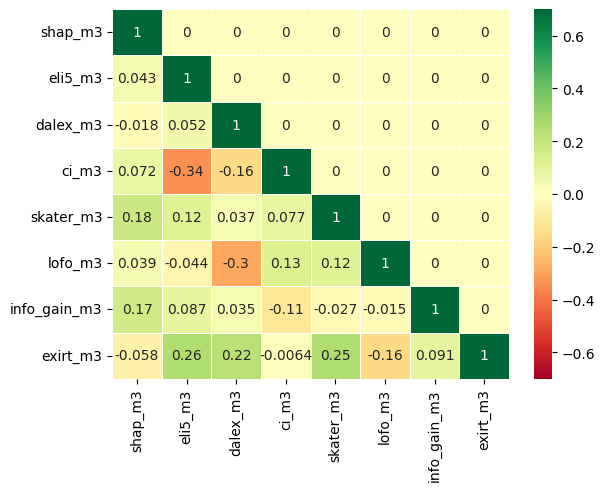

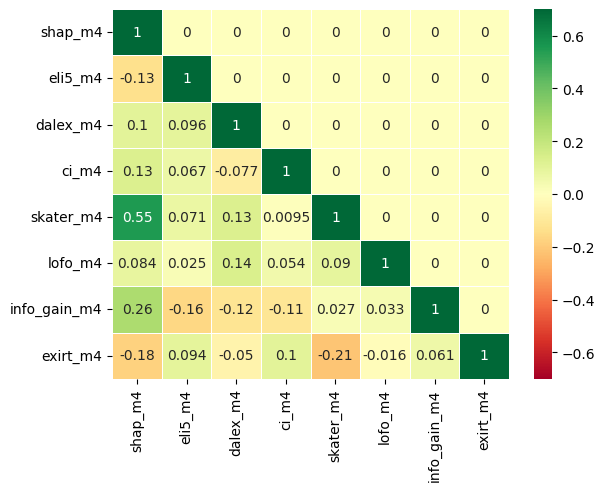

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: qsar-biodeg
Version.......: 1
Format........: ARFF
Upload Date...: 2015-05-25 21:14:53
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/1592286/qsar-biodeg.arff
OpenML URL....: https://www.openml.org/d/1494
# of features.: 42
# of instances: 1055>
All numeric
         V1      V2   V3   V4    V5   V6   V7    V8   V9  V10  ...  V32  V33  \
0     3.919  2.6909  0.0  0.0   0.0  0.0  0.0  31.4  2.0  0.0  ...  0.0  0.0   
1     4.170  2.1144  0.0  0.0   0.0  0.0  0.0  30.8  1.0  1.0  ...  0.0  0.0   
2     3.932  3.2512  0.0  0.0   0.0  0.0  0.0  26.7  2.0  4.0  ...  0.0  0.0   
3     3.000  2.7098  0.0  0.0   0.0  0.0  0.0  20.0  0.0  2.0  ...  0.0  0.0   
4     4.236  3.3944  0.0  0.0   0.0  0.0  0.0  29.4  2.0  4.0  ...  0.0  0.0   
...     ...     ...  ...  ...   ...  ...  ...   ...  ...  ...  ...  ...  ...   
1050  5.431  2.8955  0.0  0.0   0.0  2.0  0.0  32.1  4.0  1.0  ...  2.0  0.0   

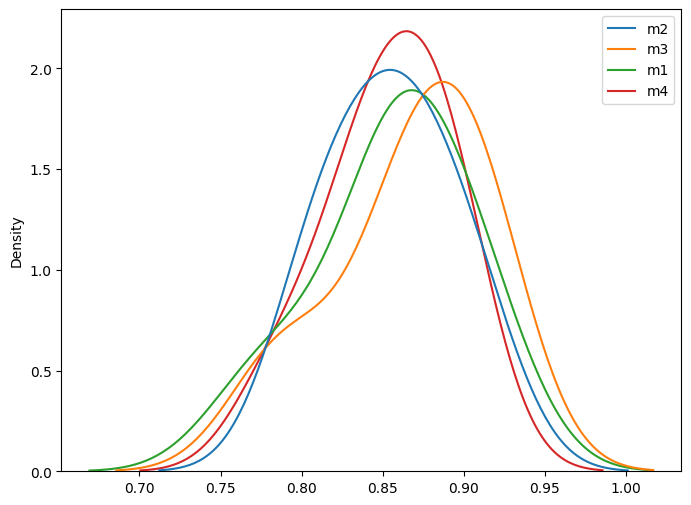

Friedman Test
FriedmanchisquareResult(statistic=5.457831325301206, pvalue=0.14118263869799874)


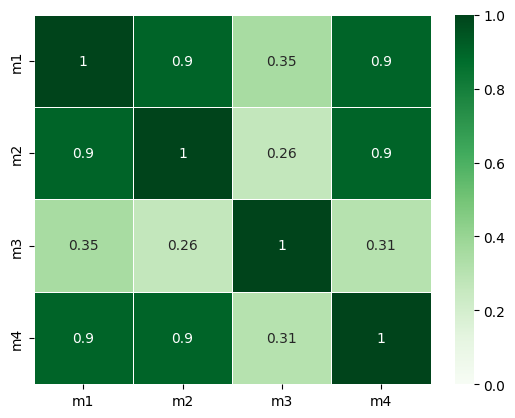

Friedman Test
FriedmanchisquareResult(statistic=5.457831325301206, pvalue=0.14118263869799874)

Skater explaning...
Explaining M1...


2023-06-01 18:16:23,550 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 18:16:26,677 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 18:16:31,021 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 18:16:34,436 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/41 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/41 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/41 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/41 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


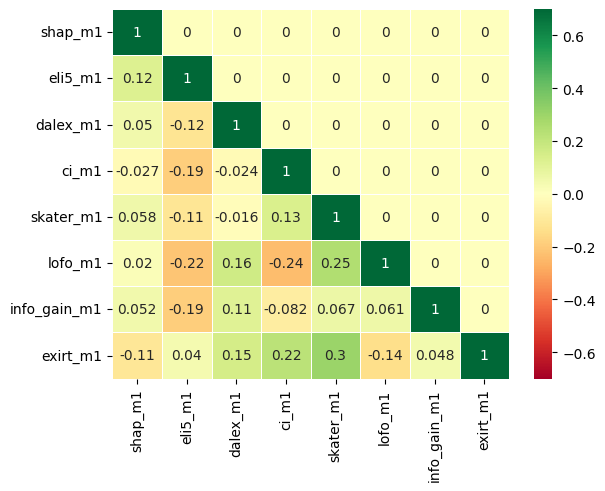

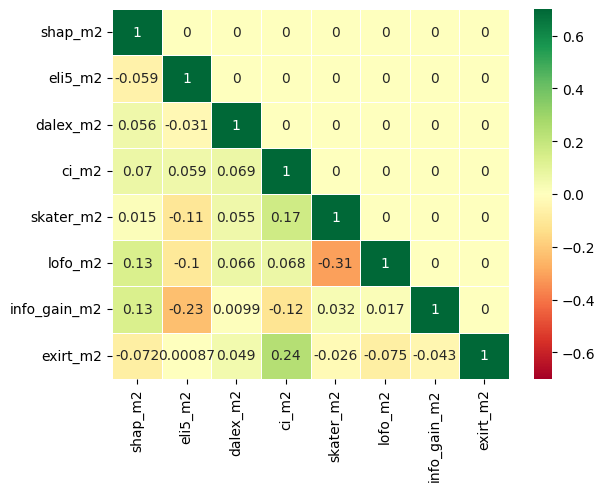

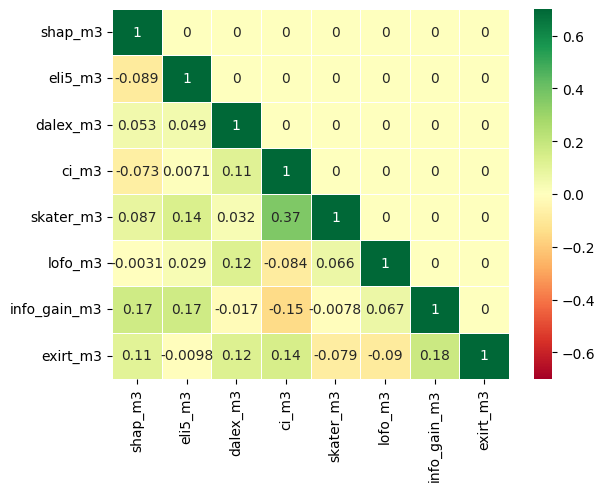

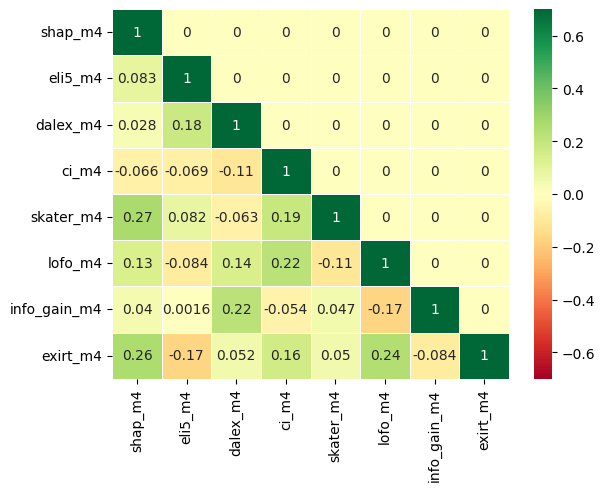

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: ionosphere
Version.......: 1
Format........: ARFF
Upload Date...: 2014-04-06 23:23:29
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/59/ionosphere.arff
OpenML URL....: https://www.openml.org/d/59
# of features.: 35
# of instances: 351>
All numeric
     a01  a02      a03      a04      a05      a06      a07      a08      a09  \
0    1.0  0.0  0.99539 -0.05889  0.85243  0.02306  0.83398 -0.37708  1.00000   
1    1.0  0.0  1.00000 -0.18829  0.93035 -0.36156 -0.10868 -0.93597  1.00000   
2    1.0  0.0  1.00000 -0.03365  1.00000  0.00485  1.00000 -0.12062  0.88965   
3    1.0  0.0  1.00000 -0.45161  1.00000  1.00000  0.71216 -1.00000  0.00000   
4    1.0  0.0  1.00000 -0.02401  0.94140  0.06531  0.92106 -0.23255  0.77152   
..   ...  ...      ...      ...      ...      ...      ...      ...      ...   
346  1.0  0.0  0.83508  0.08298  0.73739 -0.14706  0.84349 -0.05567  0.90441   
347  1.0 

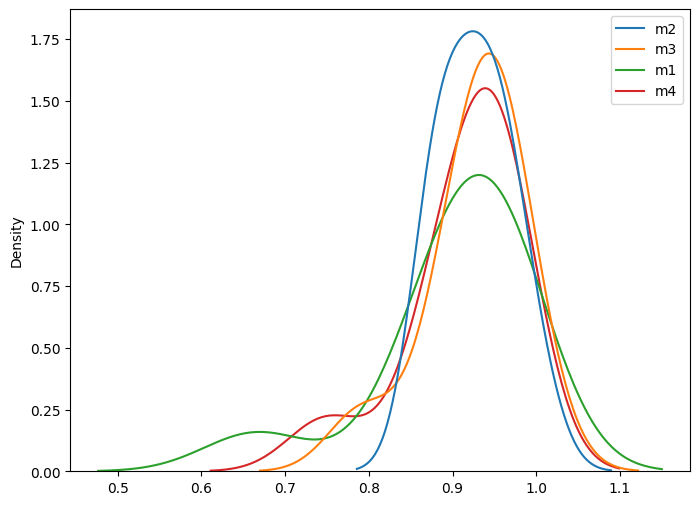

Friedman Test
FriedmanchisquareResult(statistic=3.000000000000006, pvalue=0.3916251762710889)


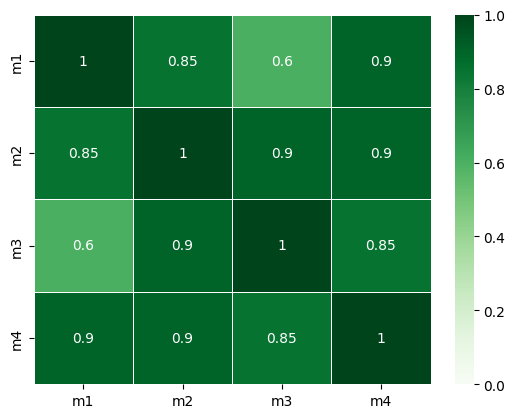

Friedman Test
FriedmanchisquareResult(statistic=3.000000000000006, pvalue=0.3916251762710889)

Skater explaning...
Explaining M1...


2023-06-01 18:39:32,807 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 18:39:34,544 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 18:39:36,917 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 18:39:39,609 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/34 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/34 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/34 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/34 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


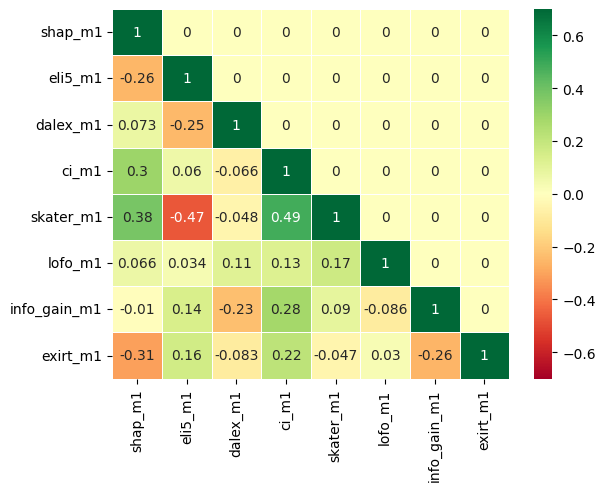

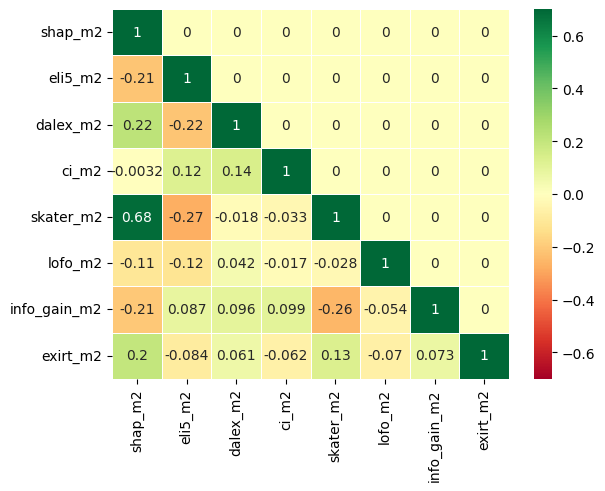

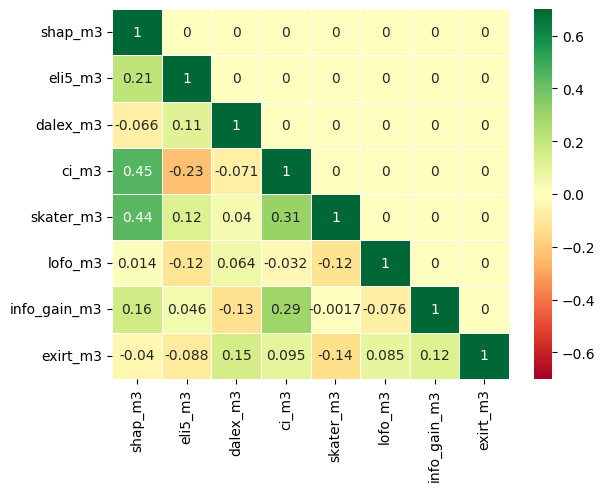

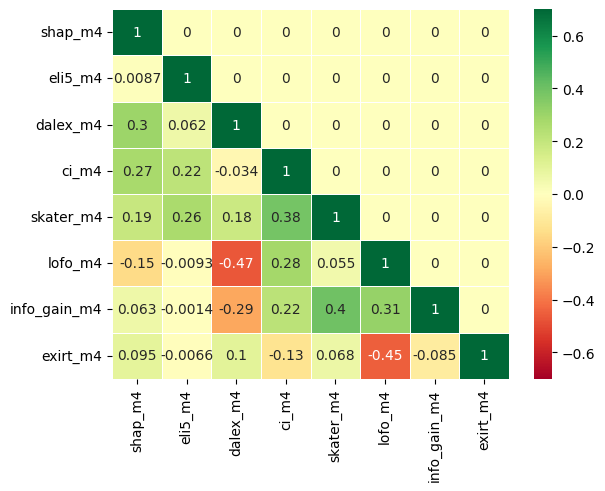

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: steel-plates-fault
Version.......: 1
Format........: ARFF
Upload Date...: 2015-05-25 22:42:40
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/1592296/steel-plates-fault.arff
OpenML URL....: https://www.openml.org/d/1504
# of features.: 34
# of instances: 1941>
All numeric
      X_Minimum  X_Maximum  Y_Minimum  Y_Maximum  Pixels_Areas  X_Perimeter  \
0          42.0       50.0   270900.0   270944.0         267.0         17.0   
1         645.0      651.0  2538079.0  2538108.0         108.0         10.0   
2         829.0      835.0  1553913.0  1553931.0          71.0          8.0   
3         853.0      860.0   369370.0   369415.0         176.0         13.0   
4        1289.0     1306.0   498078.0   498335.0        2409.0         60.0   
...         ...        ...        ...        ...           ...          ...   
1936      249.0      277.0   325780.0   325796.0         273.0         5

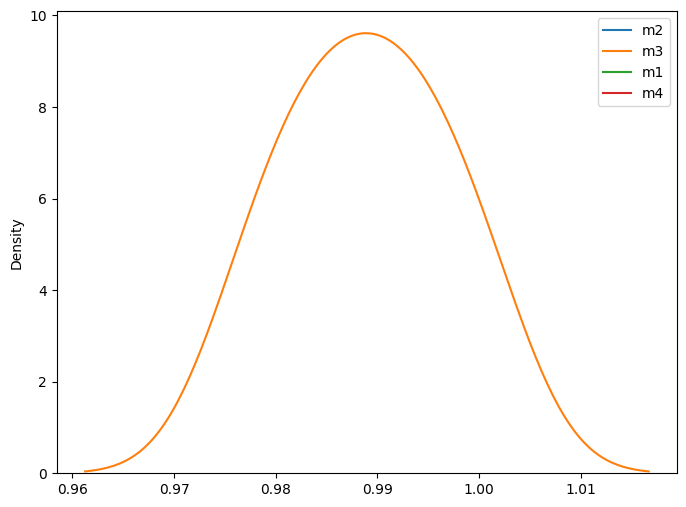

Friedman Test
FriedmanchisquareResult(statistic=23.999999999999964, pvalue=2.4979977724652457e-05)


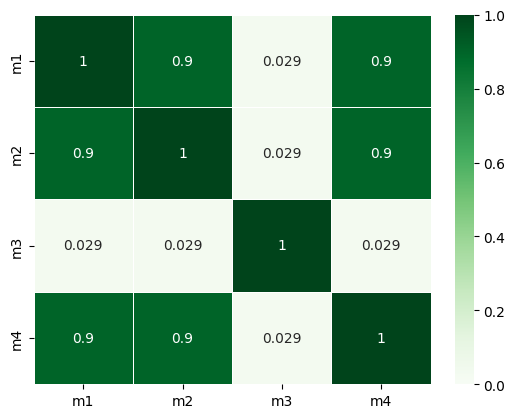

Friedman Test
FriedmanchisquareResult(statistic=23.999999999999964, pvalue=2.4979977724652457e-05)

Skater explaning...
Explaining M1...


2023-06-01 18:50:49,987 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 18:50:54,092 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 18:50:56,625 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 18:50:59,489 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/33 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/33 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/33 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/33 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


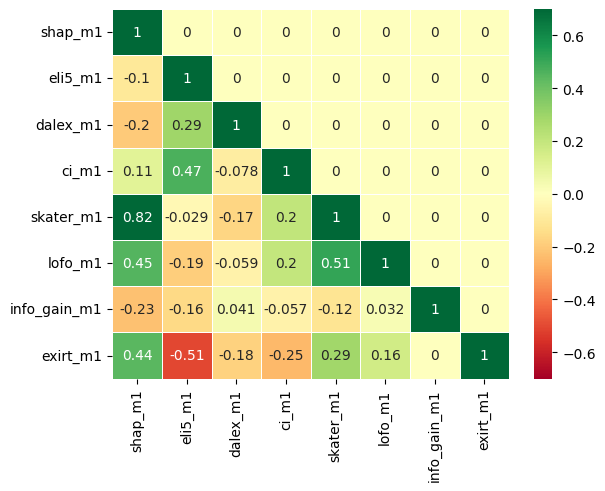

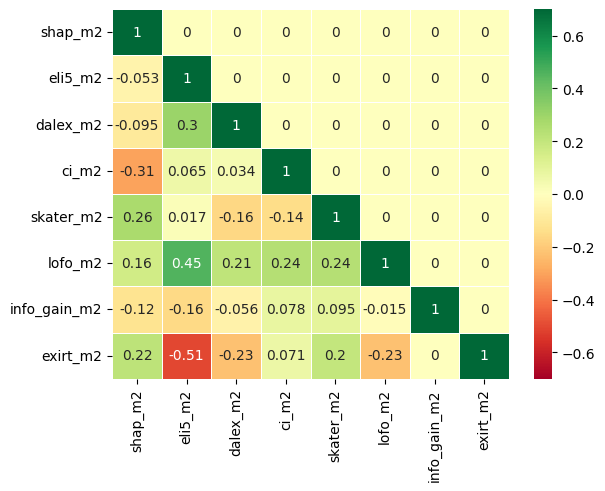

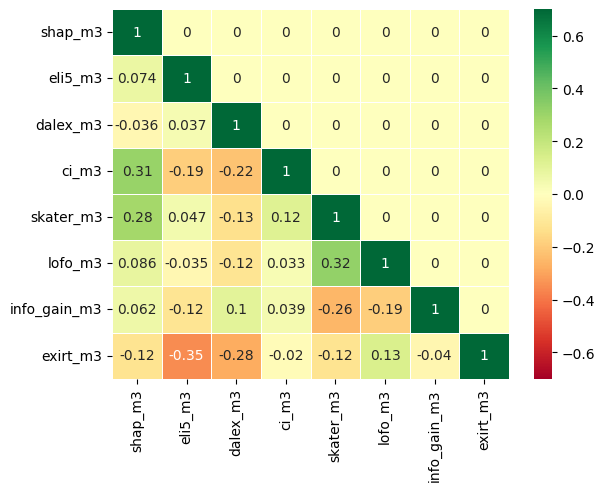

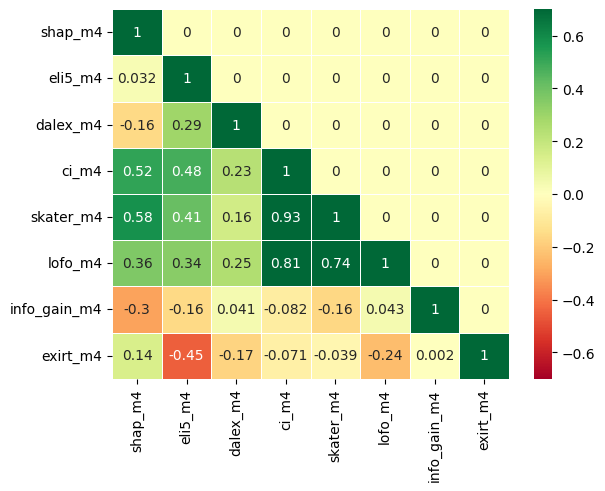

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: wdbc
Version.......: 1
Format........: ARFF
Upload Date...: 2015-05-26 16:24:07
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/1592318/wdbc.arff
OpenML URL....: https://www.openml.org/d/1510
# of features.: 31
# of instances: 569>
All numeric
        V1     V2      V3      V4       V5       V6       V7       V8      V9  \
0    17.99  10.38  122.80  1001.0  0.11840  0.27760  0.30010  0.14710  0.2419   
1    20.57  17.77  132.90  1326.0  0.08474  0.07864  0.08690  0.07017  0.1812   
2    19.69  21.25  130.00  1203.0  0.10960  0.15990  0.19740  0.12790  0.2069   
3    11.42  20.38   77.58   386.1  0.14250  0.28390  0.24140  0.10520  0.2597   
4    20.29  14.34  135.10  1297.0  0.10030  0.13280  0.19800  0.10430  0.1809   
..     ...    ...     ...     ...      ...      ...      ...      ...     ...   
564  21.56  22.39  142.00  1479.0  0.11100  0.11590  0.24390  0.13890  0.1726   
565  2

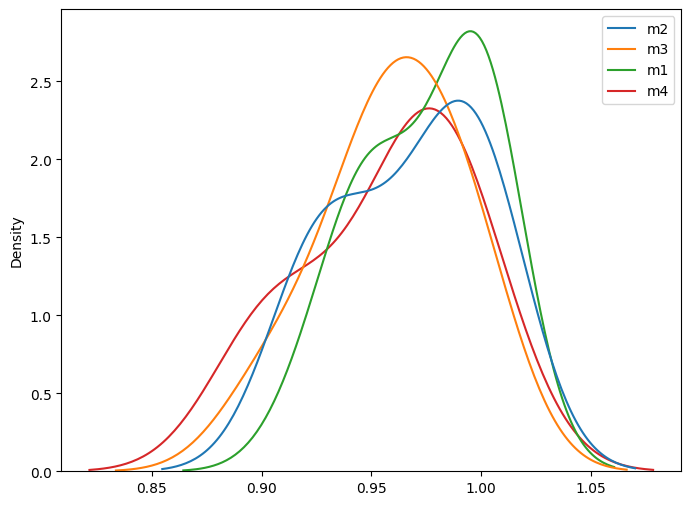

Friedman Test
FriedmanchisquareResult(statistic=7.983870967741917, pvalue=0.04634622291369887)


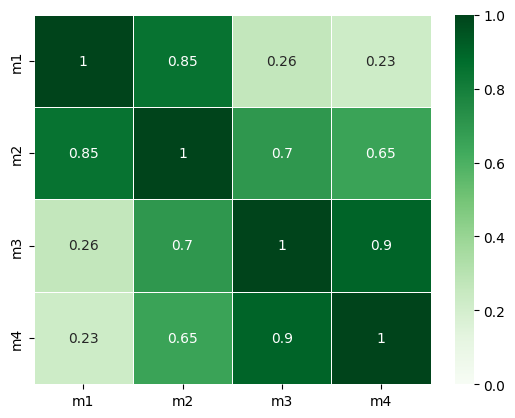

Friedman Test
FriedmanchisquareResult(statistic=7.983870967741917, pvalue=0.04634622291369887)

Skater explaning...
Explaining M1...


2023-06-01 19:15:34,044 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 19:15:35,637 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 19:15:37,132 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 19:15:38,924 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/30 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/30 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/30 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/30 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


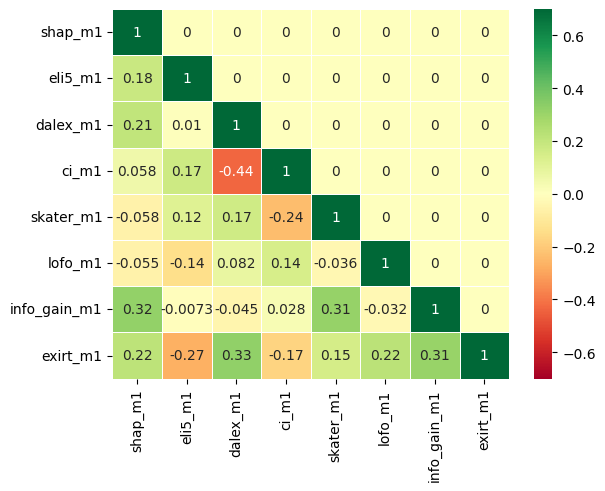

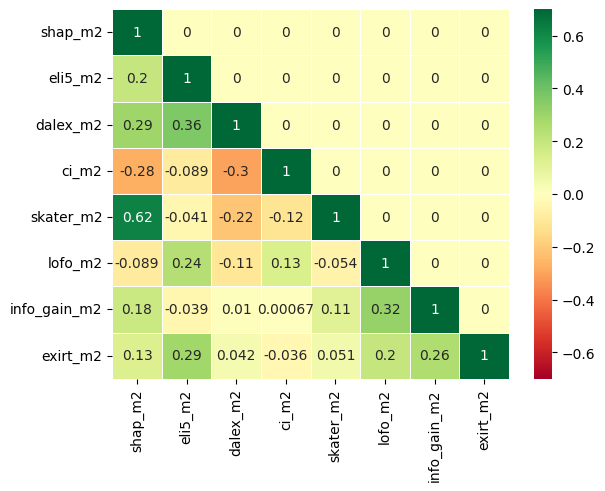

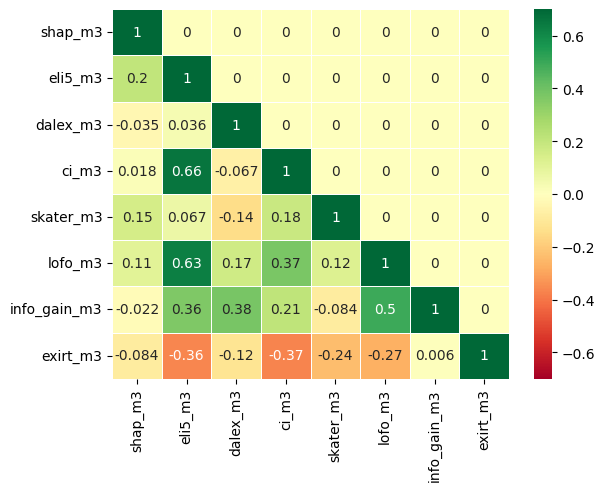

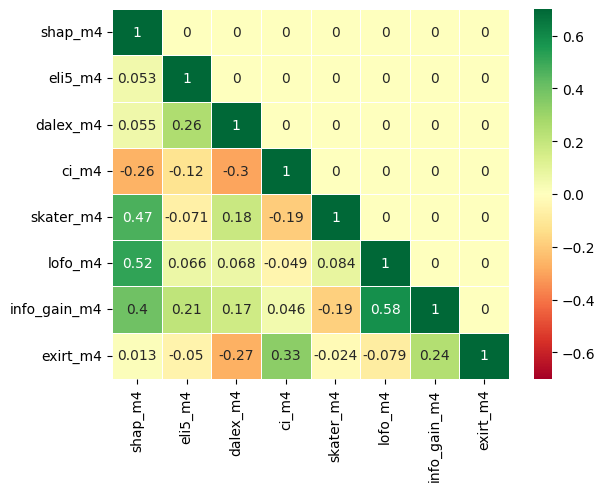

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: eeg-eye-state
Version.......: 1
Format........: ARFF
Upload Date...: 2015-05-22 16:40:04
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/1587924/eeg-eye-state.arff
OpenML URL....: https://www.openml.org/d/1471
# of features.: 15
# of instances: 14980>
All numeric
            V1       V2       V3       V4       V5       V6       V7       V8  \
0      4329.23  4009.23  4289.23  4148.21  4350.26  4586.15  4096.92  4641.03   
1      4324.62  4004.62  4293.85  4148.72  4342.05  4586.67  4097.44  4638.97   
2      4327.69  4006.67  4295.38  4156.41  4336.92  4583.59  4096.92  4630.26   
3      4328.72  4011.79  4296.41  4155.90  4343.59  4582.56  4097.44  4630.77   
4      4326.15  4011.79  4292.31  4151.28  4347.69  4586.67  4095.90  4627.69   
...        ...      ...      ...      ...      ...      ...      ...      ...   
14975  4281.03  3990.26  4245.64  4116.92  4333.85  4614.36  4074.8

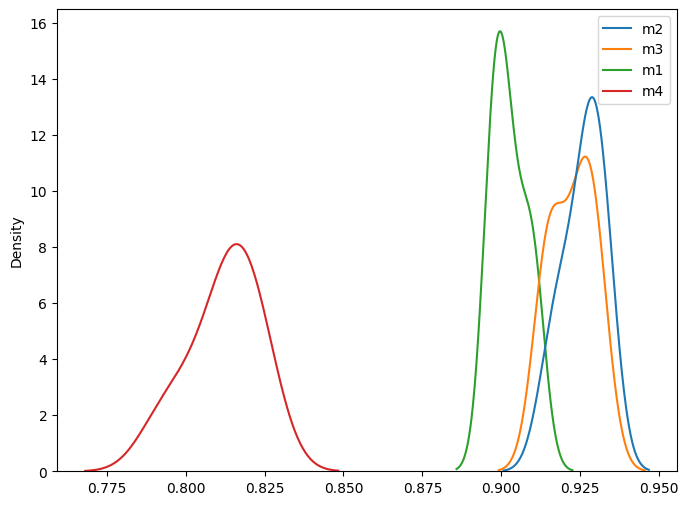

Friedman Test
FriedmanchisquareResult(statistic=27.120000000000005, pvalue=5.55598717156124e-06)


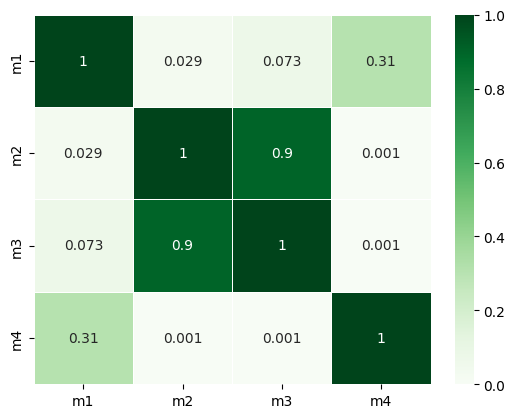

Friedman Test
FriedmanchisquareResult(statistic=27.120000000000005, pvalue=5.55598717156124e-06)

Skater explaning...
Explaining M1...


2023-06-01 19:31:25,179 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 19:31:28,886 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 19:31:32,753 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 19:31:39,184 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/14 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/14 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/14 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/14 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


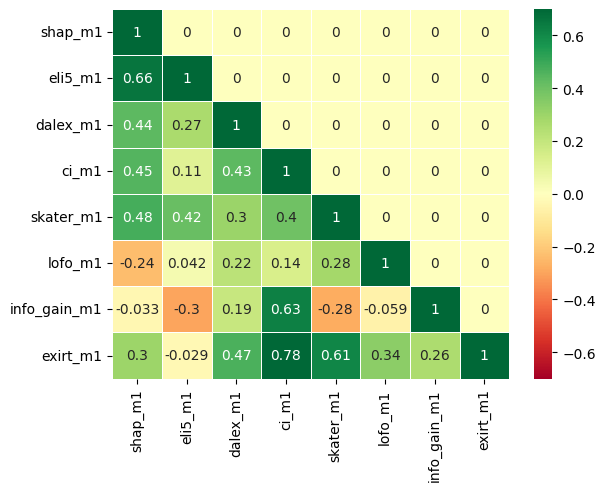

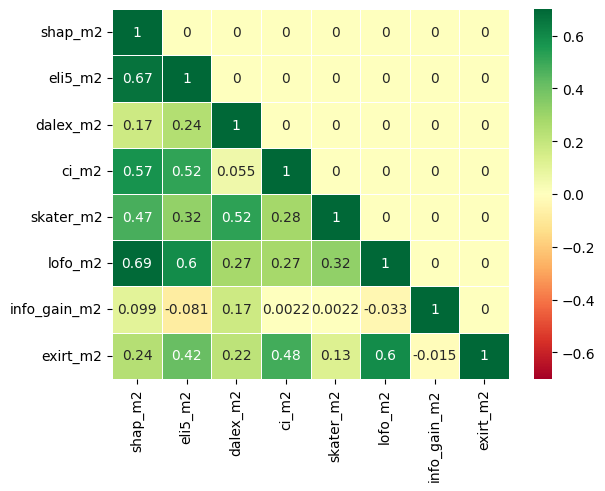

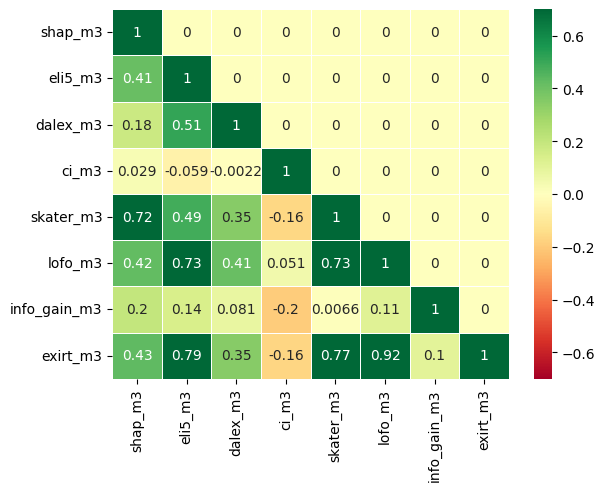

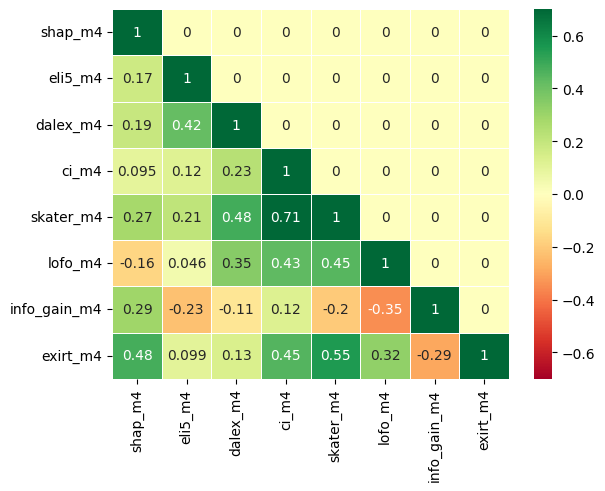

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: heart-statlog
Version.......: 1
Format........: ARFF
Upload Date...: 2014-04-06 23:23:06
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/53/heart-statlog.arff
OpenML URL....: https://www.openml.org/d/53
# of features.: 14
# of instances: 270>
All numeric
      age  sex  chest  resting_blood_pressure  serum_cholestoral  \
0    70.0  1.0    4.0                   130.0              322.0   
1    67.0  0.0    3.0                   115.0              564.0   
2    57.0  1.0    2.0                   124.0              261.0   
3    64.0  1.0    4.0                   128.0              263.0   
4    74.0  0.0    2.0                   120.0              269.0   
..    ...  ...    ...                     ...                ...   
265  52.0  1.0    3.0                   172.0              199.0   
266  44.0  1.0    2.0                   120.0              263.0   
267  56.0  0.0    2.0          

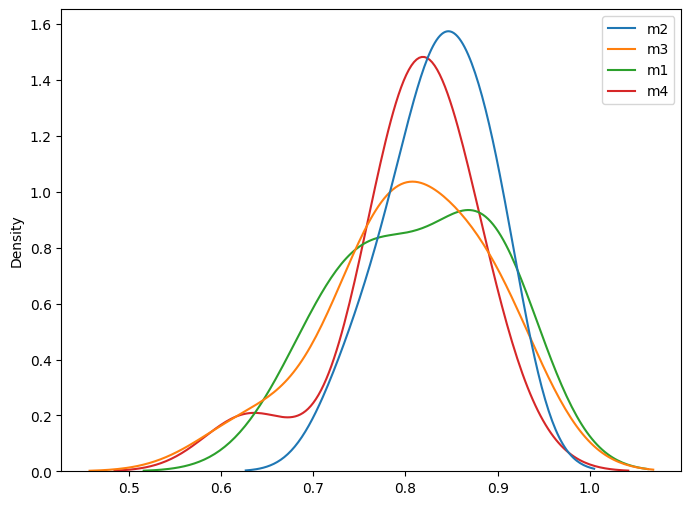

Friedman Test
FriedmanchisquareResult(statistic=3.4615384615384612, pvalue=0.3257848202752088)


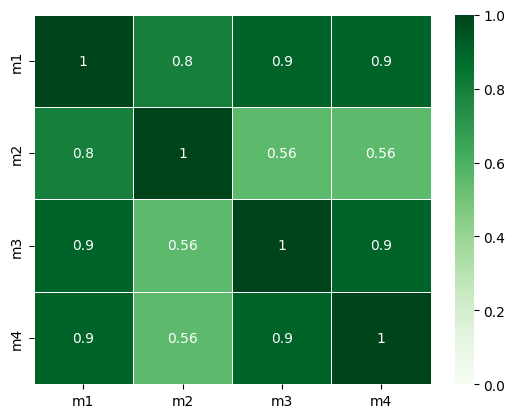

Friedman Test
FriedmanchisquareResult(statistic=3.4615384615384612, pvalue=0.3257848202752088)

Skater explaning...
Explaining M1...


2023-06-01 19:57:51,984 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 19:57:52,959 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 19:57:53,614 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 19:57:54,460 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/13 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/13 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/13 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/13 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


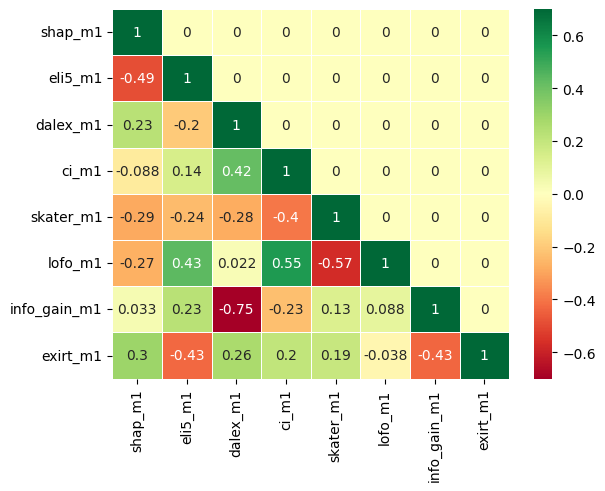

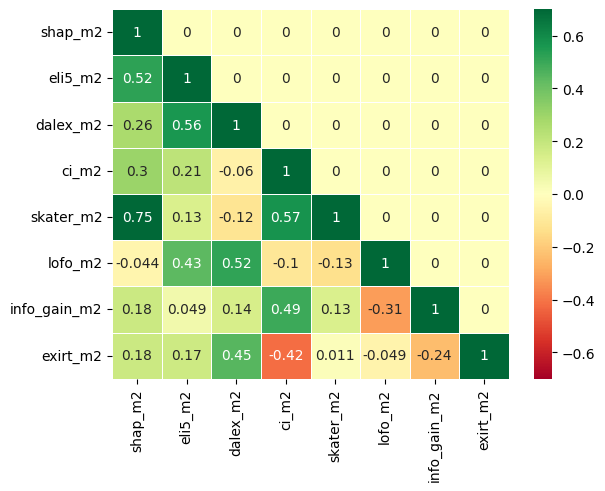

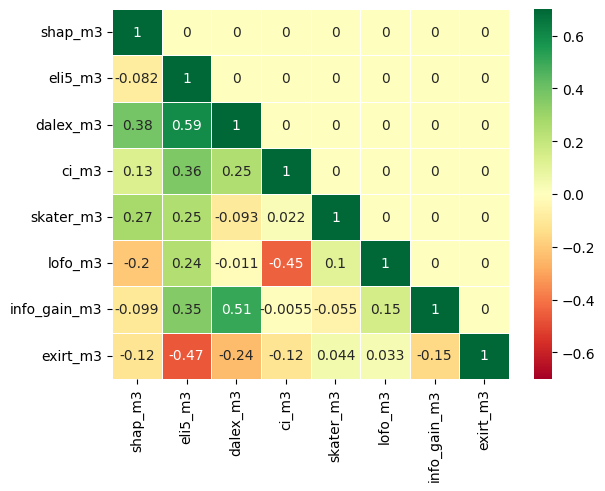

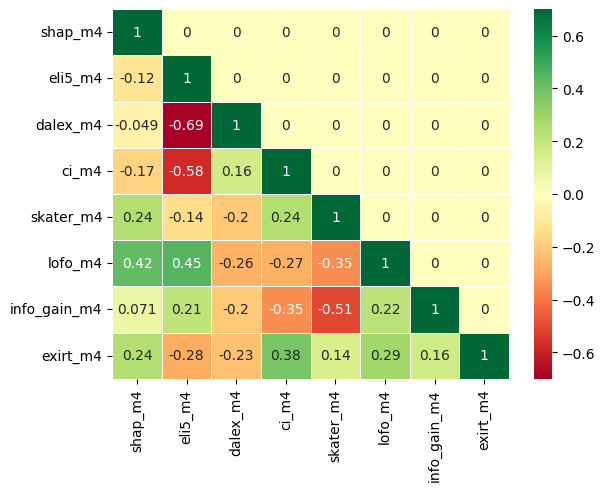

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: ilpd
Version.......: 1
Format........: ARFF
Upload Date...: 2015-05-22 22:40:56
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/1590565/ilpd.arff
OpenML URL....: https://www.openml.org/d/1480
# of features.: 11
# of instances: 583>
     V1  V2    V3   V4     V5    V6     V7   V8   V9   V10
0    65   1   0.7  0.1  187.0  16.0   18.0  6.8  3.3  0.90
1    62   0  10.9  5.5  699.0  64.0  100.0  7.5  3.2  0.74
2    62   0   7.3  4.1  490.0  60.0   68.0  7.0  3.3  0.89
3    58   0   1.0  0.4  182.0  14.0   20.0  6.8  3.4  1.00
4    72   0   3.9  2.0  195.0  27.0   59.0  7.3  2.4  0.40
..   ..  ..   ...  ...    ...   ...    ...  ...  ...   ...
578  60   0   0.5  0.1  500.0  20.0   34.0  5.9  1.6  0.37
579  40   0   0.6  0.1   98.0  35.0   31.0  6.0  3.2  1.10
580  52   0   0.8  0.2  245.0  48.0   49.0  6.4  3.2  1.00
581  31   0   1.3  0.5  184.0  29.0   32.0  6.8  3.4  1.00
582  38   0   1.0

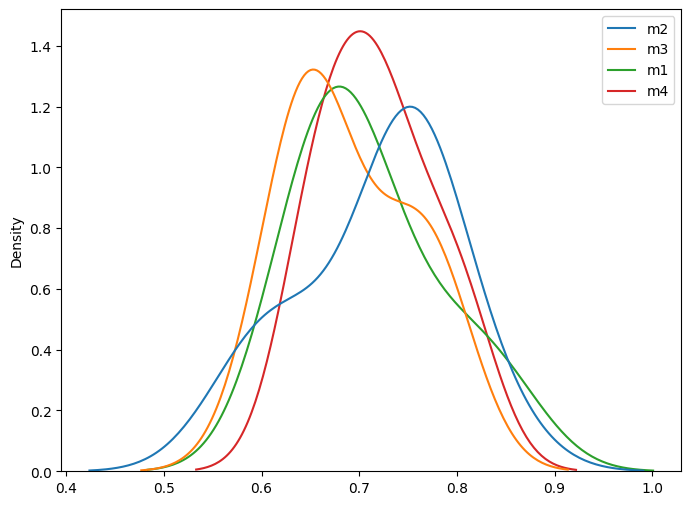

Friedman Test
FriedmanchisquareResult(statistic=0.42857142857141356, pvalue=0.934279075624254)


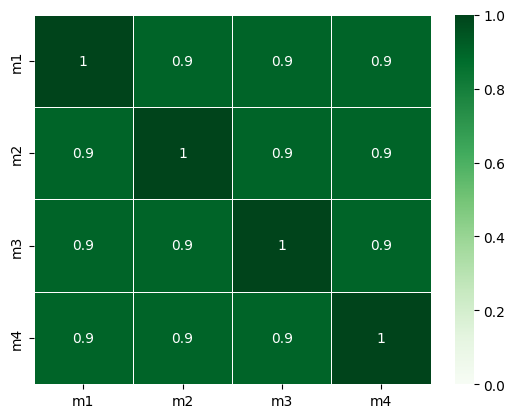

Friedman Test
FriedmanchisquareResult(statistic=0.42857142857141356, pvalue=0.934279075624254)

Skater explaning...
Explaining M1...


2023-06-01 20:00:41,905 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 20:00:42,324 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 20:00:42,698 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 20:00:43,212 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/10 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/10 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/10 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/10 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


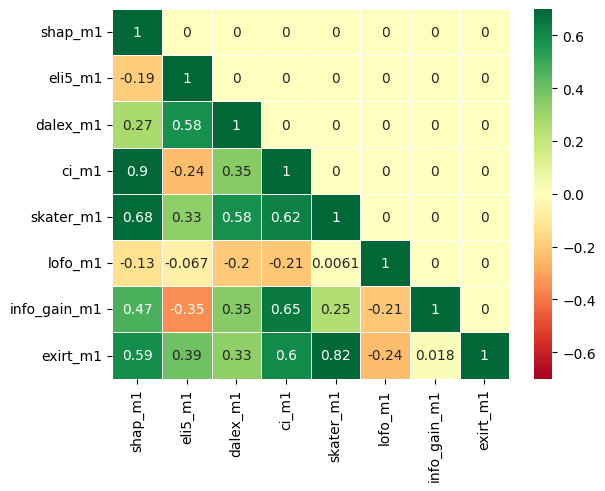

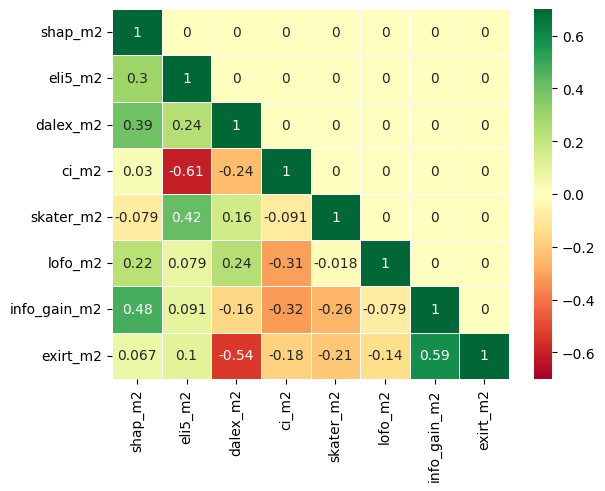

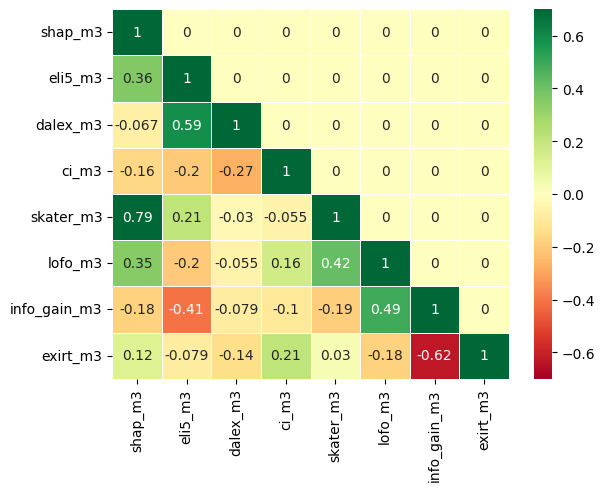

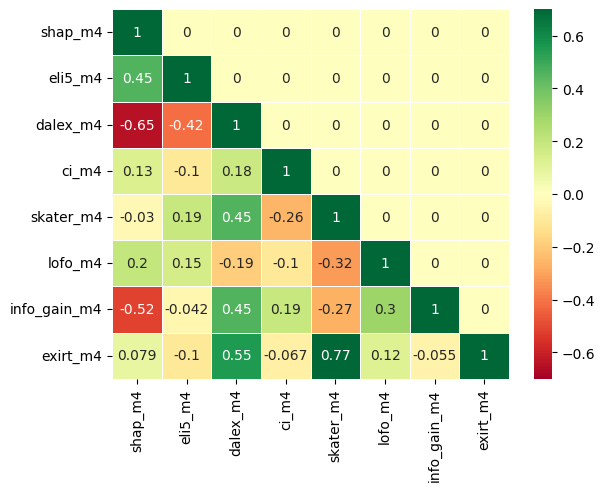

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: jEdit_4.0_4.2
Version.......: 1
Format........: ARFF
Upload Date...: 2014-10-06 23:57:53
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/53956/jEdit_4.0_4.2.arff
OpenML URL....: https://www.openml.org/d/1073
# of features.: 9
# of instances: 274>
All numeric
       WMC  DIT  NOC  CBO    RFC  LCOM  NPM     LOC
0      4.0    0    2    1    4.0     0    4     7.0
1      5.0    1    4    9   17.0    80    5   133.0
2      3.0    6    0   26  630.0    46    1   465.0
3      2.0    1    0   14   14.0    50    1    82.0
4      4.0    1    0   15   16.0    25    4    61.0
..     ...  ...  ...  ...    ...   ...  ...     ...
269    6.0    1    0    1   18.0    41    6    35.0
270   13.0    1    7    3   25.0     0   13    56.0
271  117.0    1    0   16  129.0    96   27  2373.0
272   13.0    0    1    2   13.0     0   13    28.0
273    5.0    3    0    1   42.0    60    5    30.0

[274 rows x 8 

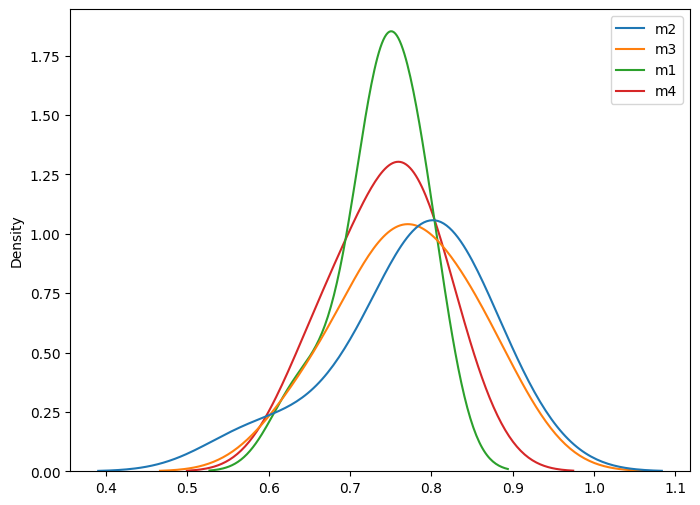

Friedman Test
FriedmanchisquareResult(statistic=5.142857142857153, pvalue=0.16163037938104766)


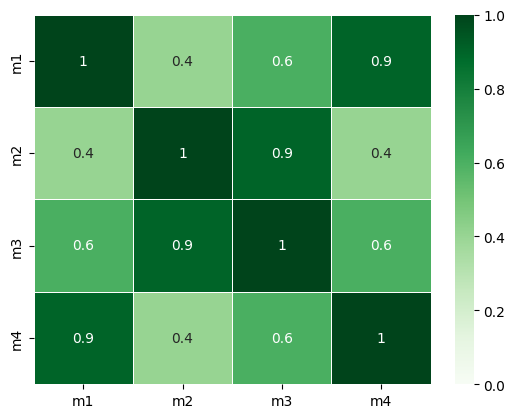

Friedman Test
FriedmanchisquareResult(statistic=5.142857142857153, pvalue=0.16163037938104766)

Skater explaning...
Explaining M1...


2023-06-01 20:04:05,019 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 20:04:05,347 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 20:04:05,639 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 20:04:06,021 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/8 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/8 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/8 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/8 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


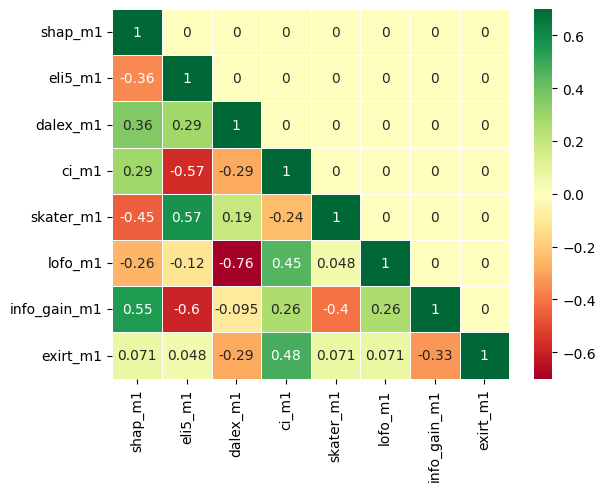

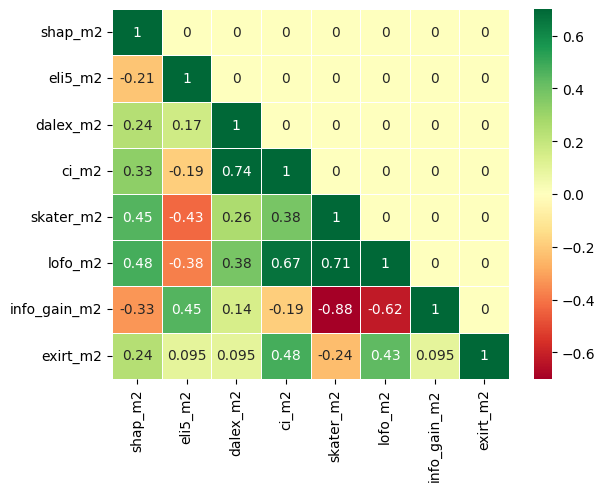

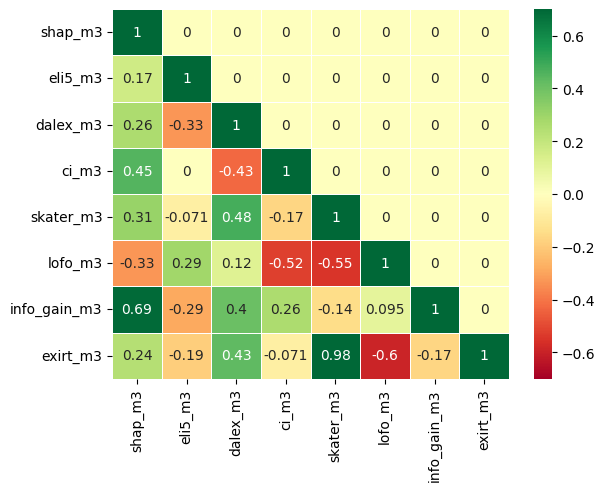

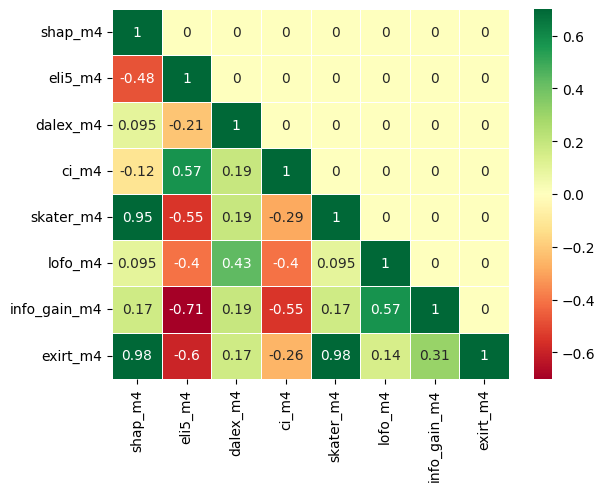

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: diabetes
Version.......: 1
Format........: ARFF
Upload Date...: 2014-04-06 23:22:13
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/37/diabetes.arff
OpenML URL....: https://www.openml.org/d/37
# of features.: 9
# of instances: 768>
All numeric
     preg   plas  pres  skin   insu  mass   pedi   age
0     6.0  148.0  72.0  35.0    0.0  33.6  0.627  50.0
1     1.0   85.0  66.0  29.0    0.0  26.6  0.351  31.0
2     8.0  183.0  64.0   0.0    0.0  23.3  0.672  32.0
3     1.0   89.0  66.0  23.0   94.0  28.1  0.167  21.0
4     0.0  137.0  40.0  35.0  168.0  43.1  2.288  33.0
..    ...    ...   ...   ...    ...   ...    ...   ...
763  10.0  101.0  76.0  48.0  180.0  32.9  0.171  63.0
764   2.0  122.0  70.0  27.0    0.0  36.8  0.340  27.0
765   5.0  121.0  72.0  23.0  112.0  26.2  0.245  30.0
766   1.0  126.0  60.0   0.0    0.0  30.1  0.349  47.0
767   1.0   93.0  70.0  31.0    0.0  30.4  0.315 

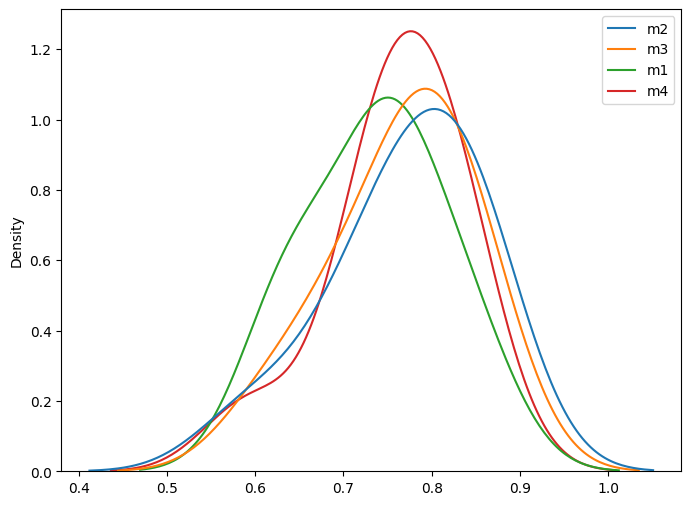

Friedman Test
FriedmanchisquareResult(statistic=5.022471910112358, pvalue=0.17015901679607356)


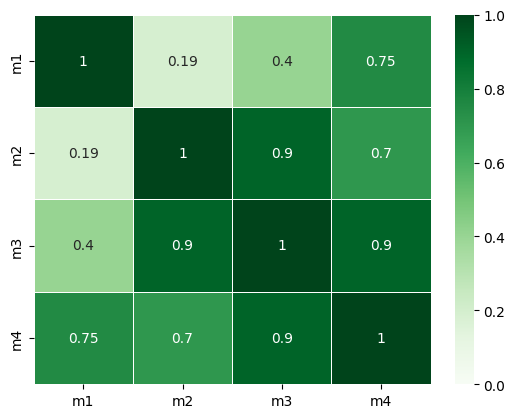

Friedman Test
FriedmanchisquareResult(statistic=5.022471910112358, pvalue=0.17015901679607356)

Skater explaning...
Explaining M1...


2023-06-01 20:06:24,197 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 20:06:24,557 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 20:06:24,892 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 20:06:25,334 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/8 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/8 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/8 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/8 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


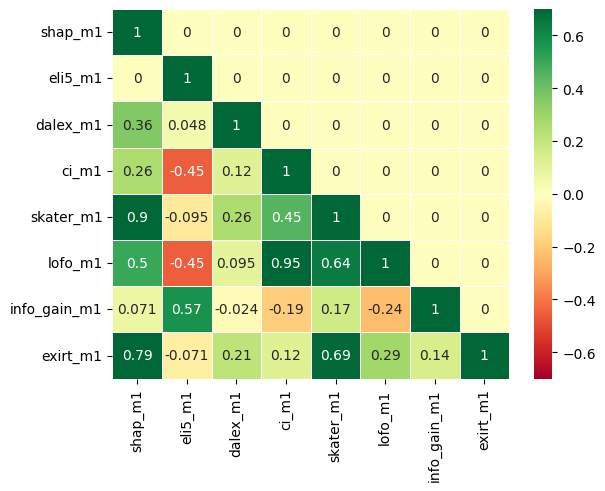

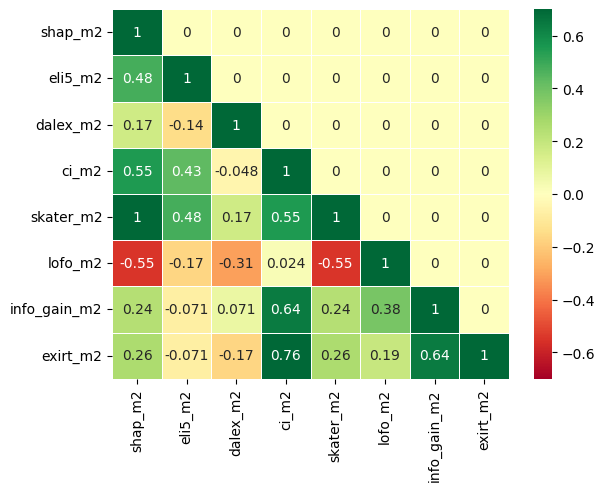

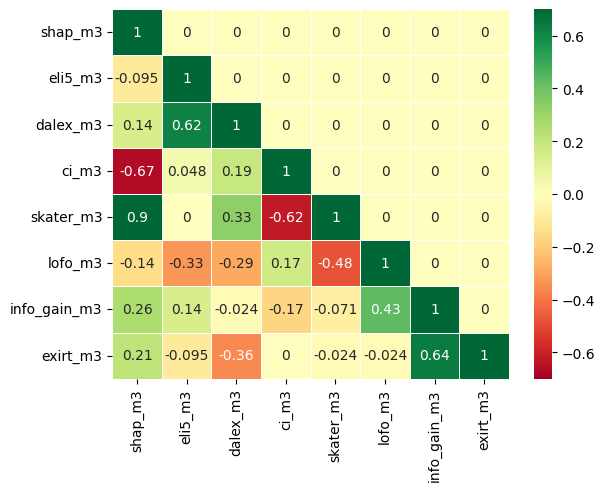

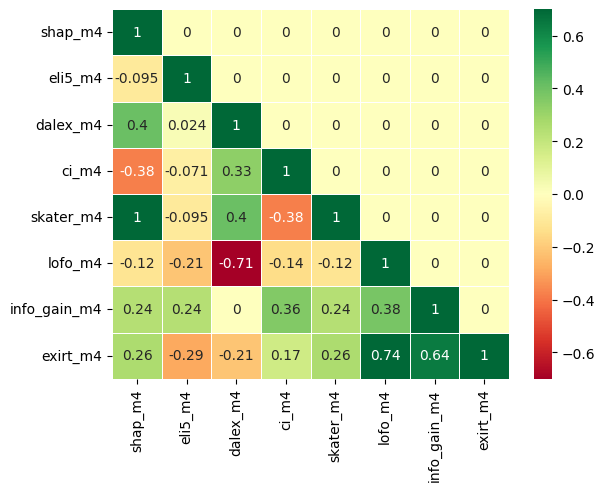

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: prnn_crabs
Version.......: 1
Format........: ARFF
Upload Date...: 2014-09-28 23:50:42
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/52558/prnn_crabs.arff
OpenML URL....: https://www.openml.org/d/446
# of features.: 8
# of instances: 200>
     sex  index    FL    RW    CL    CW    BD
0      0      1   8.1   6.7  16.1  19.0   7.0
1      0      2   8.8   7.7  18.1  20.8   7.4
2      0      3   9.2   7.8  19.0  22.4   7.7
3      0      4   9.6   7.9  20.1  23.1   8.2
4      0      5   9.8   8.0  20.3  23.0   8.2
..   ...    ...   ...   ...   ...   ...   ...
195    1     46  21.4  18.0  41.2  46.2  18.7
196    1     47  21.7  17.1  41.7  47.2  19.6
197    1     48  21.9  17.2  42.6  47.4  19.5
198    1     49  22.5  17.2  43.0  48.7  19.8
199    1     50  23.1  20.2  46.2  52.5  21.1

[200 rows x 7 columns]
    sex     index        FL        RW        CL        CW        BD
0   0.0  0.000

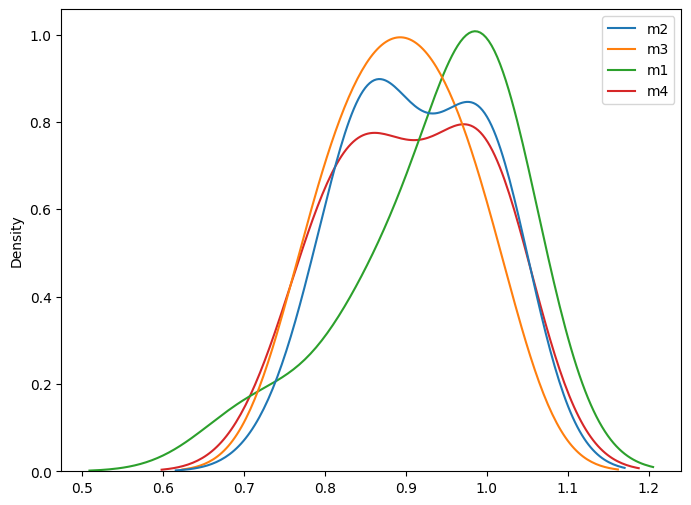

Friedman Test
FriedmanchisquareResult(statistic=4.811320754716949, pvalue=0.18614612349651208)


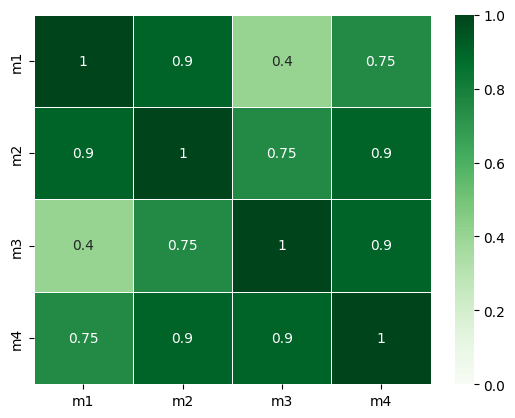

Friedman Test
FriedmanchisquareResult(statistic=4.811320754716949, pvalue=0.18614612349651208)

Skater explaning...
Explaining M1...


2023-06-01 20:10:12,982 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 20:10:13,285 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 20:10:13,564 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 20:10:13,948 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/7 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/7 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/7 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/7 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


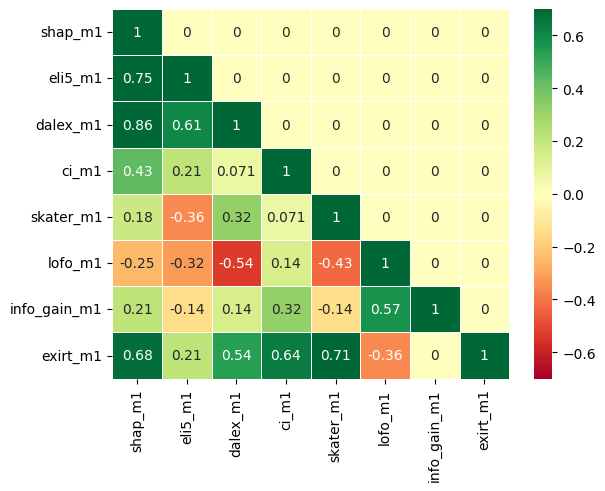

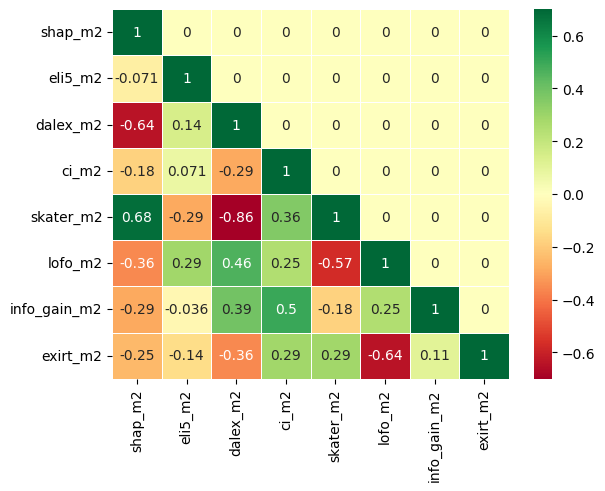

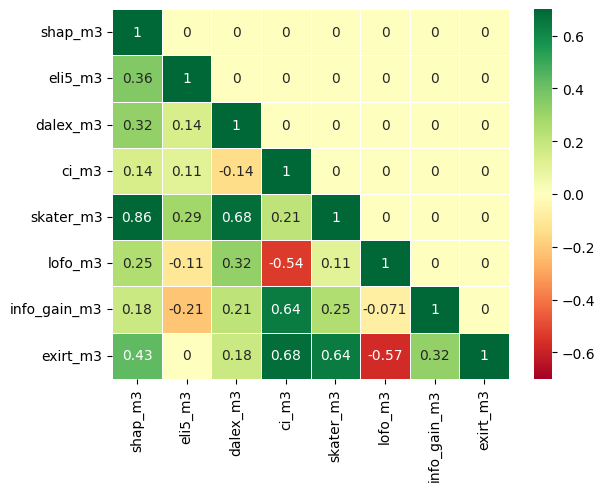

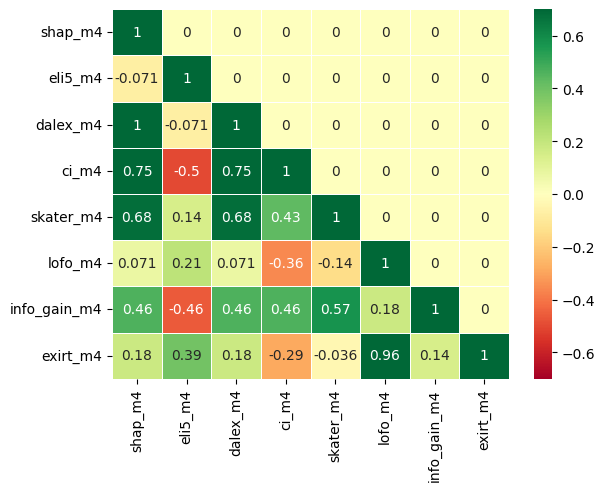

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: delta_ailerons
Version.......: 1
Format........: ARFF
Upload Date...: 2014-10-04 14:33:53
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/53337/delta_ailerons.arff
OpenML URL....: https://www.openml.org/d/803
# of features.: 6
# of instances: 7129>
All numeric
      RollRate  PitchRate  currPitch  currRoll  diffRollRate
0       0.0020     0.0025      0.015     0.010      -0.00004
1      -0.0023     0.0003      0.022    -0.011       0.00005
2       0.0059    -0.0006      0.014    -0.005       0.00017
3       0.0046     0.0001      0.011     0.015      -0.00009
4      -0.0076     0.0012      0.010     0.001      -0.00010
...        ...        ...        ...       ...           ...
7124   -0.0043     0.0002      0.017     0.005      -0.00006
7125    0.0046     0.0007      0.007     0.002       0.00015
7126    0.0040     0.0018      0.010     0.016      -0.00007
7127   -0.0082     0.0016  

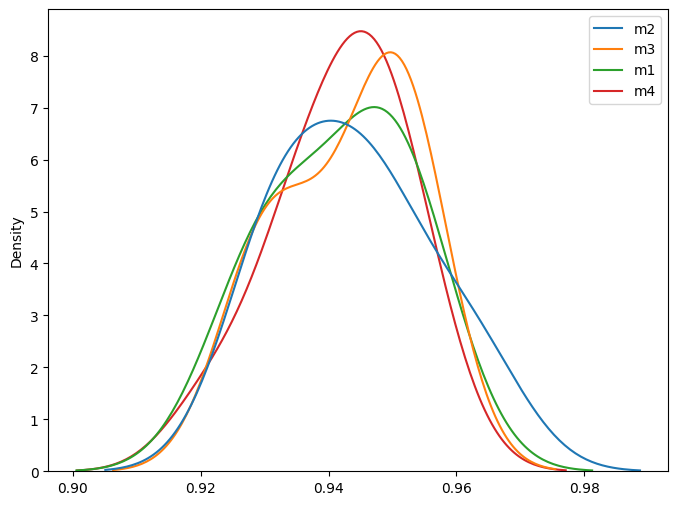

Friedman Test
FriedmanchisquareResult(statistic=2.0224719101123405, pvalue=0.5677557008625518)


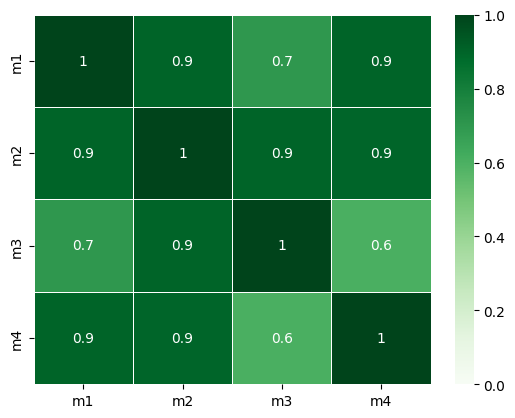

Friedman Test
FriedmanchisquareResult(statistic=2.0224719101123405, pvalue=0.5677557008625518)

Skater explaning...
Explaining M1...


2023-06-01 20:12:42,538 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 20:12:43,116 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 20:12:43,724 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 20:12:44,424 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/5 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/5 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/5 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/5 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


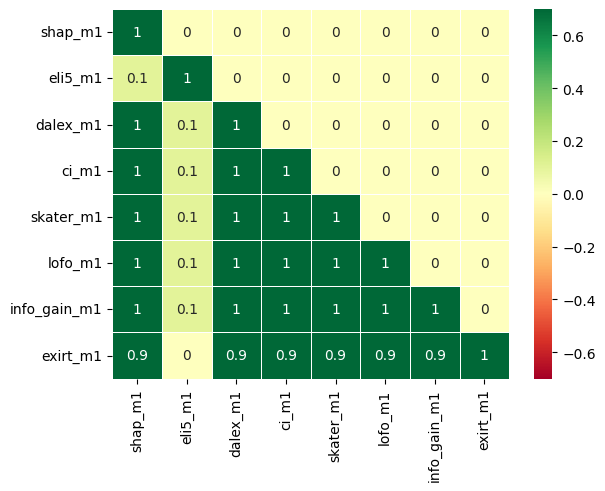

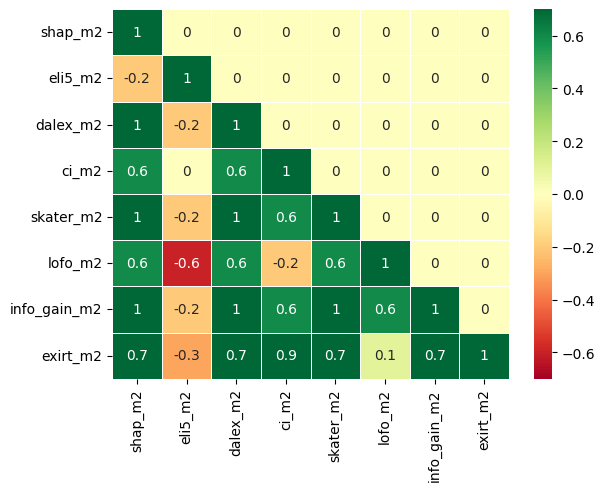

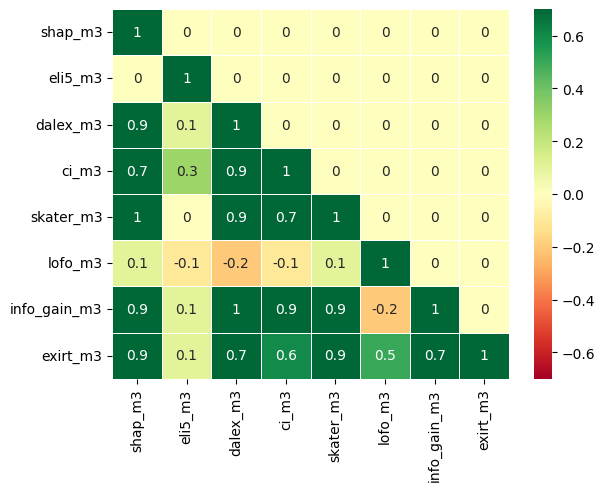

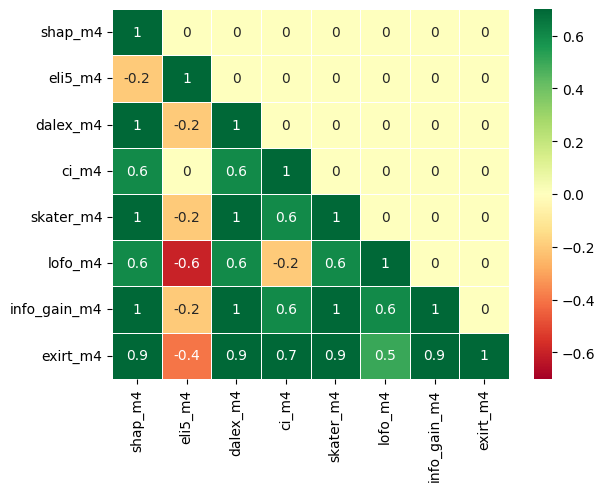

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: mozilla4
Version.......: 1
Format........: ARFF
Upload Date...: 2014-10-06 23:57:07
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/53929/mozilla4.arff
OpenML URL....: https://www.openml.org/d/1046
# of features.: 6
# of instances: 15545>
All numeric
          id      start        end  event    size
0        1.0        0.0   913439.0      0    14.0
1        1.0   913439.0  1292405.0      1    14.0
2        1.0  1292405.0  1540749.0      0    14.0
3        2.0        0.0    50170.0      0    14.0
4        3.0        0.0   913439.0      0    18.0
...      ...        ...        ...    ...     ...
15540  879.0    97360.0   130256.0      0  1511.0
15541  879.0   130256.0   132045.0      1  1513.0
15542  879.0   132045.0   132393.0      0  1502.0
15543  879.0   132393.0   207343.0      0  1517.0
15544  880.0        0.0    20203.0      0    50.0

[15545 rows x 5 columns]
          id     star

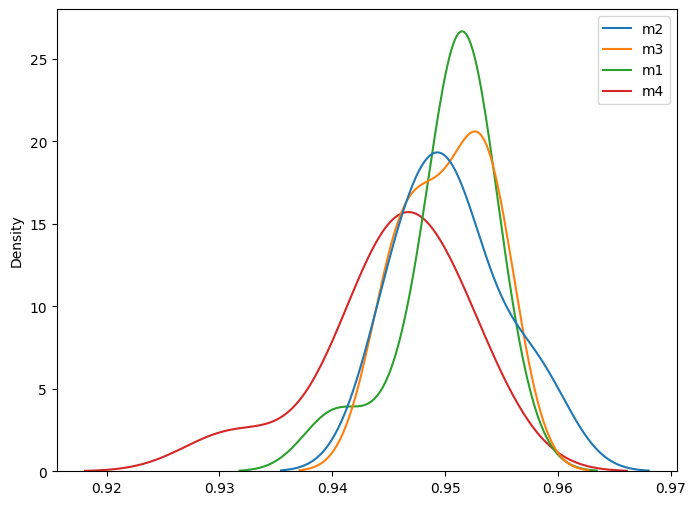

Friedman Test
FriedmanchisquareResult(statistic=16.72340425531915, pvalue=0.0008056063426477617)


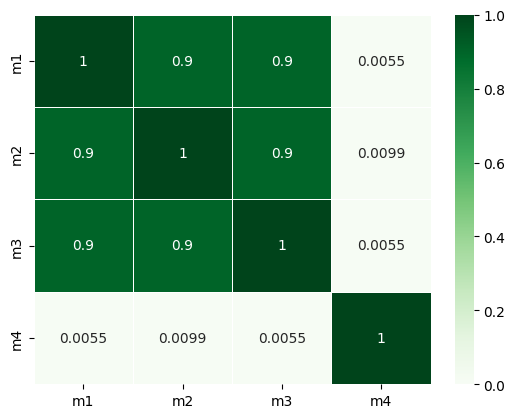

Friedman Test
FriedmanchisquareResult(statistic=16.72340425531915, pvalue=0.0008056063426477617)

Skater explaning...
Explaining M1...


2023-06-01 20:25:47,509 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 20:25:48,758 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 20:25:50,140 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 20:25:51,669 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/5 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/5 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/5 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/5 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


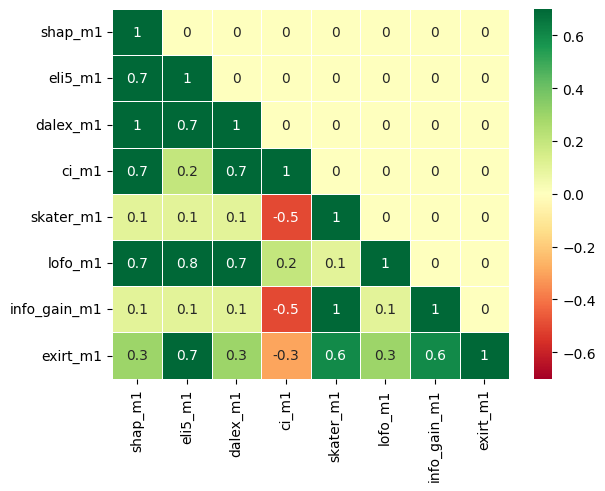

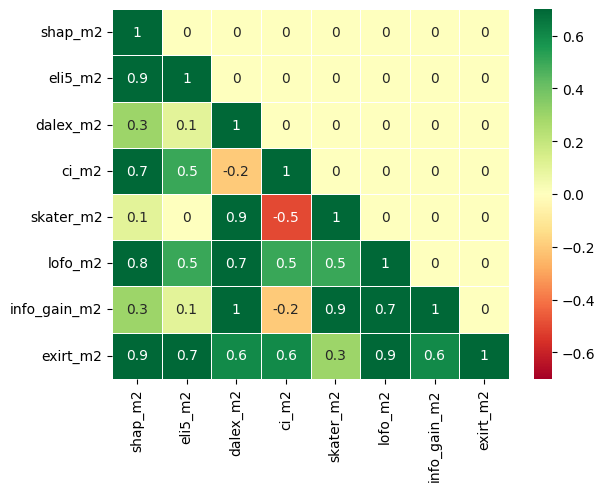

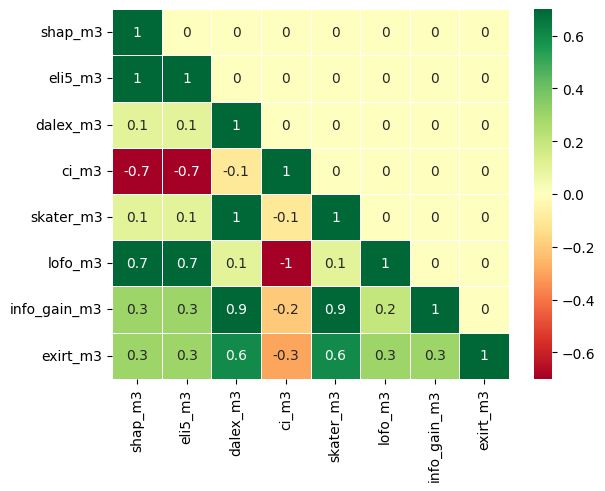

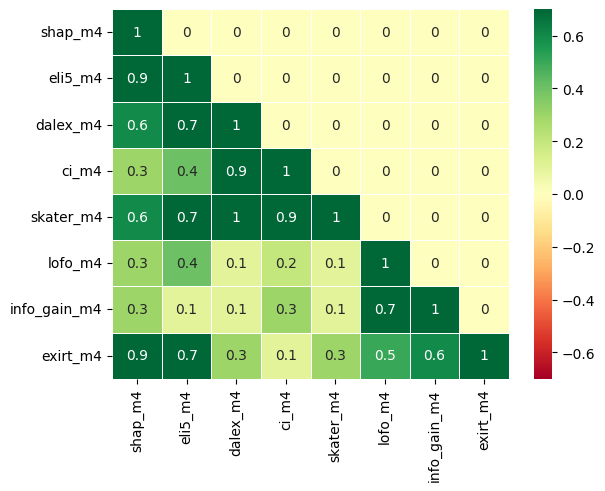

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: phoneme
Version.......: 1
Format........: ARFF
Upload Date...: 2015-05-25 19:34:17
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/1592281/phoneme.arff
OpenML URL....: https://www.openml.org/d/1489
# of features.: 6
# of instances: 5404>
All numeric
            V1        V2        V3        V4        V5
0     0.489927 -0.451528 -1.047990 -0.598693 -0.020418
1    -0.641265  0.109245  0.292130 -0.916804  0.240223
2     0.870593 -0.459862  0.578159  0.806634  0.835248
3    -0.628439 -0.316284  1.934295 -1.427099 -0.136583
4    -0.596399  0.015938  2.043206 -1.688448 -0.948127
...        ...       ...       ...       ...       ...
5399 -0.658318  1.331760 -0.081621  1.794253 -1.082181
5400 -0.044375 -0.010512  0.030989 -0.019379  1.281061
5401  0.246882 -0.793228  1.190101  1.423194 -1.303036
5402 -0.778907 -0.383111  1.727029 -1.432389 -1.208085
5403 -0.794604 -0.640053  0.632221  0.72028

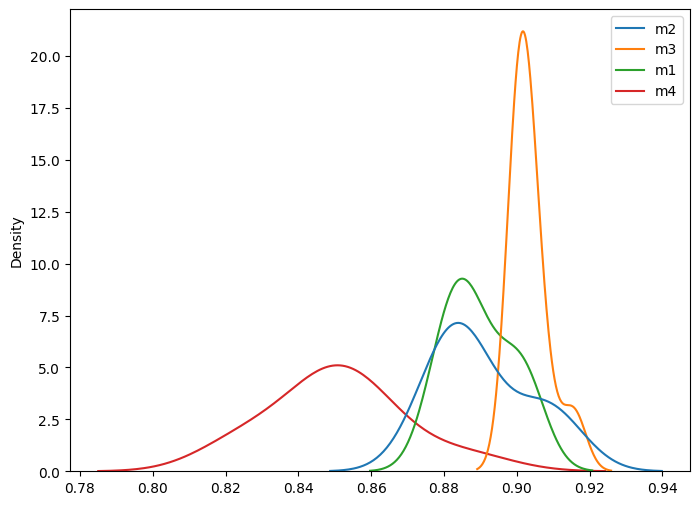

Friedman Test
FriedmanchisquareResult(statistic=20.999999999999993, pvalue=0.00010527618177149795)


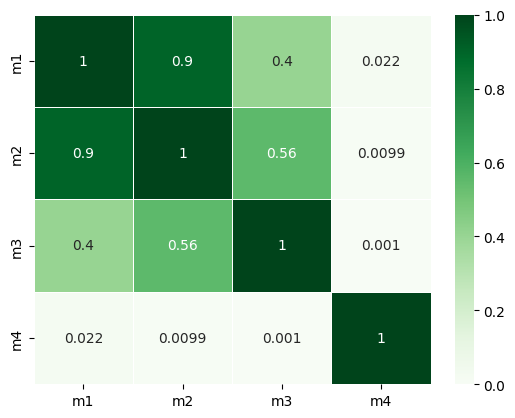

Friedman Test
FriedmanchisquareResult(statistic=20.999999999999993, pvalue=0.00010527618177149795)

Skater explaning...
Explaining M1...


2023-06-01 20:39:00,339 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 20:39:00,822 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 20:39:01,335 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 20:39:01,933 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/5 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/5 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/5 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/5 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


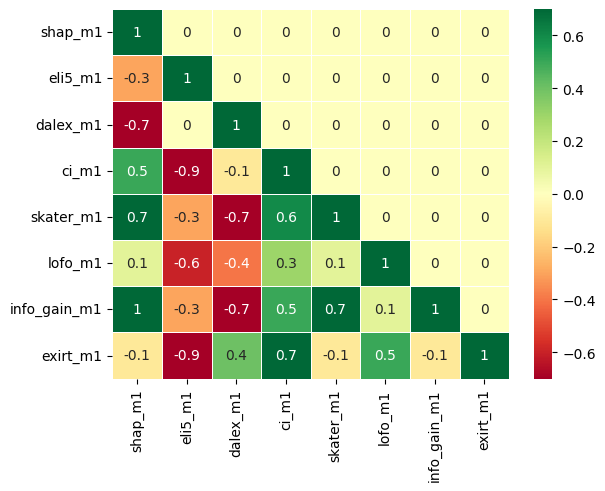

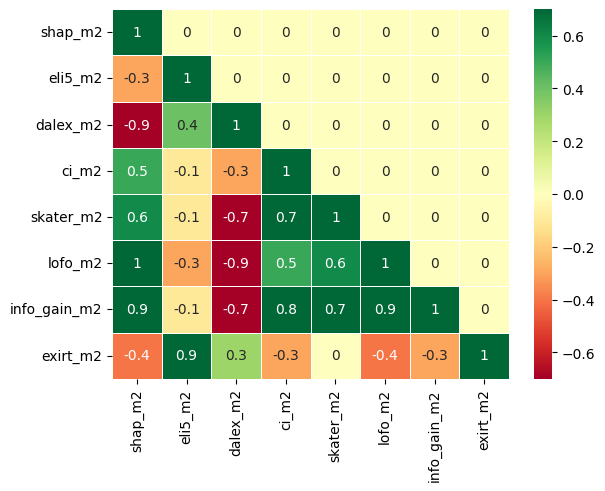

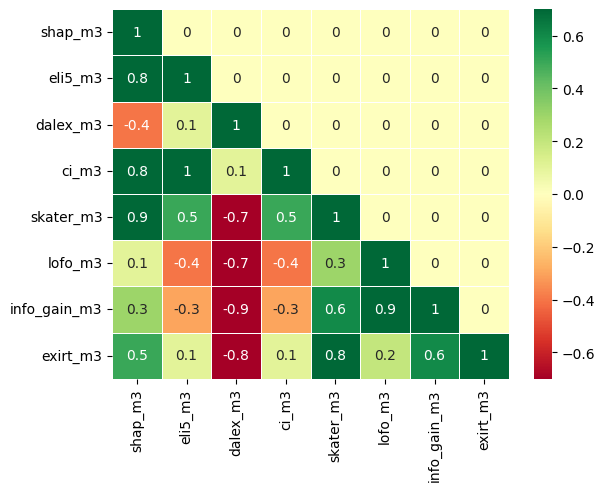

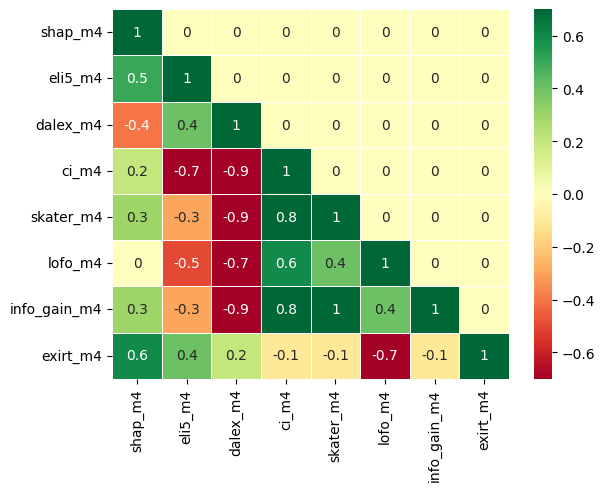

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: blood-transfusion-service-center
Version.......: 1
Format........: ARFF
Upload Date...: 2015-05-21 22:49:48
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/1586225/blood-transfusion-service-center.arff
OpenML URL....: https://www.openml.org/d/1464
# of features.: 5
# of instances: 748>
All numeric
     V1  V2       V3  V4
0     2  50  12500.0  98
1     0  13   3250.0  28
2     1  16   4000.0  35
3     2  20   5000.0  45
4     1  24   6000.0  77
..   ..  ..      ...  ..
743  23   2    500.0  38
744  21   2    500.0  52
745  23   3    750.0  62
746  39   1    250.0  39
747  72   1    250.0  72

[748 rows x 4 columns]
          V1        V2        V3        V4
0   0.027027  1.000000  1.000000  1.000000
1   0.000000  0.244898  0.244898  0.270833
2   0.013514  0.306122  0.306122  0.343750
3   0.027027  0.387755  0.387755  0.447917
4   0.013514  0.469388  0.469388  0.781250
..       ...     

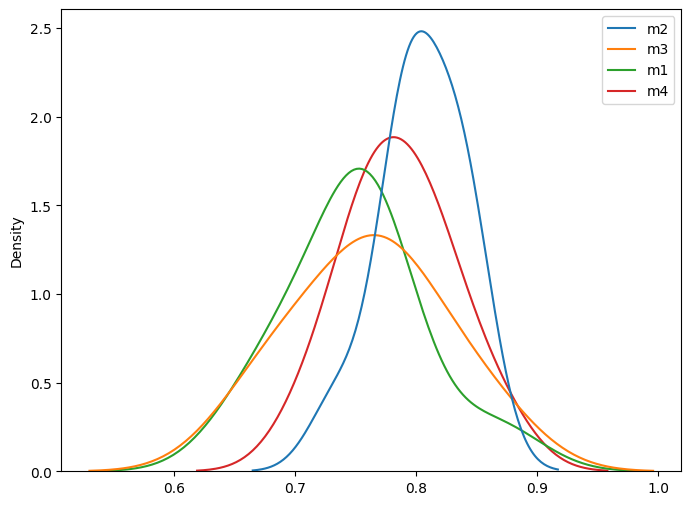

Friedman Test
FriedmanchisquareResult(statistic=11.700000000000001, pvalue=0.008484778864305095)


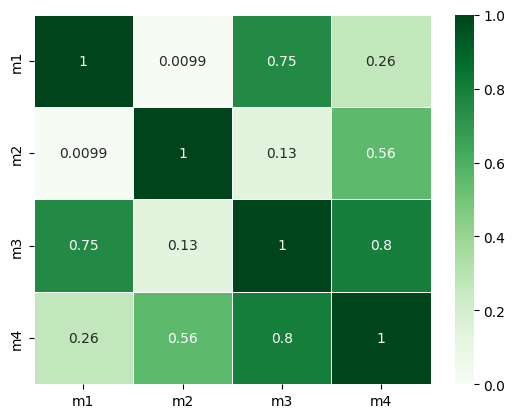

Friedman Test
FriedmanchisquareResult(statistic=11.700000000000001, pvalue=0.008484778864305095)

Skater explaning...
Explaining M1...


2023-06-01 20:51:24,737 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 20:51:25,132 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 20:51:25,462 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 20:51:25,869 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/4 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/4 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/4 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/4 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


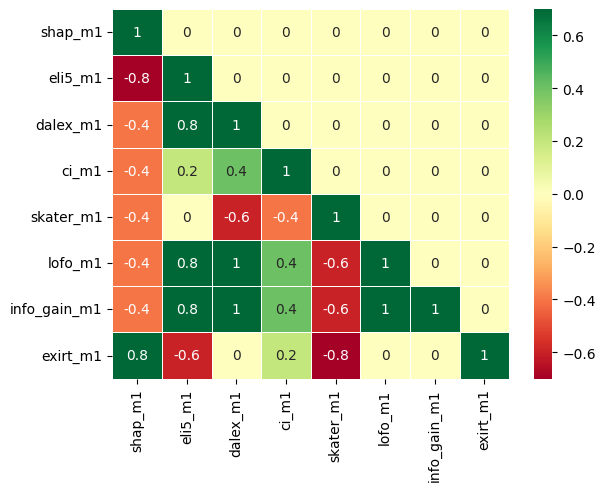

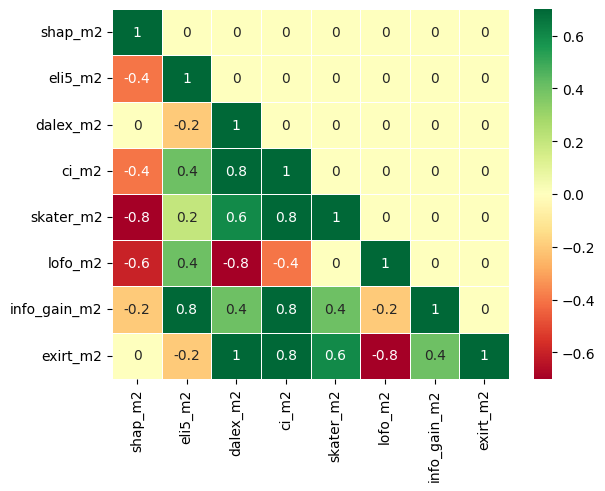

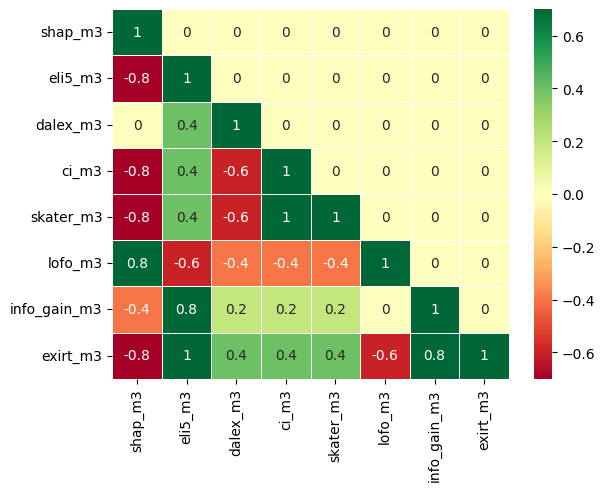

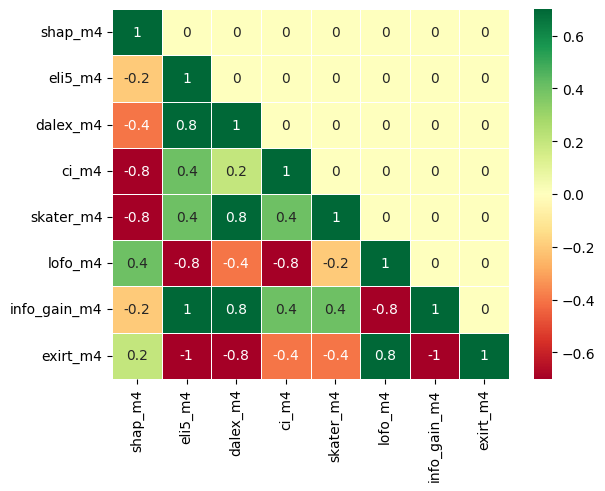

<bound method OpenMLDataset.get_data of OpenML Dataset
Name..........: banknote-authentication
Version.......: 1
Format........: ARFF
Upload Date...: 2015-05-21 22:40:57
Licence.......: Public
Download URL..: https://api.openml.org/data/v1/download/1586223/banknote-authentication.arff
OpenML URL....: https://www.openml.org/d/1462
# of features.: 5
# of instances: 1372>
All numeric
           V1        V2       V3       V4
0     3.62160   8.66610  -2.8073 -0.44699
1     4.54590   8.16740  -2.4586 -1.46210
2     3.86600  -2.63830   1.9242  0.10645
3     3.45660   9.52280  -4.0112 -3.59440
4     0.32924  -4.45520   4.5718 -0.98880
...       ...       ...      ...      ...
1367  0.40614   1.34920  -1.4501 -0.55949
1368 -1.38870  -4.87730   6.4774  0.34179
1369 -3.75030 -13.45860  17.5932 -2.77710
1370 -3.56370  -8.38270  12.3930 -1.28230
1371 -2.54190  -0.65804   2.6842  1.19520

[1372 rows x 4 columns]
          V1        V2        V3        V4
0   0.769004  0.839643  0.106783  0.736628
1

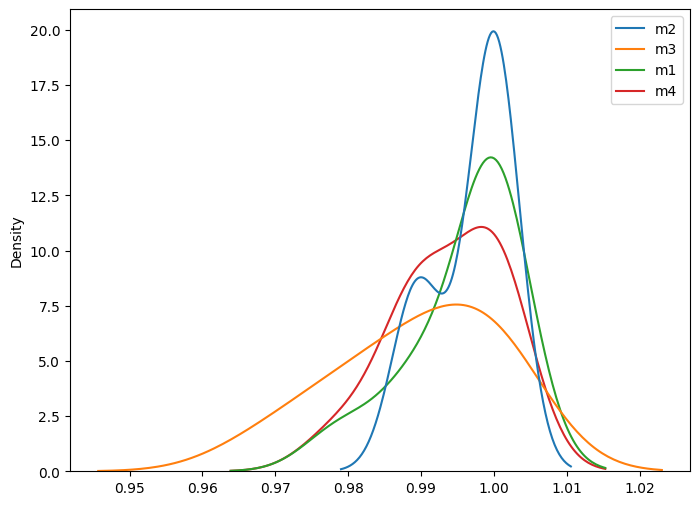

Friedman Test
FriedmanchisquareResult(statistic=6.571428571428549, pvalue=0.08688770382064456)


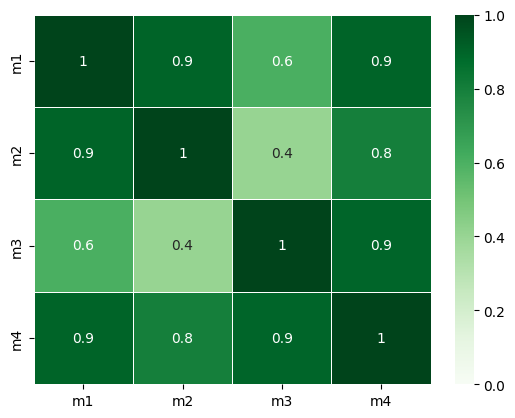

Friedman Test
FriedmanchisquareResult(statistic=6.571428571428549, pvalue=0.08688770382064456)

Skater explaning...
Explaining M1...


2023-06-01 20:54:16,317 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M2...


2023-06-01 20:54:16,580 - skater.core.explanations - WARNING - Multiprocessing failed, going single process
2023-06-01 20:54:16,826 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


Explaining M4...


2023-06-01 20:54:17,117 - skater.core.explanations - WARNING - Multiprocessing failed, going single process



Eli5 explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Shap explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Dalex explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

CI explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Lofo explaning...
Explaining M1...


  0%|          | 0/4 [00:00<?, ?it/s]

Explaining M2...


  0%|          | 0/4 [00:00<?, ?it/s]

Explaining M3...


  0%|          | 0/4 [00:00<?, ?it/s]

Explaining M4...


  0%|          | 0/4 [00:00<?, ?it/s]


eXirt explaning...
Explaining M1...
Explaining M2...
Explaining M3...
Explaining M4...

Infomation gain rank...
Info rank 1...
Info rank 2...
Info rank 3...
Info rank 4...


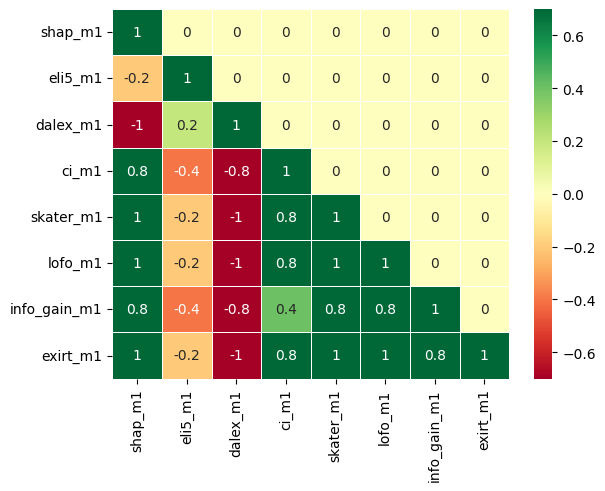

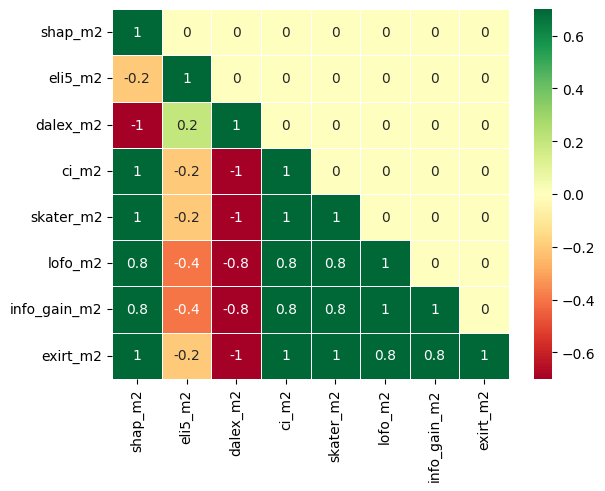

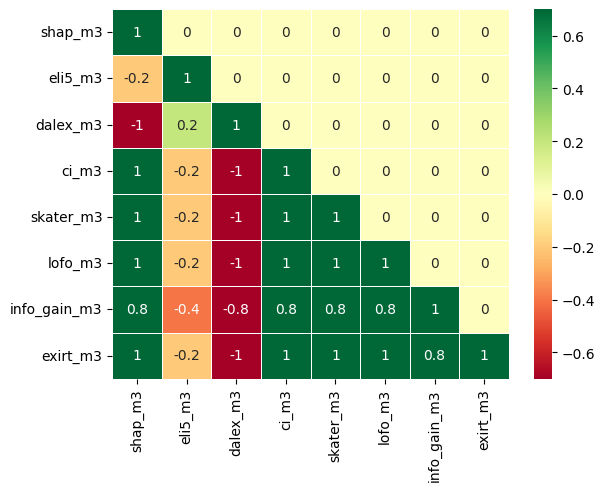

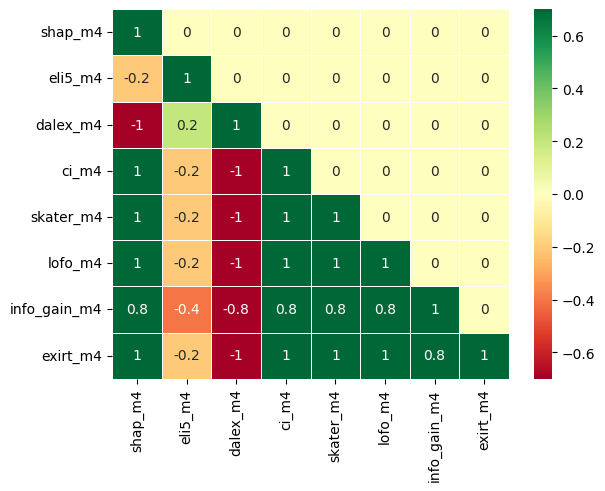

In [ ]:
cluster = 3

df_prop_tmp = df_dataset_properties.query(k_cluster_selected + ' == '+str(cluster))
list_dataset = list(df_dataset_properties.query(k_cluster_selected + ' == '+str(cluster)).index)
dfs_ret_3, df_dataset_properties_cluster_3, models_name_3, df_friedman_resume_3, df_accuracy_resume_3, df_precision_resume_3, df_recall_resume_3 = main_benchmark(list_dataset, df_prop_tmp,cluster_name=str(cluster))

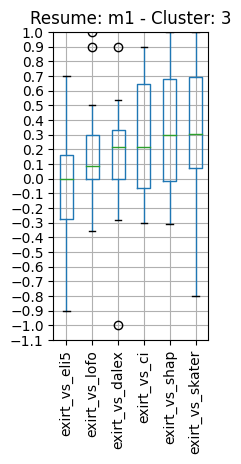

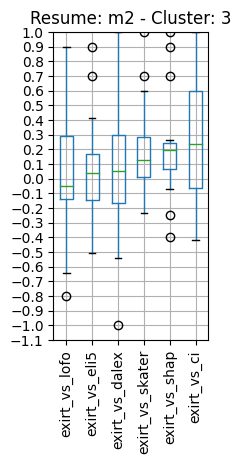

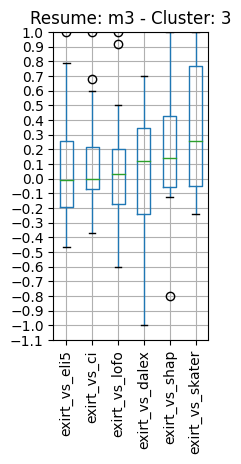

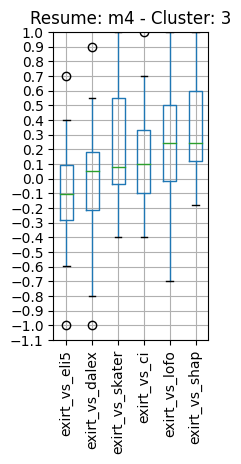

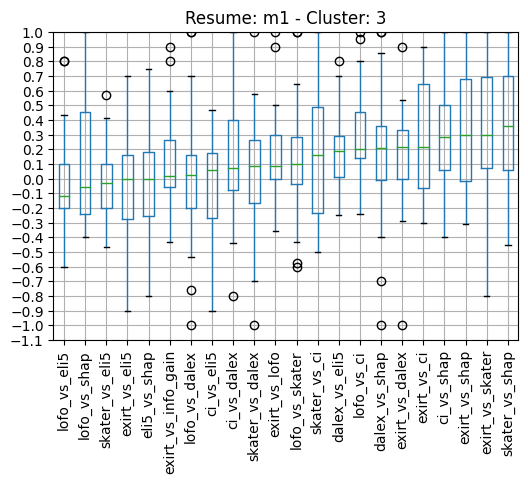

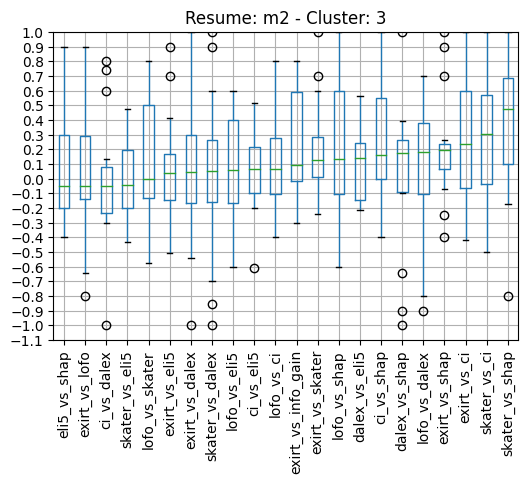

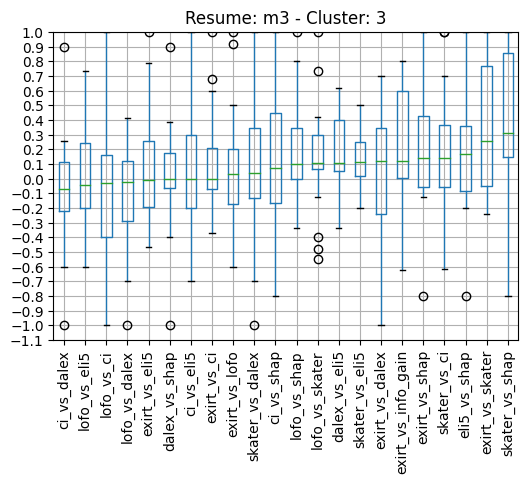

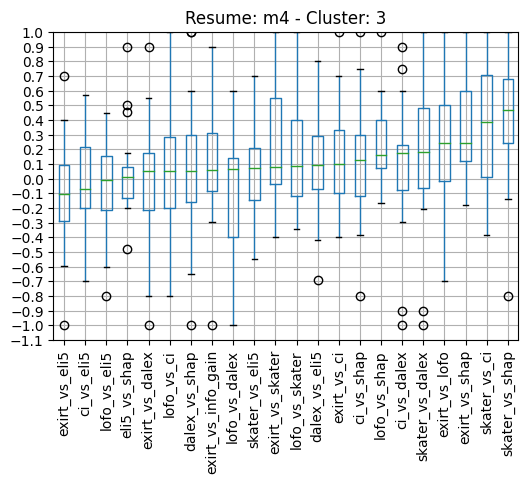

(0.0, 1.0)

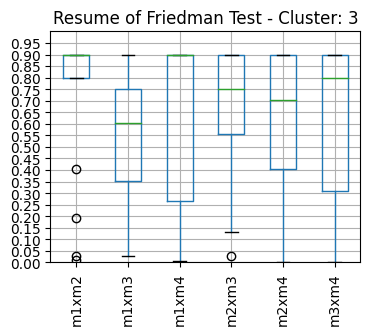

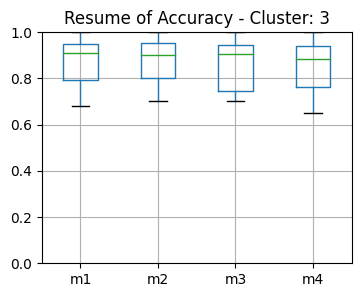

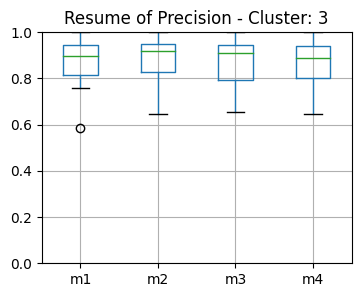

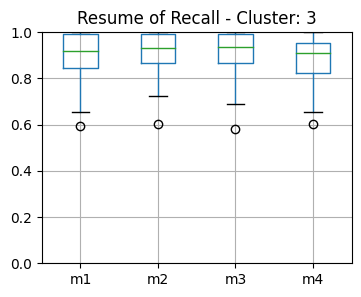

In [ ]:
plot_resume_eXirt(dfs_ret_3, df_dataset_properties_cluster_3, models_name_3, cluster)

plot_resume(dfs_ret_3, df_dataset_properties_cluster_3, models_name_3, cluster)

figure(figsize=(4, 3), dpi=100)
axes = df_friedman_resume_3.boxplot(return_type = 'axes',rot=90)
plt.title('Resume of Friedman Test - Cluster: '+ str(cluster))
major_ticks = np.arange(0, 1, 0.05)
axes.set_yticks(major_ticks)
axes.set_ylim(0, 1)

figure(figsize=(4,3), dpi=100)
axes = df_accuracy_resume_3.boxplot(return_type = 'axes')
plt.title('Resume of Accuracy - Cluster: '+ str(cluster))
axes.set_ylim(0, 1)

figure(figsize=(4,3), dpi=100)
axes = df_precision_resume_3.boxplot(return_type = 'axes')
plt.title('Resume of Precision - Cluster: '+ str(cluster))
axes.set_ylim(0, 1)

figure(figsize=(4,3), dpi=100)
axes = df_recall_resume_3.boxplot(return_type = 'axes')
plt.title('Resume of Recall - Cluster: '+ str(cluster))
axes.set_ylim(0, 1)

In [ ]:
!zip -r '/content/workspace_cluster_'$cluster'.zip' /content
if do_download_workspace:
  files.download('/content/workspace_cluster_'+str(cluster)+'.zip')

  adding: content/ (stored 0%)
  adding: content/.config/ (stored 0%)
  adding: content/.config/configurations/ (stored 0%)
  adding: content/.config/configurations/config_default (deflated 15%)
  adding: content/.config/active_config (stored 0%)
  adding: content/.config/logs/ (stored 0%)
  adding: content/.config/logs/2023.05.31/ (stored 0%)
  adding: content/.config/logs/2023.05.31/13.44.53.488326.log (deflated 91%)
  adding: content/.config/logs/2023.05.31/13.46.25.325188.log (deflated 56%)
  adding: content/.config/logs/2023.05.31/13.45.46.962882.log (deflated 86%)
  adding: content/.config/logs/2023.05.31/13.45.55.608474.log (deflated 57%)
  adding: content/.config/logs/2023.05.31/13.46.24.421311.log (deflated 57%)
  adding: content/.config/logs/2023.05.31/13.45.18.951664.log (deflated 58%)
  adding: content/.config/gce (stored 0%)
  adding: content/.config/.last_update_check.json (deflated 22%)
  adding: content/.config/config_sentinel (stored 0%)
  adding: content/.config/.last

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Camada de Visualização


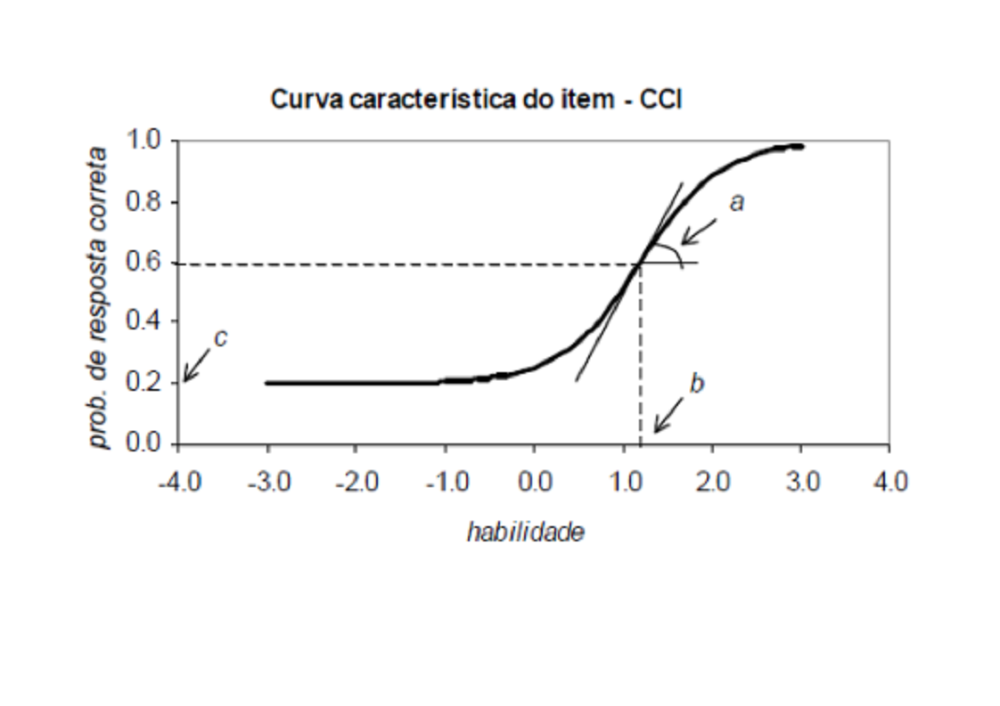

In [ ]:
plt.figure(figsize=(10,10))
for i,_ in enumerate(rirt.index):
  x_axis = linspace(-10, 10, 100)

  #Modelo Logistico de 3 parâmetros
  a = rirt.iloc[i]['Discriminacao']
  b = rirt.iloc[i]['Dificuldade']
  c = rirt.iloc[i]['Adivinhacao']

  y_axis = c + (1 - c) * (1/(1+math.e**(-a*(x_axis - b))))

  plt.plot(x_axis, y_axis)

plt.xlabel('Habilidade',fontsize=15)
plt.ylabel('Prob. resposta correta',fontsize=15)
plt.title('CCI - 3', fontsize=15)

NameError: ignored

<Figure size 1000x1000 with 0 Axes>

In [ ]:
plt.figure(figsize=(10,10))

for i,_ in enumerate(rirt.index):
  x_axis = linspace(-15, 15, 100)

  #Modelo Hash
  b = rirt.iloc[i]['Dificuldade']

  y_axis = 1 / (1+math.e**(-(x_axis - b)))

  plt.plot(x_axis, y_axis)

plt.xlabel('Dificuldade',fontsize=15)
plt.ylabel('Prob. resposta correta',fontsize=15)
plt.title('Modelo Hash', fontsize=15)

NameError: ignored

<Figure size 1000x1000 with 0 Axes>